In [108]:
# https://stable-baselines3.readthedocs.io/en/master/guide/rl.html
# https://spinningup.openai.com/en/latest/spinningup/rl_intro2.html#a-taxonomy-of-rl-algorithms

# 1. Import dependencies

In [109]:
import torch as torch
torch._C._cuda_getDeviceCount() > 0

True

In [110]:
import os
import gym 
from stable_baselines3 import DQN
from stable_baselines3.common.vec_env import DummyVecEnv
from stable_baselines3.common.evaluation import evaluate_policy

# 2. Load and Test Environment

In [111]:
#environment_name = "Pong-v0"
#rewards = [[1,0,5], [1,10,4], [1,4,6]]
#rewards = [[1,0,8], [1,10,3]]
#rewards = [[1,7,5],[1,0,4]]
rewards = [[1,0,5]]

In [112]:
#env = gym.make(environment_name)
from GridEnv import WindyGridworld
env = WindyGridworld(
        height=20,
        width=11,
        rewards=rewards,
        wind=True,
        allowed_actions=['L', 'R', 'C'],
        reward_terminates_episode=False
    )

In [113]:
episodes = 5
for episode in range(1, episodes+1):
    state = env.reset()
    done = False
    score = 0 
    
    while not done:
        env.render()
        action = env.action_space.sample()
        n_state, reward, done, info = env.step(action)
        score+=reward
    print('Episode:{} Score:{}'.format(episode, score))
env.close()

QObject::moveToThread: Current thread (0x55bde1abcbc0) is not the object's thread (0x55bde217e8a0).
Cannot move to target thread (0x55bde1abcbc0)

QObject::moveToThread: Current thread (0x55bde1abcbc0) is not the object's thread (0x55bde217e8a0).
Cannot move to target thread (0x55bde1abcbc0)

QObject::moveToThread: Current thread (0x55bde1abcbc0) is not the object's thread (0x55bde217e8a0).
Cannot move to target thread (0x55bde1abcbc0)

QObject::moveToThread: Current thread (0x55bde1abcbc0) is not the object's thread (0x55bde217e8a0).
Cannot move to target thread (0x55bde1abcbc0)

QObject::moveToThread: Current thread (0x55bde1abcbc0) is not the object's thread (0x55bde217e8a0).
Cannot move to target thread (0x55bde1abcbc0)

QObject::moveToThread: Current thread (0x55bde1abcbc0) is not the object's thread (0x55bde217e8a0).
Cannot move to target thread (0x55bde1abcbc0)

QObject::moveToThread: Current thread (0x55bde1abcbc0) is not the object's thread (0x55bde217e8a0).
Cannot move to tar

Episode:1 Score:0
Episode:2 Score:0
Episode:3 Score:0
Episode:4 Score:0
Episode:5 Score:0


# 3. Train an RL Model

In [114]:
from Net_Qtable import Network_Qtable


In [115]:
from stable_baselines3.common.evaluation import evaluate_policy

In [116]:
log_path = os.path.join('Training','Logs')


In [117]:
from stable_baselines3.common.callbacks import EvalCallback, StopTrainingOnRewardThreshold

In [118]:
save_path = os.path.join('Training', 'Saved Models')
log_path = os.path.join('Training', 'Logs Bias Only', 'Env 1')

In [119]:
from GridEnv import WindyGridworld
env = env = WindyGridworld(
        height=20,
        width=11,
        rewards=rewards,
        wind=True,
        allowed_actions=['L', 'R', 'C'],
        reward_terminates_episode=False
    )

print(env.rewards)


[[1, 0, 5]]


In [120]:
stop_callback = StopTrainingOnRewardThreshold(reward_threshold=2, verbose=1)
eval_callback = EvalCallback(env, 
                             callback_on_new_best=stop_callback, 
                             eval_freq=10000, 
                             best_model_save_path=save_path, 
                             verbose=1)

In [121]:
# try 0.2 exploration period
model = DQN('CnnPolicy', env, exploration_fraction=0.8,
  exploration_final_eps=0.1,learning_starts=100000, verbose = 1, buffer_size = 50000,target_update_interval=1000, tensorboard_log=log_path)

Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Wrapping the env in a VecTransposeImage.


In [122]:
env_dummy = WindyGridworld(
        height=20,
        width=11,
        rewards=rewards,
        wind=True,
        allowed_actions=['L', 'R', 'C'],
        reward_terminates_episode=False
    )


img_init = Network_Qtable(model,env)

In [123]:
model.learn(total_timesteps=1000000,callback=eval_callback, tb_log_name='Env1_Baseline_0.8exp_1M')

Logging to Training/Logs Bias Only/Env 1/Env1_Baseline_0.8exp_1M_3
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 1        |
| time/               |          |
|    episodes         | 4        |
|    fps              | 3051     |
|    time_elapsed     | 0        |
|    total_timesteps  | 71       |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 1        |
| time/               |          |
|    episodes         | 8        |
|    fps              | 3175     |
|    time_elapsed     | 0        |
|    total_timesteps  | 131      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.167    |
|    exploration_rate |

/usr/local/lib/python3.9/site-packages/stable_baselines3/common/callbacks.py:345: UserWarning: Training and eval env are not of the same type<stable_baselines3.common.vec_env.vec_transpose.VecTransposeImage object at 0x7fe7505a8a00> != <stable_baselines3.common.vec_env.dummy_vec_env.DummyVecEnv object at 0x7fe7502c6fd0>
  warnings.warn("Training and eval env are not of the same type" f"{self.training_env} != {self.eval_env}")


----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.182    |
|    exploration_rate | 0.999    |
| time/               |          |
|    episodes         | 44       |
|    fps              | 3319     |
|    time_elapsed     | 0        |
|    total_timesteps  | 686      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.167    |
|    exploration_rate | 0.999    |
| time/               |          |
|    episodes         | 48       |
|    fps              | 3321     |
|    time_elapsed     | 0        |
|    total_timesteps  | 738      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.154    |
|    exploration_rate | 0.999    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.998    |
| time/               |          |
|    episodes         | 132      |
|    fps              | 3241     |
|    time_elapsed     | 0        |
|    total_timesteps  | 1944     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.998    |
| time/               |          |
|    episodes         | 136      |
|    fps              | 3240     |
|    time_elapsed     | 0        |
|    total_timesteps  | 2005     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.998    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.996    |
| time/               |          |
|    episodes         | 220      |
|    fps              | 3234     |
|    time_elapsed     | 1        |
|    total_timesteps  | 3277     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.996    |
| time/               |          |
|    episodes         | 224      |
|    fps              | 3212     |
|    time_elapsed     | 1        |
|    total_timesteps  | 3336     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.996    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.995    |
| time/               |          |
|    episodes         | 308      |
|    fps              | 3093     |
|    time_elapsed     | 1        |
|    total_timesteps  | 4514     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.995    |
| time/               |          |
|    episodes         | 312      |
|    fps              | 3098     |
|    time_elapsed     | 1        |
|    total_timesteps  | 4594     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.995    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.994    |
| time/               |          |
|    episodes         | 396      |
|    fps              | 3129     |
|    time_elapsed     | 1        |
|    total_timesteps  | 5730     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.994    |
| time/               |          |
|    episodes         | 400      |
|    fps              | 3129     |
|    time_elapsed     | 1        |
|    total_timesteps  | 5758     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.993    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.992    |
| time/               |          |
|    episodes         | 484      |
|    fps              | 3179     |
|    time_elapsed     | 2        |
|    total_timesteps  | 7102     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.992    |
| time/               |          |
|    episodes         | 488      |
|    fps              | 3182     |
|    time_elapsed     | 2        |
|    total_timesteps  | 7177     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.992    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.991    |
| time/               |          |
|    episodes         | 572      |
|    fps              | 3200     |
|    time_elapsed     | 2        |
|    total_timesteps  | 8426     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.99     |
| time/               |          |
|    episodes         | 576      |
|    fps              | 3201     |
|    time_elapsed     | 2        |
|    total_timesteps  | 8498     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.99     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.989    |
| time/               |          |
|    episodes         | 660      |
|    fps              | 3195     |
|    time_elapsed     | 3        |
|    total_timesteps  | 9796     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.989    |
| time/               |          |
|    episodes         | 664      |
|    fps              | 3195     |
|    time_elapsed     | 3        |
|    total_timesteps  | 9857     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.989    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.987    |
| time/               |          |
|    episodes         | 744      |
|    fps              | 3099     |
|    time_elapsed     | 3        |
|    total_timesteps  | 11113    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.987    |
| time/               |          |
|    episodes         | 748      |
|    fps              | 3099     |
|    time_elapsed     | 3        |
|    total_timesteps  | 11155    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.987    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.986    |
| time/               |          |
|    episodes         | 832      |
|    fps              | 3094     |
|    time_elapsed     | 3        |
|    total_timesteps  | 12316    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.986    |
| time/               |          |
|    episodes         | 836      |
|    fps              | 3093     |
|    time_elapsed     | 4        |
|    total_timesteps  | 12380    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.986    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.985    |
| time/               |          |
|    episodes         | 920      |
|    fps              | 3074     |
|    time_elapsed     | 4        |
|    total_timesteps  | 13642    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.985    |
| time/               |          |
|    episodes         | 924      |
|    fps              | 3074     |
|    time_elapsed     | 4        |
|    total_timesteps  | 13717    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.984    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.983    |
| time/               |          |
|    episodes         | 1008     |
|    fps              | 3073     |
|    time_elapsed     | 4        |
|    total_timesteps  | 14925    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.983    |
| time/               |          |
|    episodes         | 1012     |
|    fps              | 3074     |
|    time_elapsed     | 4        |
|    total_timesteps  | 15005    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.983    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.982    |
| time/               |          |
|    episodes         | 1096     |
|    fps              | 3097     |
|    time_elapsed     | 5        |
|    total_timesteps  | 16290    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.982    |
| time/               |          |
|    episodes         | 1100     |
|    fps              | 3098     |
|    time_elapsed     | 5        |
|    total_timesteps  | 16352    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.982    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.98     |
| time/               |          |
|    episodes         | 1184     |
|    fps              | 3117     |
|    time_elapsed     | 5        |
|    total_timesteps  | 17625    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.98     |
| time/               |          |
|    episodes         | 1188     |
|    fps              | 3119     |
|    time_elapsed     | 5        |
|    total_timesteps  | 17701    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.98     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.979    |
| time/               |          |
|    episodes         | 1272     |
|    fps              | 3133     |
|    time_elapsed     | 6        |
|    total_timesteps  | 18966    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.979    |
| time/               |          |
|    episodes         | 1276     |
|    fps              | 3133     |
|    time_elapsed     | 6        |
|    total_timesteps  | 19024    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.979    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.977    |
| time/               |          |
|    episodes         | 1356     |
|    fps              | 3129     |
|    time_elapsed     | 6        |
|    total_timesteps  | 20174    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.977    |
| time/               |          |
|    episodes         | 1360     |
|    fps              | 3130     |
|    time_elapsed     | 6        |
|    total_timesteps  | 20240    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.977    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.976    |
| time/               |          |
|    episodes         | 1444     |
|    fps              | 3143     |
|    time_elapsed     | 6        |
|    total_timesteps  | 21562    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.976    |
| time/               |          |
|    episodes         | 1448     |
|    fps              | 3143     |
|    time_elapsed     | 6        |
|    total_timesteps  | 21611    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.976    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.974    |
| time/               |          |
|    episodes         | 1532     |
|    fps              | 3153     |
|    time_elapsed     | 7        |
|    total_timesteps  | 22867    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.974    |
| time/               |          |
|    episodes         | 1536     |
|    fps              | 3154     |
|    time_elapsed     | 7        |
|    total_timesteps  | 22927    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.974    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.973    |
| time/               |          |
|    episodes         | 1620     |
|    fps              | 3161     |
|    time_elapsed     | 7        |
|    total_timesteps  | 24122    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.973    |
| time/               |          |
|    episodes         | 1624     |
|    fps              | 3161     |
|    time_elapsed     | 7        |
|    total_timesteps  | 24163    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.973    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.971    |
| time/               |          |
|    episodes         | 1708     |
|    fps              | 3173     |
|    time_elapsed     | 8        |
|    total_timesteps  | 25439    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.971    |
| time/               |          |
|    episodes         | 1712     |
|    fps              | 3174     |
|    time_elapsed     | 8        |
|    total_timesteps  | 25515    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.971    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.97     |
| time/               |          |
|    episodes         | 1796     |
|    fps              | 3175     |
|    time_elapsed     | 8        |
|    total_timesteps  | 26776    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.97     |
| time/               |          |
|    episodes         | 1800     |
|    fps              | 3175     |
|    time_elapsed     | 8        |
|    total_timesteps  | 26828    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.97     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.7     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.969    |
| time/               |          |
|    episodes         | 1884     |
|    fps              | 3179     |
|    time_elapsed     | 8        |
|    total_timesteps  | 27884    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.969    |
| time/               |          |
|    episodes         | 1888     |
|    fps              | 3179     |
|    time_elapsed     | 8        |
|    total_timesteps  | 27929    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.969    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.967    |
| time/               |          |
|    episodes         | 1972     |
|    fps              | 3186     |
|    time_elapsed     | 9        |
|    total_timesteps  | 29131    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.967    |
| time/               |          |
|    episodes         | 1976     |
|    fps              | 3187     |
|    time_elapsed     | 9        |
|    total_timesteps  | 29184    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.967    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.966    |
| time/               |          |
|    episodes         | 2056     |
|    fps              | 3185     |
|    time_elapsed     | 9        |
|    total_timesteps  | 30405    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.966    |
| time/               |          |
|    episodes         | 2060     |
|    fps              | 3185     |
|    time_elapsed     | 9        |
|    total_timesteps  | 30448    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.966    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.964    |
| time/               |          |
|    episodes         | 2144     |
|    fps              | 3192     |
|    time_elapsed     | 9        |
|    total_timesteps  | 31701    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.964    |
| time/               |          |
|    episodes         | 2148     |
|    fps              | 3192     |
|    time_elapsed     | 9        |
|    total_timesteps  | 31780    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.964    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.963    |
| time/               |          |
|    episodes         | 2232     |
|    fps              | 3194     |
|    time_elapsed     | 10       |
|    total_timesteps  | 32980    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.963    |
| time/               |          |
|    episodes         | 2236     |
|    fps              | 3194     |
|    time_elapsed     | 10       |
|    total_timesteps  | 33032    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.963    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.961    |
| time/               |          |
|    episodes         | 2320     |
|    fps              | 3202     |
|    time_elapsed     | 10       |
|    total_timesteps  | 34299    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.961    |
| time/               |          |
|    episodes         | 2324     |
|    fps              | 3202     |
|    time_elapsed     | 10       |
|    total_timesteps  | 34366    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.961    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.96     |
| time/               |          |
|    episodes         | 2408     |
|    fps              | 3208     |
|    time_elapsed     | 11       |
|    total_timesteps  | 35541    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.96     |
| time/               |          |
|    episodes         | 2412     |
|    fps              | 3208     |
|    time_elapsed     | 11       |
|    total_timesteps  | 35593    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.96     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.959    |
| time/               |          |
|    episodes         | 2496     |
|    fps              | 3213     |
|    time_elapsed     | 11       |
|    total_timesteps  | 36822    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.959    |
| time/               |          |
|    episodes         | 2500     |
|    fps              | 3213     |
|    time_elapsed     | 11       |
|    total_timesteps  | 36885    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.958    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.957    |
| time/               |          |
|    episodes         | 2584     |
|    fps              | 3220     |
|    time_elapsed     | 11       |
|    total_timesteps  | 38259    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.957    |
| time/               |          |
|    episodes         | 2588     |
|    fps              | 3220     |
|    time_elapsed     | 11       |
|    total_timesteps  | 38339    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.957    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.956    |
| time/               |          |
|    episodes         | 2672     |
|    fps              | 3225     |
|    time_elapsed     | 12       |
|    total_timesteps  | 39496    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.955    |
| time/               |          |
|    episodes         | 2676     |
|    fps              | 3225     |
|    time_elapsed     | 12       |
|    total_timesteps  | 39560    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.955    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.954    |
| time/               |          |
|    episodes         | 2756     |
|    fps              | 3224     |
|    time_elapsed     | 12       |
|    total_timesteps  | 40792    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.954    |
| time/               |          |
|    episodes         | 2760     |
|    fps              | 3224     |
|    time_elapsed     | 12       |
|    total_timesteps  | 40834    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.954    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.953    |
| time/               |          |
|    episodes         | 2844     |
|    fps              | 3227     |
|    time_elapsed     | 13       |
|    total_timesteps  | 42056    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.953    |
| time/               |          |
|    episodes         | 2848     |
|    fps              | 3227     |
|    time_elapsed     | 13       |
|    total_timesteps  | 42101    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.953    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.951    |
| time/               |          |
|    episodes         | 2932     |
|    fps              | 3223     |
|    time_elapsed     | 13       |
|    total_timesteps  | 43236    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.951    |
| time/               |          |
|    episodes         | 2936     |
|    fps              | 3223     |
|    time_elapsed     | 13       |
|    total_timesteps  | 43296    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.951    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.95     |
| time/               |          |
|    episodes         | 3020     |
|    fps              | 3228     |
|    time_elapsed     | 13       |
|    total_timesteps  | 44431    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.95     |
| time/               |          |
|    episodes         | 3024     |
|    fps              | 3229     |
|    time_elapsed     | 13       |
|    total_timesteps  | 44508    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.95     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.949    |
| time/               |          |
|    episodes         | 3108     |
|    fps              | 3233     |
|    time_elapsed     | 14       |
|    total_timesteps  | 45666    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.949    |
| time/               |          |
|    episodes         | 3112     |
|    fps              | 3234     |
|    time_elapsed     | 14       |
|    total_timesteps  | 45729    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.948    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.947    |
| time/               |          |
|    episodes         | 3196     |
|    fps              | 3238     |
|    time_elapsed     | 14       |
|    total_timesteps  | 47009    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.947    |
| time/               |          |
|    episodes         | 3200     |
|    fps              | 3238     |
|    time_elapsed     | 14       |
|    total_timesteps  | 47075    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.947    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.946    |
| time/               |          |
|    episodes         | 3284     |
|    fps              | 3242     |
|    time_elapsed     | 14       |
|    total_timesteps  | 48307    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.946    |
| time/               |          |
|    episodes         | 3288     |
|    fps              | 3242     |
|    time_elapsed     | 14       |
|    total_timesteps  | 48365    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.946    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.944    |
| time/               |          |
|    episodes         | 3372     |
|    fps              | 3245     |
|    time_elapsed     | 15       |
|    total_timesteps  | 49659    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.944    |
| time/               |          |
|    episodes         | 3376     |
|    fps              | 3246     |
|    time_elapsed     | 15       |
|    total_timesteps  | 49700    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.944    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.943    |
| time/               |          |
|    episodes         | 3456     |
|    fps              | 3245     |
|    time_elapsed     | 15       |
|    total_timesteps  | 50857    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.943    |
| time/               |          |
|    episodes         | 3460     |
|    fps              | 3246     |
|    time_elapsed     | 15       |
|    total_timesteps  | 50921    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.943    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.941    |
| time/               |          |
|    episodes         | 3544     |
|    fps              | 3253     |
|    time_elapsed     | 16       |
|    total_timesteps  | 52266    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.941    |
| time/               |          |
|    episodes         | 3548     |
|    fps              | 3253     |
|    time_elapsed     | 16       |
|    total_timesteps  | 52307    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.941    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.94     |
| time/               |          |
|    episodes         | 3632     |
|    fps              | 3259     |
|    time_elapsed     | 16       |
|    total_timesteps  | 53590    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.94     |
| time/               |          |
|    episodes         | 3636     |
|    fps              | 3260     |
|    time_elapsed     | 16       |
|    total_timesteps  | 53669    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.94     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.938    |
| time/               |          |
|    episodes         | 3720     |
|    fps              | 3266     |
|    time_elapsed     | 16       |
|    total_timesteps  | 54872    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.938    |
| time/               |          |
|    episodes         | 3724     |
|    fps              | 3266     |
|    time_elapsed     | 16       |
|    total_timesteps  | 54939    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.938    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.937    |
| time/               |          |
|    episodes         | 3808     |
|    fps              | 3270     |
|    time_elapsed     | 17       |
|    total_timesteps  | 56115    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.937    |
| time/               |          |
|    episodes         | 3812     |
|    fps              | 3270     |
|    time_elapsed     | 17       |
|    total_timesteps  | 56157    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.937    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.935    |
| time/               |          |
|    episodes         | 3896     |
|    fps              | 3275     |
|    time_elapsed     | 17       |
|    total_timesteps  | 57408    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.935    |
| time/               |          |
|    episodes         | 3900     |
|    fps              | 3276     |
|    time_elapsed     | 17       |
|    total_timesteps  | 57471    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.935    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.934    |
| time/               |          |
|    episodes         | 3984     |
|    fps              | 3281     |
|    time_elapsed     | 17       |
|    total_timesteps  | 58664    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.934    |
| time/               |          |
|    episodes         | 3988     |
|    fps              | 3281     |
|    time_elapsed     | 17       |
|    total_timesteps  | 58740    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.934    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.933    |
| time/               |          |
|    episodes         | 4072     |
|    fps              | 3286     |
|    time_elapsed     | 18       |
|    total_timesteps  | 59865    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.933    |
| time/               |          |
|    episodes         | 4076     |
|    fps              | 3286     |
|    time_elapsed     | 18       |
|    total_timesteps  | 59901    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.933    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.931    |
| time/               |          |
|    episodes         | 4156     |
|    fps              | 3283     |
|    time_elapsed     | 18       |
|    total_timesteps  | 61083    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.931    |
| time/               |          |
|    episodes         | 4160     |
|    fps              | 3284     |
|    time_elapsed     | 18       |
|    total_timesteps  | 61156    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.931    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.93     |
| time/               |          |
|    episodes         | 4244     |
|    fps              | 3285     |
|    time_elapsed     | 19       |
|    total_timesteps  | 62438    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.93     |
| time/               |          |
|    episodes         | 4248     |
|    fps              | 3285     |
|    time_elapsed     | 19       |
|    total_timesteps  | 62511    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.93     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.928    |
| time/               |          |
|    episodes         | 4332     |
|    fps              | 3287     |
|    time_elapsed     | 19       |
|    total_timesteps  | 63712    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.928    |
| time/               |          |
|    episodes         | 4336     |
|    fps              | 3287     |
|    time_elapsed     | 19       |
|    total_timesteps  | 63783    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.928    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.927    |
| time/               |          |
|    episodes         | 4420     |
|    fps              | 3290     |
|    time_elapsed     | 19       |
|    total_timesteps  | 65029    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.927    |
| time/               |          |
|    episodes         | 4424     |
|    fps              | 3290     |
|    time_elapsed     | 19       |
|    total_timesteps  | 65075    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.927    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.925    |
| time/               |          |
|    episodes         | 4508     |
|    fps              | 3292     |
|    time_elapsed     | 20       |
|    total_timesteps  | 66258    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.925    |
| time/               |          |
|    episodes         | 4512     |
|    fps              | 3292     |
|    time_elapsed     | 20       |
|    total_timesteps  | 66302    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.925    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.924    |
| time/               |          |
|    episodes         | 4596     |
|    fps              | 3295     |
|    time_elapsed     | 20       |
|    total_timesteps  | 67629    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.924    |
| time/               |          |
|    episodes         | 4600     |
|    fps              | 3295     |
|    time_elapsed     | 20       |
|    total_timesteps  | 67690    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.924    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.923    |
| time/               |          |
|    episodes         | 4684     |
|    fps              | 3297     |
|    time_elapsed     | 20       |
|    total_timesteps  | 68882    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.922    |
| time/               |          |
|    episodes         | 4688     |
|    fps              | 3297     |
|    time_elapsed     | 20       |
|    total_timesteps  | 68943    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.922    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.921    |
| time/               |          |
|    episodes         | 4768     |
|    fps              | 3296     |
|    time_elapsed     | 21       |
|    total_timesteps  | 70086    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.921    |
| time/               |          |
|    episodes         | 4772     |
|    fps              | 3296     |
|    time_elapsed     | 21       |
|    total_timesteps  | 70143    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.921    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.92     |
| time/               |          |
|    episodes         | 4856     |
|    fps              | 3298     |
|    time_elapsed     | 21       |
|    total_timesteps  | 71319    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.92     |
| time/               |          |
|    episodes         | 4860     |
|    fps              | 3298     |
|    time_elapsed     | 21       |
|    total_timesteps  | 71365    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.92     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.918    |
| time/               |          |
|    episodes         | 4944     |
|    fps              | 3300     |
|    time_elapsed     | 22       |
|    total_timesteps  | 72653    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.918    |
| time/               |          |
|    episodes         | 4948     |
|    fps              | 3300     |
|    time_elapsed     | 22       |
|    total_timesteps  | 72696    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.918    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.917    |
| time/               |          |
|    episodes         | 5032     |
|    fps              | 3303     |
|    time_elapsed     | 22       |
|    total_timesteps  | 73937    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.917    |
| time/               |          |
|    episodes         | 5036     |
|    fps              | 3303     |
|    time_elapsed     | 22       |
|    total_timesteps  | 73994    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.917    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.915    |
| time/               |          |
|    episodes         | 5120     |
|    fps              | 3306     |
|    time_elapsed     | 22       |
|    total_timesteps  | 75328    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.915    |
| time/               |          |
|    episodes         | 5124     |
|    fps              | 3306     |
|    time_elapsed     | 22       |
|    total_timesteps  | 75401    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.915    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.914    |
| time/               |          |
|    episodes         | 5208     |
|    fps              | 3308     |
|    time_elapsed     | 23       |
|    total_timesteps  | 76469    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.9     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.914    |
| time/               |          |
|    episodes         | 5212     |
|    fps              | 3308     |
|    time_elapsed     | 23       |
|    total_timesteps  | 76507    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13       |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.914    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.913    |
| time/               |          |
|    episodes         | 5296     |
|    fps              | 3310     |
|    time_elapsed     | 23       |
|    total_timesteps  | 77735    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.912    |
| time/               |          |
|    episodes         | 5300     |
|    fps              | 3310     |
|    time_elapsed     | 23       |
|    total_timesteps  | 77789    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.912    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.911    |
| time/               |          |
|    episodes         | 5384     |
|    fps              | 3310     |
|    time_elapsed     | 23       |
|    total_timesteps  | 78948    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.911    |
| time/               |          |
|    episodes         | 5388     |
|    fps              | 3310     |
|    time_elapsed     | 23       |
|    total_timesteps  | 79013    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.911    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.91     |
| time/               |          |
|    episodes         | 5468     |
|    fps              | 3307     |
|    time_elapsed     | 24       |
|    total_timesteps  | 80142    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.91     |
| time/               |          |
|    episodes         | 5472     |
|    fps              | 3307     |
|    time_elapsed     | 24       |
|    total_timesteps  | 80173    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.91     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.908    |
| time/               |          |
|    episodes         | 5556     |
|    fps              | 3309     |
|    time_elapsed     | 24       |
|    total_timesteps  | 81336    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.908    |
| time/               |          |
|    episodes         | 5560     |
|    fps              | 3309     |
|    time_elapsed     | 24       |
|    total_timesteps  | 81388    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.908    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.907    |
| time/               |          |
|    episodes         | 5644     |
|    fps              | 3313     |
|    time_elapsed     | 24       |
|    total_timesteps  | 82744    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.907    |
| time/               |          |
|    episodes         | 5648     |
|    fps              | 3313     |
|    time_elapsed     | 24       |
|    total_timesteps  | 82811    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.907    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes         | 5732     |
|    fps              | 3312     |
|    time_elapsed     | 25       |
|    total_timesteps  | 84051    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes         | 5736     |
|    fps              | 3312     |
|    time_elapsed     | 25       |
|    total_timesteps  | 84128    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.904    |
| time/               |          |
|    episodes         | 5820     |
|    fps              | 3313     |
|    time_elapsed     | 25       |
|    total_timesteps  | 85427    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.904    |
| time/               |          |
|    episodes         | 5824     |
|    fps              | 3313     |
|    time_elapsed     | 25       |
|    total_timesteps  | 85472    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.904    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.902    |
| time/               |          |
|    episodes         | 5908     |
|    fps              | 3316     |
|    time_elapsed     | 26       |
|    total_timesteps  | 86680    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.902    |
| time/               |          |
|    episodes         | 5912     |
|    fps              | 3316     |
|    time_elapsed     | 26       |
|    total_timesteps  | 86748    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.902    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.901    |
| time/               |          |
|    episodes         | 5996     |
|    fps              | 3318     |
|    time_elapsed     | 26       |
|    total_timesteps  | 87932    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.901    |
| time/               |          |
|    episodes         | 6000     |
|    fps              | 3318     |
|    time_elapsed     | 26       |
|    total_timesteps  | 87996    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.901    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.899    |
| time/               |          |
|    episodes         | 6084     |
|    fps              | 3319     |
|    time_elapsed     | 26       |
|    total_timesteps  | 89341    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.899    |
| time/               |          |
|    episodes         | 6088     |
|    fps              | 3319     |
|    time_elapsed     | 26       |
|    total_timesteps  | 89385    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.899    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.898    |
| time/               |          |
|    episodes         | 6168     |
|    fps              | 3316     |
|    time_elapsed     | 27       |
|    total_timesteps  | 90497    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.898    |
| time/               |          |
|    episodes         | 6172     |
|    fps              | 3316     |
|    time_elapsed     | 27       |
|    total_timesteps  | 90569    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.898    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.897    |
| time/               |          |
|    episodes         | 6256     |
|    fps              | 3316     |
|    time_elapsed     | 27       |
|    total_timesteps  | 91614    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.897    |
| time/               |          |
|    episodes         | 6260     |
|    fps              | 3316     |
|    time_elapsed     | 27       |
|    total_timesteps  | 91682    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.897    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.895    |
| time/               |          |
|    episodes         | 6344     |
|    fps              | 3317     |
|    time_elapsed     | 28       |
|    total_timesteps  | 92957    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.895    |
| time/               |          |
|    episodes         | 6348     |
|    fps              | 3317     |
|    time_elapsed     | 28       |
|    total_timesteps  | 93018    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.895    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.894    |
| time/               |          |
|    episodes         | 6432     |
|    fps              | 3317     |
|    time_elapsed     | 28       |
|    total_timesteps  | 94244    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.894    |
| time/               |          |
|    episodes         | 6436     |
|    fps              | 3317     |
|    time_elapsed     | 28       |
|    total_timesteps  | 94307    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.894    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.893    |
| time/               |          |
|    episodes         | 6520     |
|    fps              | 3317     |
|    time_elapsed     | 28       |
|    total_timesteps  | 95486    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.893    |
| time/               |          |
|    episodes         | 6524     |
|    fps              | 3317     |
|    time_elapsed     | 28       |
|    total_timesteps  | 95546    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.892    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.891    |
| time/               |          |
|    episodes         | 6608     |
|    fps              | 3318     |
|    time_elapsed     | 29       |
|    total_timesteps  | 96778    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.891    |
| time/               |          |
|    episodes         | 6612     |
|    fps              | 3318     |
|    time_elapsed     | 29       |
|    total_timesteps  | 96842    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.891    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.89     |
| time/               |          |
|    episodes         | 6696     |
|    fps              | 3318     |
|    time_elapsed     | 29       |
|    total_timesteps  | 98101    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.89     |
| time/               |          |
|    episodes         | 6700     |
|    fps              | 3318     |
|    time_elapsed     | 29       |
|    total_timesteps  | 98181    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.889    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.888    |
| time/               |          |
|    episodes         | 6784     |
|    fps              | 3319     |
|    time_elapsed     | 29       |
|    total_timesteps  | 99494    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.888    |
| time/               |          |
|    episodes         | 6788     |
|    fps              | 3318     |
|    time_elapsed     | 29       |
|    total_timesteps  | 99523    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.888    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.887    |
| time/               |          |
|    episodes         | 6856     |
|    fps              | 3268     |
|    time_elapsed     | 30       |
|    total_timesteps  | 100450   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.26e-05 |
|    n_updates        | 112      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.887    |
| time/               |          |
|    episodes         | 6860     |
|    fps              | 3262     |
|    time_elapsed     | 30       |
|    total_timesteps  | 100528   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000112 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.886    |
| time/               |          |
|    episodes         | 6920     |
|    fps              | 3169     |
|    time_elapsed     | 32       |
|    total_timesteps  | 101478   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000146 |
|    n_updates        | 369      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.886    |
| time/               |          |
|    episodes         | 6924     |
|    fps              | 3163     |
|    time_elapsed     | 32       |
|    total_timesteps  | 101538   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.52e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.885    |
| time/               |          |
|    episodes         | 6984     |
|    fps              | 3088     |
|    time_elapsed     | 33       |
|    total_timesteps  | 102413   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0139   |
|    n_updates        | 603      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.885    |
| time/               |          |
|    episodes         | 6988     |
|    fps              | 3085     |
|    time_elapsed     | 33       |
|    total_timesteps  | 102445   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.94e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.884    |
| time/               |          |
|    episodes         | 7048     |
|    fps              | 3017     |
|    time_elapsed     | 34       |
|    total_timesteps  | 103307   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0139   |
|    n_updates        | 826      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.884    |
| time/               |          |
|    episodes         | 7052     |
|    fps              | 3012     |
|    time_elapsed     | 34       |
|    total_timesteps  | 103368   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000313 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.883    |
| time/               |          |
|    episodes         | 7112     |
|    fps              | 2945     |
|    time_elapsed     | 35       |
|    total_timesteps  | 104287   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000187 |
|    n_updates        | 1071     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.883    |
| time/               |          |
|    episodes         | 7116     |
|    fps              | 2940     |
|    time_elapsed     | 35       |
|    total_timesteps  | 104359   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00014  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.882    |
| time/               |          |
|    episodes         | 7176     |
|    fps              | 2877     |
|    time_elapsed     | 36       |
|    total_timesteps  | 105258   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00021  |
|    n_updates        | 1314     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.882    |
| time/               |          |
|    episodes         | 7180     |
|    fps              | 2873     |
|    time_elapsed     | 36       |
|    total_timesteps  | 105323   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000648 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.881    |
| time/               |          |
|    episodes         | 7240     |
|    fps              | 2816     |
|    time_elapsed     | 37       |
|    total_timesteps  | 106172   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000613 |
|    n_updates        | 1542     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.88     |
| time/               |          |
|    episodes         | 7244     |
|    fps              | 2812     |
|    time_elapsed     | 37       |
|    total_timesteps  | 106232   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0133   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.879    |
| time/               |          |
|    episodes         | 7304     |
|    fps              | 2754     |
|    time_elapsed     | 38       |
|    total_timesteps  | 107137   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000251 |
|    n_updates        | 1784     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.879    |
| time/               |          |
|    episodes         | 7308     |
|    fps              | 2752     |
|    time_elapsed     | 38       |
|    total_timesteps  | 107186   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000671 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.878    |
| time/               |          |
|    episodes         | 7368     |
|    fps              | 2703     |
|    time_elapsed     | 39       |
|    total_timesteps  | 108015   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000215 |
|    n_updates        | 2003     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.878    |
| time/               |          |
|    episodes         | 7372     |
|    fps              | 2700     |
|    time_elapsed     | 40       |
|    total_timesteps  | 108072   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000235 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.877    |
| time/               |          |
|    episodes         | 7432     |
|    fps              | 2652     |
|    time_elapsed     | 41       |
|    total_timesteps  | 108959   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000111 |
|    n_updates        | 2239     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.877    |
| time/               |          |
|    episodes         | 7436     |
|    fps              | 2648     |
|    time_elapsed     | 41       |
|    total_timesteps  | 109020   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000112 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.876    |
| time/               |          |
|    episodes         | 7496     |
|    fps              | 2602     |
|    time_elapsed     | 42       |
|    total_timesteps  | 109841   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000351 |
|    n_updates        | 2460     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.876    |
| time/               |          |
|    episodes         | 7500     |
|    fps              | 2599     |
|    time_elapsed     | 42       |
|    total_timesteps  | 109903   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00044  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.875    |
| time/               |          |
|    episodes         | 7556     |
|    fps              | 2550     |
|    time_elapsed     | 43       |
|    total_timesteps  | 110817   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0134   |
|    n_updates        | 2704     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.875    |
| time/               |          |
|    episodes         | 7560     |
|    fps              | 2548     |
|    time_elapsed     | 43       |
|    total_timesteps  | 110859   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.17e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.874    |
| time/               |          |
|    episodes         | 7620     |
|    fps              | 2507     |
|    time_elapsed     | 44       |
|    total_timesteps  | 111724   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0136   |
|    n_updates        | 2930     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.874    |
| time/               |          |
|    episodes         | 7624     |
|    fps              | 2503     |
|    time_elapsed     | 44       |
|    total_timesteps  | 111792   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000115 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.873    |
| time/               |          |
|    episodes         | 7684     |
|    fps              | 2465     |
|    time_elapsed     | 45       |
|    total_timesteps  | 112673   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000218 |
|    n_updates        | 3168     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.873    |
| time/               |          |
|    episodes         | 7688     |
|    fps              | 2462     |
|    time_elapsed     | 45       |
|    total_timesteps  | 112733   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000416 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.872    |
| time/               |          |
|    episodes         | 7748     |
|    fps              | 2423     |
|    time_elapsed     | 46       |
|    total_timesteps  | 113690   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000584 |
|    n_updates        | 3422     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.872    |
| time/               |          |
|    episodes         | 7752     |
|    fps              | 2421     |
|    time_elapsed     | 46       |
|    total_timesteps  | 113745   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.3e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.871    |
| time/               |          |
|    episodes         | 7812     |
|    fps              | 2383     |
|    time_elapsed     | 48       |
|    total_timesteps  | 114662   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00029  |
|    n_updates        | 3665     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.871    |
| time/               |          |
|    episodes         | 7816     |
|    fps              | 2379     |
|    time_elapsed     | 48       |
|    total_timesteps  | 114742   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000183 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.87     |
| time/               |          |
|    episodes         | 7876     |
|    fps              | 2347     |
|    time_elapsed     | 49       |
|    total_timesteps  | 115618   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000343 |
|    n_updates        | 3904     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.87     |
| time/               |          |
|    episodes         | 7880     |
|    fps              | 2344     |
|    time_elapsed     | 49       |
|    total_timesteps  | 115697   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0134   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.869    |
| time/               |          |
|    episodes         | 7940     |
|    fps              | 2314     |
|    time_elapsed     | 50       |
|    total_timesteps  | 116561   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.18e-05 |
|    n_updates        | 4140     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.869    |
| time/               |          |
|    episodes         | 7944     |
|    fps              | 2312     |
|    time_elapsed     | 50       |
|    total_timesteps  | 116610   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00024  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.868    |
| time/               |          |
|    episodes         | 8004     |
|    fps              | 2281     |
|    time_elapsed     | 51       |
|    total_timesteps  | 117529   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000143 |
|    n_updates        | 4382     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.868    |
| time/               |          |
|    episodes         | 8008     |
|    fps              | 2279     |
|    time_elapsed     | 51       |
|    total_timesteps  | 117585   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000241 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.867    |
| time/               |          |
|    episodes         | 8068     |
|    fps              | 2247     |
|    time_elapsed     | 52       |
|    total_timesteps  | 118444   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000553 |
|    n_updates        | 4610     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.867    |
| time/               |          |
|    episodes         | 8072     |
|    fps              | 2244     |
|    time_elapsed     | 52       |
|    total_timesteps  | 118524   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0132   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.866    |
| time/               |          |
|    episodes         | 8132     |
|    fps              | 2214     |
|    time_elapsed     | 53       |
|    total_timesteps  | 119434   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000158 |
|    n_updates        | 4858     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.866    |
| time/               |          |
|    episodes         | 8136     |
|    fps              | 2213     |
|    time_elapsed     | 53       |
|    total_timesteps  | 119476   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000723 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.865    |
| time/               |          |
|    episodes         | 8192     |
|    fps              | 2183     |
|    time_elapsed     | 55       |
|    total_timesteps  | 120362   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000406 |
|    n_updates        | 5090     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.865    |
| time/               |          |
|    episodes         | 8196     |
|    fps              | 2181     |
|    time_elapsed     | 55       |
|    total_timesteps  | 120410   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000234 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.864    |
| time/               |          |
|    episodes         | 8256     |
|    fps              | 2156     |
|    time_elapsed     | 56       |
|    total_timesteps  | 121281   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000139 |
|    n_updates        | 5320     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.864    |
| time/               |          |
|    episodes         | 8260     |
|    fps              | 2154     |
|    time_elapsed     | 56       |
|    total_timesteps  | 121325   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0133   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.863    |
| time/               |          |
|    episodes         | 8320     |
|    fps              | 2130     |
|    time_elapsed     | 57       |
|    total_timesteps  | 122116   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000168 |
|    n_updates        | 5528     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.863    |
| time/               |          |
|    episodes         | 8324     |
|    fps              | 2127     |
|    time_elapsed     | 57       |
|    total_timesteps  | 122196   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000471 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.862    |
| time/               |          |
|    episodes         | 8384     |
|    fps              | 2104     |
|    time_elapsed     | 58       |
|    total_timesteps  | 123059   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.01e-05 |
|    n_updates        | 5764     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.861    |
| time/               |          |
|    episodes         | 8388     |
|    fps              | 2102     |
|    time_elapsed     | 58       |
|    total_timesteps  | 123114   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000543 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.861    |
| time/               |          |
|    episodes         | 8448     |
|    fps              | 2079     |
|    time_elapsed     | 59       |
|    total_timesteps  | 123985   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000349 |
|    n_updates        | 5996     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.86     |
| time/               |          |
|    episodes         | 8452     |
|    fps              | 2077     |
|    time_elapsed     | 59       |
|    total_timesteps  | 124047   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000358 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.859    |
| time/               |          |
|    episodes         | 8512     |
|    fps              | 2056     |
|    time_elapsed     | 60       |
|    total_timesteps  | 124917   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0133   |
|    n_updates        | 6229     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.859    |
| time/               |          |
|    episodes         | 8516     |
|    fps              | 2054     |
|    time_elapsed     | 60       |
|    total_timesteps  | 124982   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00067  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.858    |
| time/               |          |
|    episodes         | 8576     |
|    fps              | 2033     |
|    time_elapsed     | 61       |
|    total_timesteps  | 125911   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000483 |
|    n_updates        | 6477     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.858    |
| time/               |          |
|    episodes         | 8580     |
|    fps              | 2031     |
|    time_elapsed     | 62       |
|    total_timesteps  | 125969   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000167 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.857    |
| time/               |          |
|    episodes         | 8640     |
|    fps              | 2011     |
|    time_elapsed     | 63       |
|    total_timesteps  | 126884   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000359 |
|    n_updates        | 6720     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.857    |
| time/               |          |
|    episodes         | 8644     |
|    fps              | 2009     |
|    time_elapsed     | 63       |
|    total_timesteps  | 126945   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000344 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.856    |
| time/               |          |
|    episodes         | 8704     |
|    fps              | 1991     |
|    time_elapsed     | 64       |
|    total_timesteps  | 127739   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00017  |
|    n_updates        | 6934     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.856    |
| time/               |          |
|    episodes         | 8708     |
|    fps              | 1989     |
|    time_elapsed     | 64       |
|    total_timesteps  | 127816   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0124   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.855    |
| time/               |          |
|    episodes         | 8768     |
|    fps              | 1968     |
|    time_elapsed     | 65       |
|    total_timesteps  | 128714   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.23e-05 |
|    n_updates        | 7178     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.855    |
| time/               |          |
|    episodes         | 8772     |
|    fps              | 1966     |
|    time_elapsed     | 65       |
|    total_timesteps  | 128792   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000177 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.854    |
| time/               |          |
|    episodes         | 8832     |
|    fps              | 1946     |
|    time_elapsed     | 66       |
|    total_timesteps  | 129696   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000523 |
|    n_updates        | 7423     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.854    |
| time/               |          |
|    episodes         | 8836     |
|    fps              | 1945     |
|    time_elapsed     | 66       |
|    total_timesteps  | 129760   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0127   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.853    |
| time/               |          |
|    episodes         | 8892     |
|    fps              | 1925     |
|    time_elapsed     | 67       |
|    total_timesteps  | 130624   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000433 |
|    n_updates        | 7655     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.853    |
| time/               |          |
|    episodes         | 8896     |
|    fps              | 1923     |
|    time_elapsed     | 67       |
|    total_timesteps  | 130695   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000296 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.852    |
| time/               |          |
|    episodes         | 8956     |
|    fps              | 1905     |
|    time_elapsed     | 69       |
|    total_timesteps  | 131632   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000845 |
|    n_updates        | 7907     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.852    |
| time/               |          |
|    episodes         | 8960     |
|    fps              | 1904     |
|    time_elapsed     | 69       |
|    total_timesteps  | 131703   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000477 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.851    |
| time/               |          |
|    episodes         | 9020     |
|    fps              | 1888     |
|    time_elapsed     | 70       |
|    total_timesteps  | 132569   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000665 |
|    n_updates        | 8142     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.851    |
| time/               |          |
|    episodes         | 9024     |
|    fps              | 1887     |
|    time_elapsed     | 70       |
|    total_timesteps  | 132634   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0134   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.85     |
| time/               |          |
|    episodes         | 9084     |
|    fps              | 1871     |
|    time_elapsed     | 71       |
|    total_timesteps  | 133639   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.19e-06 |
|    n_updates        | 8409     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.85     |
| time/               |          |
|    episodes         | 9088     |
|    fps              | 1870     |
|    time_elapsed     | 71       |
|    total_timesteps  | 133702   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000687 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.849    |
| time/               |          |
|    episodes         | 9148     |
|    fps              | 1855     |
|    time_elapsed     | 72       |
|    total_timesteps  | 134536   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000539 |
|    n_updates        | 8633     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.849    |
| time/               |          |
|    episodes         | 9152     |
|    fps              | 1854     |
|    time_elapsed     | 72       |
|    total_timesteps  | 134599   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0128   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.848    |
| time/               |          |
|    episodes         | 9212     |
|    fps              | 1840     |
|    time_elapsed     | 73       |
|    total_timesteps  | 135464   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000864 |
|    n_updates        | 8865     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.848    |
| time/               |          |
|    episodes         | 9216     |
|    fps              | 1839     |
|    time_elapsed     | 73       |
|    total_timesteps  | 135521   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000215 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.847    |
| time/               |          |
|    episodes         | 9276     |
|    fps              | 1825     |
|    time_elapsed     | 74       |
|    total_timesteps  | 136358   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000183 |
|    n_updates        | 9089     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.847    |
| time/               |          |
|    episodes         | 9280     |
|    fps              | 1824     |
|    time_elapsed     | 74       |
|    total_timesteps  | 136405   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0131   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.845    |
| time/               |          |
|    episodes         | 9340     |
|    fps              | 1807     |
|    time_elapsed     | 75       |
|    total_timesteps  | 137362   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000198 |
|    n_updates        | 9340     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.845    |
| time/               |          |
|    episodes         | 9344     |
|    fps              | 1806     |
|    time_elapsed     | 76       |
|    total_timesteps  | 137419   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.64e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.844    |
| time/               |          |
|    episodes         | 9404     |
|    fps              | 1791     |
|    time_elapsed     | 77       |
|    total_timesteps  | 138284   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0002   |
|    n_updates        | 9570     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.844    |
| time/               |          |
|    episodes         | 9408     |
|    fps              | 1791     |
|    time_elapsed     | 77       |
|    total_timesteps  | 138329   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000698 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.843    |
| time/               |          |
|    episodes         | 9468     |
|    fps              | 1775     |
|    time_elapsed     | 78       |
|    total_timesteps  | 139281   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000195 |
|    n_updates        | 9820     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.843    |
| time/               |          |
|    episodes         | 9472     |
|    fps              | 1774     |
|    time_elapsed     | 78       |
|    total_timesteps  | 139342   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00062  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.842    |
| time/               |          |
|    episodes         | 9528     |
|    fps              | 1758     |
|    time_elapsed     | 79       |
|    total_timesteps  | 140153   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00018  |
|    n_updates        | 10038    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.842    |
| time/               |          |
|    episodes         | 9532     |
|    fps              | 1757     |
|    time_elapsed     | 79       |
|    total_timesteps  | 140190   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000198 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.841    |
| time/               |          |
|    episodes         | 9592     |
|    fps              | 1744     |
|    time_elapsed     | 80       |
|    total_timesteps  | 141065   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000511 |
|    n_updates        | 10266    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.841    |
| time/               |          |
|    episodes         | 9596     |
|    fps              | 1743     |
|    time_elapsed     | 80       |
|    total_timesteps  | 141144   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000482 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.84     |
| time/               |          |
|    episodes         | 9656     |
|    fps              | 1731     |
|    time_elapsed     | 82       |
|    total_timesteps  | 142056   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0129   |
|    n_updates        | 10513    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.84     |
| time/               |          |
|    episodes         | 9660     |
|    fps              | 1730     |
|    time_elapsed     | 82       |
|    total_timesteps  | 142104   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000162 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.839    |
| time/               |          |
|    episodes         | 9720     |
|    fps              | 1718     |
|    time_elapsed     | 83       |
|    total_timesteps  | 143009   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000185 |
|    n_updates        | 10752    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.839    |
| time/               |          |
|    episodes         | 9724     |
|    fps              | 1717     |
|    time_elapsed     | 83       |
|    total_timesteps  | 143082   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000403 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.838    |
| time/               |          |
|    episodes         | 9784     |
|    fps              | 1707     |
|    time_elapsed     | 84       |
|    total_timesteps  | 143944   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000188 |
|    n_updates        | 10985    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.838    |
| time/               |          |
|    episodes         | 9788     |
|    fps              | 1705     |
|    time_elapsed     | 84       |
|    total_timesteps  | 144017   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000189 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.837    |
| time/               |          |
|    episodes         | 9848     |
|    fps              | 1694     |
|    time_elapsed     | 85       |
|    total_timesteps  | 144934   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000775 |
|    n_updates        | 11233    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.837    |
| time/               |          |
|    episodes         | 9852     |
|    fps              | 1694     |
|    time_elapsed     | 85       |
|    total_timesteps  | 144980   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000367 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.836    |
| time/               |          |
|    episodes         | 9912     |
|    fps              | 1682     |
|    time_elapsed     | 86       |
|    total_timesteps  | 145861   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00109  |
|    n_updates        | 11465    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.836    |
| time/               |          |
|    episodes         | 9916     |
|    fps              | 1681     |
|    time_elapsed     | 86       |
|    total_timesteps  | 145925   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000597 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.835    |
| time/               |          |
|    episodes         | 9976     |
|    fps              | 1670     |
|    time_elapsed     | 87       |
|    total_timesteps  | 146804   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000252 |
|    n_updates        | 11700    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.835    |
| time/               |          |
|    episodes         | 9980     |
|    fps              | 1668     |
|    time_elapsed     | 87       |
|    total_timesteps  | 146861   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000598 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.834    |
| time/               |          |
|    episodes         | 10040    |
|    fps              | 1657     |
|    time_elapsed     | 89       |
|    total_timesteps  | 147782   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000322 |
|    n_updates        | 11945    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.834    |
| time/               |          |
|    episodes         | 10044    |
|    fps              | 1656     |
|    time_elapsed     | 89       |
|    total_timesteps  | 147834   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000324 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.833    |
| time/               |          |
|    episodes         | 10104    |
|    fps              | 1646     |
|    time_elapsed     | 90       |
|    total_timesteps  | 148616   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000171 |
|    n_updates        | 12153    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.833    |
| time/               |          |
|    episodes         | 10108    |
|    fps              | 1646     |
|    time_elapsed     | 90       |
|    total_timesteps  | 148681   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000329 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.832    |
| time/               |          |
|    episodes         | 10168    |
|    fps              | 1633     |
|    time_elapsed     | 91       |
|    total_timesteps  | 149630   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000454 |
|    n_updates        | 12407    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.832    |
| time/               |          |
|    episodes         | 10172    |
|    fps              | 1633     |
|    time_elapsed     | 91       |
|    total_timesteps  | 149680   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000239 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.831    |
| time/               |          |
|    episodes         | 10228    |
|    fps              | 1621     |
|    time_elapsed     | 92       |
|    total_timesteps  | 150531   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000923 |
|    n_updates        | 12632    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.831    |
| time/               |          |
|    episodes         | 10232    |
|    fps              | 1620     |
|    time_elapsed     | 92       |
|    total_timesteps  | 150607   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00103  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.829    |
| time/               |          |
|    episodes         | 10292    |
|    fps              | 1610     |
|    time_elapsed     | 94       |
|    total_timesteps  | 151582   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.013    |
|    n_updates        | 12895    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.829    |
| time/               |          |
|    episodes         | 10296    |
|    fps              | 1609     |
|    time_elapsed     | 94       |
|    total_timesteps  | 151653   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000195 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.828    |
| time/               |          |
|    episodes         | 10356    |
|    fps              | 1600     |
|    time_elapsed     | 95       |
|    total_timesteps  | 152521   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00019  |
|    n_updates        | 13130    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.828    |
| time/               |          |
|    episodes         | 10360    |
|    fps              | 1599     |
|    time_elapsed     | 95       |
|    total_timesteps  | 152594   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000356 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.827    |
| time/               |          |
|    episodes         | 10420    |
|    fps              | 1589     |
|    time_elapsed     | 96       |
|    total_timesteps  | 153503   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00018  |
|    n_updates        | 13375    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.827    |
| time/               |          |
|    episodes         | 10424    |
|    fps              | 1588     |
|    time_elapsed     | 96       |
|    total_timesteps  | 153576   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000826 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.826    |
| time/               |          |
|    episodes         | 10484    |
|    fps              | 1579     |
|    time_elapsed     | 97       |
|    total_timesteps  | 154529   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0133   |
|    n_updates        | 13632    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.826    |
| time/               |          |
|    episodes         | 10488    |
|    fps              | 1578     |
|    time_elapsed     | 97       |
|    total_timesteps  | 154561   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000515 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.825    |
| time/               |          |
|    episodes         | 10548    |
|    fps              | 1567     |
|    time_elapsed     | 99       |
|    total_timesteps  | 155516   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000565 |
|    n_updates        | 13878    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.825    |
| time/               |          |
|    episodes         | 10552    |
|    fps              | 1567     |
|    time_elapsed     | 99       |
|    total_timesteps  | 155568   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00043  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.824    |
| time/               |          |
|    episodes         | 10612    |
|    fps              | 1559     |
|    time_elapsed     | 100      |
|    total_timesteps  | 156394   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000484 |
|    n_updates        | 14098    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.824    |
| time/               |          |
|    episodes         | 10616    |
|    fps              | 1558     |
|    time_elapsed     | 100      |
|    total_timesteps  | 156470   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000165 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.823    |
| time/               |          |
|    episodes         | 10676    |
|    fps              | 1550     |
|    time_elapsed     | 101      |
|    total_timesteps  | 157397   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.011    |
|    n_updates        | 14349    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.823    |
| time/               |          |
|    episodes         | 10680    |
|    fps              | 1550     |
|    time_elapsed     | 101      |
|    total_timesteps  | 157452   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.012    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.822    |
| time/               |          |
|    episodes         | 10740    |
|    fps              | 1541     |
|    time_elapsed     | 102      |
|    total_timesteps  | 158316   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000744 |
|    n_updates        | 14578    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.822    |
| time/               |          |
|    episodes         | 10744    |
|    fps              | 1541     |
|    time_elapsed     | 102      |
|    total_timesteps  | 158361   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000426 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.821    |
| time/               |          |
|    episodes         | 10804    |
|    fps              | 1534     |
|    time_elapsed     | 103      |
|    total_timesteps  | 159242   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00225  |
|    n_updates        | 14810    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.821    |
| time/               |          |
|    episodes         | 10808    |
|    fps              | 1534     |
|    time_elapsed     | 103      |
|    total_timesteps  | 159321   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00372  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.82     |
| time/               |          |
|    episodes         | 10864    |
|    fps              | 1526     |
|    time_elapsed     | 104      |
|    total_timesteps  | 160148   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000793 |
|    n_updates        | 15036    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.82     |
| time/               |          |
|    episodes         | 10868    |
|    fps              | 1525     |
|    time_elapsed     | 104      |
|    total_timesteps  | 160189   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00295  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.819    |
| time/               |          |
|    episodes         | 10928    |
|    fps              | 1518     |
|    time_elapsed     | 106      |
|    total_timesteps  | 161031   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000199 |
|    n_updates        | 15257    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.819    |
| time/               |          |
|    episodes         | 10932    |
|    fps              | 1518     |
|    time_elapsed     | 106      |
|    total_timesteps  | 161094   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00344  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.818    |
| time/               |          |
|    episodes         | 10992    |
|    fps              | 1511     |
|    time_elapsed     | 107      |
|    total_timesteps  | 161899   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000216 |
|    n_updates        | 15474    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.818    |
| time/               |          |
|    episodes         | 10996    |
|    fps              | 1511     |
|    time_elapsed     | 107      |
|    total_timesteps  | 161922   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0012   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.817    |
| time/               |          |
|    episodes         | 11056    |
|    fps              | 1504     |
|    time_elapsed     | 108      |
|    total_timesteps  | 162843   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00243  |
|    n_updates        | 15710    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.817    |
| time/               |          |
|    episodes         | 11060    |
|    fps              | 1504     |
|    time_elapsed     | 108      |
|    total_timesteps  | 162915   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000832 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.816    |
| time/               |          |
|    episodes         | 11120    |
|    fps              | 1497     |
|    time_elapsed     | 109      |
|    total_timesteps  | 163796   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00111  |
|    n_updates        | 15948    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.816    |
| time/               |          |
|    episodes         | 11124    |
|    fps              | 1497     |
|    time_elapsed     | 109      |
|    total_timesteps  | 163875   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00252  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.815    |
| time/               |          |
|    episodes         | 11184    |
|    fps              | 1489     |
|    time_elapsed     | 110      |
|    total_timesteps  | 164818   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00412  |
|    n_updates        | 16204    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.815    |
| time/               |          |
|    episodes         | 11188    |
|    fps              | 1489     |
|    time_elapsed     | 110      |
|    total_timesteps  | 164870   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00205  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.813    |
| time/               |          |
|    episodes         | 11248    |
|    fps              | 1481     |
|    time_elapsed     | 111      |
|    total_timesteps  | 165808   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00305  |
|    n_updates        | 16451    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.813    |
| time/               |          |
|    episodes         | 11252    |
|    fps              | 1481     |
|    time_elapsed     | 112      |
|    total_timesteps  | 165887   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00165  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.812    |
| time/               |          |
|    episodes         | 11312    |
|    fps              | 1472     |
|    time_elapsed     | 113      |
|    total_timesteps  | 166755   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000343 |
|    n_updates        | 16688    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.812    |
| time/               |          |
|    episodes         | 11316    |
|    fps              | 1472     |
|    time_elapsed     | 113      |
|    total_timesteps  | 166821   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00047  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.811    |
| time/               |          |
|    episodes         | 11376    |
|    fps              | 1464     |
|    time_elapsed     | 114      |
|    total_timesteps  | 167809   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00102  |
|    n_updates        | 16952    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.811    |
| time/               |          |
|    episodes         | 11380    |
|    fps              | 1463     |
|    time_elapsed     | 114      |
|    total_timesteps  | 167838   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000708 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.81     |
| time/               |          |
|    episodes         | 11440    |
|    fps              | 1457     |
|    time_elapsed     | 115      |
|    total_timesteps  | 168707   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00071  |
|    n_updates        | 17176    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.81     |
| time/               |          |
|    episodes         | 11444    |
|    fps              | 1457     |
|    time_elapsed     | 115      |
|    total_timesteps  | 168771   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000158 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.809    |
| time/               |          |
|    episodes         | 11504    |
|    fps              | 1450     |
|    time_elapsed     | 116      |
|    total_timesteps  | 169688   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0013   |
|    n_updates        | 17421    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.809    |
| time/               |          |
|    episodes         | 11508    |
|    fps              | 1449     |
|    time_elapsed     | 117      |
|    total_timesteps  | 169767   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000643 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.808    |
| time/               |          |
|    episodes         | 11564    |
|    fps              | 1442     |
|    time_elapsed     | 118      |
|    total_timesteps  | 170730   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00184  |
|    n_updates        | 17682    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.808    |
| time/               |          |
|    episodes         | 11568    |
|    fps              | 1441     |
|    time_elapsed     | 118      |
|    total_timesteps  | 170778   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000998 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.807    |
| time/               |          |
|    episodes         | 11628    |
|    fps              | 1435     |
|    time_elapsed     | 119      |
|    total_timesteps  | 171812   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00134  |
|    n_updates        | 17952    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.807    |
| time/               |          |
|    episodes         | 11632    |
|    fps              | 1434     |
|    time_elapsed     | 119      |
|    total_timesteps  | 171891   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00531  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.806    |
| time/               |          |
|    episodes         | 11692    |
|    fps              | 1429     |
|    time_elapsed     | 120      |
|    total_timesteps  | 172829   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000949 |
|    n_updates        | 18207    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.805    |
| time/               |          |
|    episodes         | 11696    |
|    fps              | 1429     |
|    time_elapsed     | 120      |
|    total_timesteps  | 172899   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00239  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.804    |
| time/               |          |
|    episodes         | 11756    |
|    fps              | 1423     |
|    time_elapsed     | 122      |
|    total_timesteps  | 173883   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00633  |
|    n_updates        | 18470    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.804    |
| time/               |          |
|    episodes         | 11760    |
|    fps              | 1423     |
|    time_elapsed     | 122      |
|    total_timesteps  | 173962   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00143  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.803    |
| time/               |          |
|    episodes         | 11820    |
|    fps              | 1416     |
|    time_elapsed     | 123      |
|    total_timesteps  | 175026   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.004    |
|    n_updates        | 18756    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.803    |
| time/               |          |
|    episodes         | 11824    |
|    fps              | 1416     |
|    time_elapsed     | 123      |
|    total_timesteps  | 175088   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00321  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.802    |
| time/               |          |
|    episodes         | 11884    |
|    fps              | 1409     |
|    time_elapsed     | 124      |
|    total_timesteps  | 176083   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00465  |
|    n_updates        | 19020    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.802    |
| time/               |          |
|    episodes         | 11888    |
|    fps              | 1408     |
|    time_elapsed     | 125      |
|    total_timesteps  | 176154   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00322  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.801    |
| time/               |          |
|    episodes         | 11948    |
|    fps              | 1402     |
|    time_elapsed     | 126      |
|    total_timesteps  | 177190   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00787  |
|    n_updates        | 19297    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.801    |
| time/               |          |
|    episodes         | 11952    |
|    fps              | 1402     |
|    time_elapsed     | 126      |
|    total_timesteps  | 177270   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00338  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.8      |
| time/               |          |
|    episodes         | 12012    |
|    fps              | 1396     |
|    time_elapsed     | 127      |
|    total_timesteps  | 178177   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0042   |
|    n_updates        | 19544    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.799    |
| time/               |          |
|    episodes         | 12016    |
|    fps              | 1396     |
|    time_elapsed     | 127      |
|    total_timesteps  | 178230   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00458  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.798    |
| time/               |          |
|    episodes         | 12076    |
|    fps              | 1389     |
|    time_elapsed     | 129      |
|    total_timesteps  | 179221   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0033   |
|    n_updates        | 19805    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.798    |
| time/               |          |
|    episodes         | 12080    |
|    fps              | 1388     |
|    time_elapsed     | 129      |
|    total_timesteps  | 179281   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00526  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.797    |
| time/               |          |
|    episodes         | 12136    |
|    fps              | 1382     |
|    time_elapsed     | 130      |
|    total_timesteps  | 180193   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00796  |
|    n_updates        | 20048    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.797    |
| time/               |          |
|    episodes         | 12140    |
|    fps              | 1382     |
|    time_elapsed     | 130      |
|    total_timesteps  | 180241   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00772  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.796    |
| time/               |          |
|    episodes         | 12200    |
|    fps              | 1377     |
|    time_elapsed     | 131      |
|    total_timesteps  | 181141   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00703  |
|    n_updates        | 20285    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.796    |
| time/               |          |
|    episodes         | 12204    |
|    fps              | 1377     |
|    time_elapsed     | 131      |
|    total_timesteps  | 181184   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00727  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.795    |
| time/               |          |
|    episodes         | 12264    |
|    fps              | 1371     |
|    time_elapsed     | 132      |
|    total_timesteps  | 182152   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00527  |
|    n_updates        | 20537    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.795    |
| time/               |          |
|    episodes         | 12268    |
|    fps              | 1371     |
|    time_elapsed     | 132      |
|    total_timesteps  | 182231   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00884  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.794    |
| time/               |          |
|    episodes         | 12328    |
|    fps              | 1366     |
|    time_elapsed     | 134      |
|    total_timesteps  | 183236   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00583  |
|    n_updates        | 20808    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.794    |
| time/               |          |
|    episodes         | 12332    |
|    fps              | 1365     |
|    time_elapsed     | 134      |
|    total_timesteps  | 183283   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0033   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.793    |
| time/               |          |
|    episodes         | 12392    |
|    fps              | 1360     |
|    time_elapsed     | 135      |
|    total_timesteps  | 184212   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00906  |
|    n_updates        | 21052    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.793    |
| time/               |          |
|    episodes         | 12396    |
|    fps              | 1360     |
|    time_elapsed     | 135      |
|    total_timesteps  | 184280   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0132   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.792    |
| time/               |          |
|    episodes         | 12456    |
|    fps              | 1355     |
|    time_elapsed     | 136      |
|    total_timesteps  | 185222   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0122   |
|    n_updates        | 21305    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.792    |
| time/               |          |
|    episodes         | 12460    |
|    fps              | 1355     |
|    time_elapsed     | 136      |
|    total_timesteps  | 185293   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00704  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.79     |
| time/               |          |
|    episodes         | 12520    |
|    fps              | 1350     |
|    time_elapsed     | 137      |
|    total_timesteps  | 186300   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00477  |
|    n_updates        | 21574    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.79     |
| time/               |          |
|    episodes         | 12524    |
|    fps              | 1350     |
|    time_elapsed     | 138      |
|    total_timesteps  | 186350   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00514  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.789    |
| time/               |          |
|    episodes         | 12584    |
|    fps              | 1345     |
|    time_elapsed     | 139      |
|    total_timesteps  | 187275   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00347  |
|    n_updates        | 21818    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.789    |
| time/               |          |
|    episodes         | 12588    |
|    fps              | 1345     |
|    time_elapsed     | 139      |
|    total_timesteps  | 187354   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00731  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.788    |
| time/               |          |
|    episodes         | 12648    |
|    fps              | 1340     |
|    time_elapsed     | 140      |
|    total_timesteps  | 188297   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00372  |
|    n_updates        | 22074    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.788    |
| time/               |          |
|    episodes         | 12652    |
|    fps              | 1339     |
|    time_elapsed     | 140      |
|    total_timesteps  | 188375   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0032   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.787    |
| time/               |          |
|    episodes         | 12712    |
|    fps              | 1335     |
|    time_elapsed     | 141      |
|    total_timesteps  | 189275   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00486  |
|    n_updates        | 22318    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.787    |
| time/               |          |
|    episodes         | 12716    |
|    fps              | 1334     |
|    time_elapsed     | 141      |
|    total_timesteps  | 189345   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00238  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.786    |
| time/               |          |
|    episodes         | 12772    |
|    fps              | 1330     |
|    time_elapsed     | 143      |
|    total_timesteps  | 190233   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00366  |
|    n_updates        | 22558    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.786    |
| time/               |          |
|    episodes         | 12776    |
|    fps              | 1330     |
|    time_elapsed     | 143      |
|    total_timesteps  | 190292   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00243  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.785    |
| time/               |          |
|    episodes         | 12836    |
|    fps              | 1326     |
|    time_elapsed     | 144      |
|    total_timesteps  | 191163   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00377  |
|    n_updates        | 22790    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.785    |
| time/               |          |
|    episodes         | 12840    |
|    fps              | 1325     |
|    time_elapsed     | 144      |
|    total_timesteps  | 191213   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00214  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.784    |
| time/               |          |
|    episodes         | 12900    |
|    fps              | 1322     |
|    time_elapsed     | 145      |
|    total_timesteps  | 192103   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00472  |
|    n_updates        | 23025    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.784    |
| time/               |          |
|    episodes         | 12904    |
|    fps              | 1321     |
|    time_elapsed     | 145      |
|    total_timesteps  | 192147   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00509  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.783    |
| time/               |          |
|    episodes         | 12964    |
|    fps              | 1317     |
|    time_elapsed     | 146      |
|    total_timesteps  | 193055   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00409  |
|    n_updates        | 23263    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.783    |
| time/               |          |
|    episodes         | 12968    |
|    fps              | 1317     |
|    time_elapsed     | 146      |
|    total_timesteps  | 193135   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00641  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.782    |
| time/               |          |
|    episodes         | 13028    |
|    fps              | 1313     |
|    time_elapsed     | 147      |
|    total_timesteps  | 194041   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000835 |
|    n_updates        | 23510    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.782    |
| time/               |          |
|    episodes         | 13032    |
|    fps              | 1313     |
|    time_elapsed     | 147      |
|    total_timesteps  | 194106   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00271  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.781    |
| time/               |          |
|    episodes         | 13092    |
|    fps              | 1308     |
|    time_elapsed     | 149      |
|    total_timesteps  | 195038   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00196  |
|    n_updates        | 23759    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.781    |
| time/               |          |
|    episodes         | 13096    |
|    fps              | 1308     |
|    time_elapsed     | 149      |
|    total_timesteps  | 195109   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00414  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.779    |
| time/               |          |
|    episodes         | 13156    |
|    fps              | 1304     |
|    time_elapsed     | 150      |
|    total_timesteps  | 196086   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00348  |
|    n_updates        | 24021    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.779    |
| time/               |          |
|    episodes         | 13160    |
|    fps              | 1303     |
|    time_elapsed     | 150      |
|    total_timesteps  | 196144   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00618  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.778    |
| time/               |          |
|    episodes         | 13220    |
|    fps              | 1299     |
|    time_elapsed     | 151      |
|    total_timesteps  | 197041   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00488  |
|    n_updates        | 24260    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.778    |
| time/               |          |
|    episodes         | 13224    |
|    fps              | 1299     |
|    time_elapsed     | 151      |
|    total_timesteps  | 197092   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00159  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.777    |
| time/               |          |
|    episodes         | 13284    |
|    fps              | 1295     |
|    time_elapsed     | 152      |
|    total_timesteps  | 198041   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00485  |
|    n_updates        | 24510    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.777    |
| time/               |          |
|    episodes         | 13288    |
|    fps              | 1295     |
|    time_elapsed     | 152      |
|    total_timesteps  | 198101   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0035   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.776    |
| time/               |          |
|    episodes         | 13348    |
|    fps              | 1291     |
|    time_elapsed     | 154      |
|    total_timesteps  | 199089   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00271  |
|    n_updates        | 24772    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.776    |
| time/               |          |
|    episodes         | 13352    |
|    fps              | 1291     |
|    time_elapsed     | 154      |
|    total_timesteps  | 199135   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00206  |
|    n_updates      

Eval num_timesteps=200000, episode_reward=1.00 +/- 0.00
Episode length: 19.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 19       |
|    mean_reward      | 1        |
| rollout/            |          |
|    exploration_rate | 0.775    |
| time/               |          |
|    total_timesteps  | 200000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00236  |
|    n_updates        | 24999    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.775    |
| time/               |          |
|    episodes         | 13412    |
|    fps              | 1286     |
|    time_elapsed     | 155      |
|    total_timesteps  | 200051   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00154  |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.774    |
| time/               |          |
|    episodes         | 13472    |
|    fps              | 1282     |
|    time_elapsed     | 156      |
|    total_timesteps  | 201033   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00153  |
|    n_updates        | 25258    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.774    |
| time/               |          |
|    episodes         | 13476    |
|    fps              | 1282     |
|    time_elapsed     | 156      |
|    total_timesteps  | 201094   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000715 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.773    |
| time/               |          |
|    episodes         | 13536    |
|    fps              | 1278     |
|    time_elapsed     | 157      |
|    total_timesteps  | 201980   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00119  |
|    n_updates        | 25494    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.773    |
| time/               |          |
|    episodes         | 13540    |
|    fps              | 1278     |
|    time_elapsed     | 158      |
|    total_timesteps  | 202050   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000515 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.772    |
| time/               |          |
|    episodes         | 13600    |
|    fps              | 1274     |
|    time_elapsed     | 159      |
|    total_timesteps  | 203002   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00271  |
|    n_updates        | 25750    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.772    |
| time/               |          |
|    episodes         | 13604    |
|    fps              | 1274     |
|    time_elapsed     | 159      |
|    total_timesteps  | 203071   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0014   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.77     |
| time/               |          |
|    episodes         | 13664    |
|    fps              | 1270     |
|    time_elapsed     | 160      |
|    total_timesteps  | 204043   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00185  |
|    n_updates        | 26010    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.77     |
| time/               |          |
|    episodes         | 13668    |
|    fps              | 1270     |
|    time_elapsed     | 160      |
|    total_timesteps  | 204110   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000802 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.769    |
| time/               |          |
|    episodes         | 13728    |
|    fps              | 1266     |
|    time_elapsed     | 161      |
|    total_timesteps  | 205039   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00173  |
|    n_updates        | 26259    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.769    |
| time/               |          |
|    episodes         | 13732    |
|    fps              | 1266     |
|    time_elapsed     | 161      |
|    total_timesteps  | 205077   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00128  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.768    |
| time/               |          |
|    episodes         | 13792    |
|    fps              | 1262     |
|    time_elapsed     | 163      |
|    total_timesteps  | 206036   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00402  |
|    n_updates        | 26508    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.768    |
| time/               |          |
|    episodes         | 13796    |
|    fps              | 1262     |
|    time_elapsed     | 163      |
|    total_timesteps  | 206089   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00066  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.767    |
| time/               |          |
|    episodes         | 13856    |
|    fps              | 1260     |
|    time_elapsed     | 164      |
|    total_timesteps  | 206856   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000489 |
|    n_updates        | 26713    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.767    |
| time/               |          |
|    episodes         | 13860    |
|    fps              | 1259     |
|    time_elapsed     | 164      |
|    total_timesteps  | 206898   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0013   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.766    |
| time/               |          |
|    episodes         | 13920    |
|    fps              | 1256     |
|    time_elapsed     | 165      |
|    total_timesteps  | 207826   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00292  |
|    n_updates        | 26956    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.766    |
| time/               |          |
|    episodes         | 13924    |
|    fps              | 1256     |
|    time_elapsed     | 165      |
|    total_timesteps  | 207905   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00125  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.765    |
| time/               |          |
|    episodes         | 13984    |
|    fps              | 1253     |
|    time_elapsed     | 166      |
|    total_timesteps  | 208838   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000583 |
|    n_updates        | 27209    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.765    |
| time/               |          |
|    episodes         | 13988    |
|    fps              | 1253     |
|    time_elapsed     | 166      |
|    total_timesteps  | 208915   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000623 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.764    |
| time/               |          |
|    episodes         | 14048    |
|    fps              | 1250     |
|    time_elapsed     | 167      |
|    total_timesteps  | 209887   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000382 |
|    n_updates        | 27471    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.764    |
| time/               |          |
|    episodes         | 14052    |
|    fps              | 1250     |
|    time_elapsed     | 167      |
|    total_timesteps  | 209934   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000581 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.763    |
| time/               |          |
|    episodes         | 14108    |
|    fps              | 1246     |
|    time_elapsed     | 169      |
|    total_timesteps  | 210794   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00118  |
|    n_updates        | 27698    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.763    |
| time/               |          |
|    episodes         | 14112    |
|    fps              | 1246     |
|    time_elapsed     | 169      |
|    total_timesteps  | 210874   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0026   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.762    |
| time/               |          |
|    episodes         | 14172    |
|    fps              | 1243     |
|    time_elapsed     | 170      |
|    total_timesteps  | 211870   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000643 |
|    n_updates        | 27967    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.762    |
| time/               |          |
|    episodes         | 14176    |
|    fps              | 1242     |
|    time_elapsed     | 170      |
|    total_timesteps  | 211917   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000554 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.76     |
| time/               |          |
|    episodes         | 14236    |
|    fps              | 1239     |
|    time_elapsed     | 171      |
|    total_timesteps  | 212947   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000307 |
|    n_updates        | 28236    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.76     |
| time/               |          |
|    episodes         | 14240    |
|    fps              | 1239     |
|    time_elapsed     | 171      |
|    total_timesteps  | 212994   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000571 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.759    |
| time/               |          |
|    episodes         | 14300    |
|    fps              | 1236     |
|    time_elapsed     | 172      |
|    total_timesteps  | 213872   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000429 |
|    n_updates        | 28467    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.759    |
| time/               |          |
|    episodes         | 14304    |
|    fps              | 1236     |
|    time_elapsed     | 173      |
|    total_timesteps  | 213935   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00118  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.758    |
| time/               |          |
|    episodes         | 14364    |
|    fps              | 1232     |
|    time_elapsed     | 174      |
|    total_timesteps  | 214903   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000791 |
|    n_updates        | 28725    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.758    |
| time/               |          |
|    episodes         | 14368    |
|    fps              | 1232     |
|    time_elapsed     | 174      |
|    total_timesteps  | 214970   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000254 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.757    |
| time/               |          |
|    episodes         | 14428    |
|    fps              | 1229     |
|    time_elapsed     | 175      |
|    total_timesteps  | 215855   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000334 |
|    n_updates        | 28963    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.757    |
| time/               |          |
|    episodes         | 14432    |
|    fps              | 1229     |
|    time_elapsed     | 175      |
|    total_timesteps  | 215932   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000412 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.756    |
| time/               |          |
|    episodes         | 14492    |
|    fps              | 1226     |
|    time_elapsed     | 176      |
|    total_timesteps  | 216899   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000637 |
|    n_updates        | 29224    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.756    |
| time/               |          |
|    episodes         | 14496    |
|    fps              | 1225     |
|    time_elapsed     | 176      |
|    total_timesteps  | 216977   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000821 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.755    |
| time/               |          |
|    episodes         | 14556    |
|    fps              | 1222     |
|    time_elapsed     | 178      |
|    total_timesteps  | 217894   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000297 |
|    n_updates        | 29473    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.755    |
| time/               |          |
|    episodes         | 14560    |
|    fps              | 1222     |
|    time_elapsed     | 178      |
|    total_timesteps  | 217941   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00045  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.754    |
| time/               |          |
|    episodes         | 14620    |
|    fps              | 1219     |
|    time_elapsed     | 179      |
|    total_timesteps  | 218892   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000559 |
|    n_updates        | 29722    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.754    |
| time/               |          |
|    episodes         | 14624    |
|    fps              | 1219     |
|    time_elapsed     | 179      |
|    total_timesteps  | 218961   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000377 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.753    |
| time/               |          |
|    episodes         | 14684    |
|    fps              | 1216     |
|    time_elapsed     | 180      |
|    total_timesteps  | 219925   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00158  |
|    n_updates        | 29981    |
----------------------------------
Eval num_timesteps=220000, episode_reward=1.00 +/- 0.00
Episode length: 19.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 19       |
|    mean_reward      | 1        |
| rollout/            |          |
|    exploration_rate | 0.753    |
| time/               |          |
|    total_timesteps  | 220000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000382 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.751    |
| time/               |          |
|    episodes         | 14744    |
|    fps              | 1212     |
|    time_elapsed     | 182      |
|    total_timesteps  | 220896   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000364 |
|    n_updates        | 30223    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.751    |
| time/               |          |
|    episodes         | 14748    |
|    fps              | 1212     |
|    time_elapsed     | 182      |
|    total_timesteps  | 220942   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00102  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.75     |
| time/               |          |
|    episodes         | 14808    |
|    fps              | 1209     |
|    time_elapsed     | 183      |
|    total_timesteps  | 221878   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000443 |
|    n_updates        | 30469    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.75     |
| time/               |          |
|    episodes         | 14812    |
|    fps              | 1209     |
|    time_elapsed     | 183      |
|    total_timesteps  | 221931   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000952 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.749    |
| time/               |          |
|    episodes         | 14872    |
|    fps              | 1206     |
|    time_elapsed     | 184      |
|    total_timesteps  | 222829   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00016  |
|    n_updates        | 30707    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.749    |
| time/               |          |
|    episodes         | 14876    |
|    fps              | 1206     |
|    time_elapsed     | 184      |
|    total_timesteps  | 222881   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000441 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.748    |
| time/               |          |
|    episodes         | 14936    |
|    fps              | 1204     |
|    time_elapsed     | 185      |
|    total_timesteps  | 223779   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00143  |
|    n_updates        | 30944    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.748    |
| time/               |          |
|    episodes         | 14940    |
|    fps              | 1203     |
|    time_elapsed     | 185      |
|    total_timesteps  | 223834   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0007   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.747    |
| time/               |          |
|    episodes         | 15000    |
|    fps              | 1201     |
|    time_elapsed     | 187      |
|    total_timesteps  | 224710   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000263 |
|    n_updates        | 31177    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.747    |
| time/               |          |
|    episodes         | 15004    |
|    fps              | 1201     |
|    time_elapsed     | 187      |
|    total_timesteps  | 224761   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000206 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.746    |
| time/               |          |
|    episodes         | 15064    |
|    fps              | 1198     |
|    time_elapsed     | 188      |
|    total_timesteps  | 225688   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000343 |
|    n_updates        | 31421    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.746    |
| time/               |          |
|    episodes         | 15068    |
|    fps              | 1198     |
|    time_elapsed     | 188      |
|    total_timesteps  | 225762   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000824 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.745    |
| time/               |          |
|    episodes         | 15128    |
|    fps              | 1196     |
|    time_elapsed     | 189      |
|    total_timesteps  | 226673   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000509 |
|    n_updates        | 31668    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.745    |
| time/               |          |
|    episodes         | 15132    |
|    fps              | 1196     |
|    time_elapsed     | 189      |
|    total_timesteps  | 226727   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000427 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.744    |
| time/               |          |
|    episodes         | 15192    |
|    fps              | 1193     |
|    time_elapsed     | 190      |
|    total_timesteps  | 227712   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000536 |
|    n_updates        | 31927    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.744    |
| time/               |          |
|    episodes         | 15196    |
|    fps              | 1192     |
|    time_elapsed     | 190      |
|    total_timesteps  | 227772   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000142 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.743    |
| time/               |          |
|    episodes         | 15256    |
|    fps              | 1190     |
|    time_elapsed     | 192      |
|    total_timesteps  | 228719   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000469 |
|    n_updates        | 32179    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.743    |
| time/               |          |
|    episodes         | 15260    |
|    fps              | 1189     |
|    time_elapsed     | 192      |
|    total_timesteps  | 228783   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000363 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.742    |
| time/               |          |
|    episodes         | 15320    |
|    fps              | 1187     |
|    time_elapsed     | 193      |
|    total_timesteps  | 229684   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00022  |
|    n_updates        | 32420    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.742    |
| time/               |          |
|    episodes         | 15324    |
|    fps              | 1187     |
|    time_elapsed     | 193      |
|    total_timesteps  | 229749   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000303 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.741    |
| time/               |          |
|    episodes         | 15380    |
|    fps              | 1184     |
|    time_elapsed     | 194      |
|    total_timesteps  | 230566   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000259 |
|    n_updates        | 32641    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.741    |
| time/               |          |
|    episodes         | 15384    |
|    fps              | 1184     |
|    time_elapsed     | 194      |
|    total_timesteps  | 230635   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000318 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.74     |
| time/               |          |
|    episodes         | 15444    |
|    fps              | 1182     |
|    time_elapsed     | 195      |
|    total_timesteps  | 231490   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000397 |
|    n_updates        | 32872    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.739    |
| time/               |          |
|    episodes         | 15448    |
|    fps              | 1182     |
|    time_elapsed     | 195      |
|    total_timesteps  | 231570   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.89e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.738    |
| time/               |          |
|    episodes         | 15508    |
|    fps              | 1179     |
|    time_elapsed     | 197      |
|    total_timesteps  | 232445   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000452 |
|    n_updates        | 33111    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.738    |
| time/               |          |
|    episodes         | 15512    |
|    fps              | 1179     |
|    time_elapsed     | 197      |
|    total_timesteps  | 232497   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000282 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.737    |
| time/               |          |
|    episodes         | 15572    |
|    fps              | 1177     |
|    time_elapsed     | 198      |
|    total_timesteps  | 233426   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0003   |
|    n_updates        | 33356    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.737    |
| time/               |          |
|    episodes         | 15576    |
|    fps              | 1177     |
|    time_elapsed     | 198      |
|    total_timesteps  | 233505   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000198 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.736    |
| time/               |          |
|    episodes         | 15636    |
|    fps              | 1174     |
|    time_elapsed     | 199      |
|    total_timesteps  | 234350   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000486 |
|    n_updates        | 33587    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.736    |
| time/               |          |
|    episodes         | 15640    |
|    fps              | 1174     |
|    time_elapsed     | 199      |
|    total_timesteps  | 234381   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000191 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.735    |
| time/               |          |
|    episodes         | 15700    |
|    fps              | 1171     |
|    time_elapsed     | 200      |
|    total_timesteps  | 235359   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000232 |
|    n_updates        | 33839    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.735    |
| time/               |          |
|    episodes         | 15704    |
|    fps              | 1171     |
|    time_elapsed     | 200      |
|    total_timesteps  | 235435   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000234 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.734    |
| time/               |          |
|    episodes         | 15764    |
|    fps              | 1169     |
|    time_elapsed     | 202      |
|    total_timesteps  | 236350   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000419 |
|    n_updates        | 34087    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.734    |
| time/               |          |
|    episodes         | 15768    |
|    fps              | 1169     |
|    time_elapsed     | 202      |
|    total_timesteps  | 236413   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000303 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.733    |
| time/               |          |
|    episodes         | 15828    |
|    fps              | 1167     |
|    time_elapsed     | 203      |
|    total_timesteps  | 237360   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000122 |
|    n_updates        | 34339    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.733    |
| time/               |          |
|    episodes         | 15832    |
|    fps              | 1166     |
|    time_elapsed     | 203      |
|    total_timesteps  | 237415   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000233 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.732    |
| time/               |          |
|    episodes         | 15892    |
|    fps              | 1164     |
|    time_elapsed     | 204      |
|    total_timesteps  | 238275   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.02e-05 |
|    n_updates        | 34568    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.732    |
| time/               |          |
|    episodes         | 15896    |
|    fps              | 1164     |
|    time_elapsed     | 204      |
|    total_timesteps  | 238354   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000118 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.731    |
| time/               |          |
|    episodes         | 15956    |
|    fps              | 1162     |
|    time_elapsed     | 205      |
|    total_timesteps  | 239313   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000208 |
|    n_updates        | 34828    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.731    |
| time/               |          |
|    episodes         | 15960    |
|    fps              | 1162     |
|    time_elapsed     | 205      |
|    total_timesteps  | 239381   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000105 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.73     |
| time/               |          |
|    episodes         | 16016    |
|    fps              | 1160     |
|    time_elapsed     | 206      |
|    total_timesteps  | 240198   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000117 |
|    n_updates        | 35049    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.73     |
| time/               |          |
|    episodes         | 16020    |
|    fps              | 1160     |
|    time_elapsed     | 207      |
|    total_timesteps  | 240259   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.66e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.729    |
| time/               |          |
|    episodes         | 16080    |
|    fps              | 1158     |
|    time_elapsed     | 208      |
|    total_timesteps  | 241239   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000314 |
|    n_updates        | 35309    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.729    |
| time/               |          |
|    episodes         | 16084    |
|    fps              | 1158     |
|    time_elapsed     | 208      |
|    total_timesteps  | 241299   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000164 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.727    |
| time/               |          |
|    episodes         | 16144    |
|    fps              | 1156     |
|    time_elapsed     | 209      |
|    total_timesteps  | 242273   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000166 |
|    n_updates        | 35568    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.727    |
| time/               |          |
|    episodes         | 16148    |
|    fps              | 1155     |
|    time_elapsed     | 209      |
|    total_timesteps  | 242352   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.1e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.726    |
| time/               |          |
|    episodes         | 16208    |
|    fps              | 1154     |
|    time_elapsed     | 210      |
|    total_timesteps  | 243291   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.63e-05 |
|    n_updates        | 35822    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.726    |
| time/               |          |
|    episodes         | 16212    |
|    fps              | 1154     |
|    time_elapsed     | 210      |
|    total_timesteps  | 243357   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.35e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.725    |
| time/               |          |
|    episodes         | 16272    |
|    fps              | 1152     |
|    time_elapsed     | 211      |
|    total_timesteps  | 244253   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000258 |
|    n_updates        | 36063    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.725    |
| time/               |          |
|    episodes         | 16276    |
|    fps              | 1152     |
|    time_elapsed     | 211      |
|    total_timesteps  | 244300   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000138 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.724    |
| time/               |          |
|    episodes         | 16336    |
|    fps              | 1150     |
|    time_elapsed     | 213      |
|    total_timesteps  | 245257   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.87e-05 |
|    n_updates        | 36314    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.724    |
| time/               |          |
|    episodes         | 16340    |
|    fps              | 1150     |
|    time_elapsed     | 213      |
|    total_timesteps  | 245284   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.52e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.723    |
| time/               |          |
|    episodes         | 16400    |
|    fps              | 1148     |
|    time_elapsed     | 214      |
|    total_timesteps  | 246223   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.39e-05 |
|    n_updates        | 36555    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.723    |
| time/               |          |
|    episodes         | 16404    |
|    fps              | 1148     |
|    time_elapsed     | 214      |
|    total_timesteps  | 246282   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.95e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.722    |
| time/               |          |
|    episodes         | 16464    |
|    fps              | 1146     |
|    time_elapsed     | 215      |
|    total_timesteps  | 247217   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.87e-05 |
|    n_updates        | 36804    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.722    |
| time/               |          |
|    episodes         | 16468    |
|    fps              | 1146     |
|    time_elapsed     | 215      |
|    total_timesteps  | 247269   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.13e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.721    |
| time/               |          |
|    episodes         | 16528    |
|    fps              | 1144     |
|    time_elapsed     | 216      |
|    total_timesteps  | 248159   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.97e-05 |
|    n_updates        | 37039    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.721    |
| time/               |          |
|    episodes         | 16532    |
|    fps              | 1144     |
|    time_elapsed     | 216      |
|    total_timesteps  | 248212   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000136 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.72     |
| time/               |          |
|    episodes         | 16592    |
|    fps              | 1143     |
|    time_elapsed     | 217      |
|    total_timesteps  | 248973   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.12e-05 |
|    n_updates        | 37243    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.72     |
| time/               |          |
|    episodes         | 16596    |
|    fps              | 1143     |
|    time_elapsed     | 217      |
|    total_timesteps  | 249053   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.06e-05 |
|    n_updates      

Eval num_timesteps=250000, episode_reward=1.00 +/- 0.00
Episode length: 19.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 19       |
|    mean_reward      | 1        |
| rollout/            |          |
|    exploration_rate | 0.719    |
| time/               |          |
|    total_timesteps  | 250000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.2e-05  |
|    n_updates        | 37499    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.719    |
| time/               |          |
|    episodes         | 16656    |
|    fps              | 1140     |
|    time_elapsed     | 219      |
|    total_timesteps  | 250013   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.95e-05 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.718    |
| time/               |          |
|    episodes         | 16716    |
|    fps              | 1139     |
|    time_elapsed     | 220      |
|    total_timesteps  | 250822   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000118 |
|    n_updates        | 37705    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.718    |
| time/               |          |
|    episodes         | 16720    |
|    fps              | 1139     |
|    time_elapsed     | 220      |
|    total_timesteps  | 250859   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.51e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.717    |
| time/               |          |
|    episodes         | 16780    |
|    fps              | 1137     |
|    time_elapsed     | 221      |
|    total_timesteps  | 251731   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.67e-05 |
|    n_updates        | 37932    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.717    |
| time/               |          |
|    episodes         | 16784    |
|    fps              | 1137     |
|    time_elapsed     | 221      |
|    total_timesteps  | 251785   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.07e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.716    |
| time/               |          |
|    episodes         | 16844    |
|    fps              | 1135     |
|    time_elapsed     | 222      |
|    total_timesteps  | 252723   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.41e-05 |
|    n_updates        | 38180    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.716    |
| time/               |          |
|    episodes         | 16848    |
|    fps              | 1135     |
|    time_elapsed     | 222      |
|    total_timesteps  | 252772   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.39e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.715    |
| time/               |          |
|    episodes         | 16908    |
|    fps              | 1134     |
|    time_elapsed     | 223      |
|    total_timesteps  | 253509   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.1e-05  |
|    n_updates        | 38377    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.715    |
| time/               |          |
|    episodes         | 16912    |
|    fps              | 1134     |
|    time_elapsed     | 223      |
|    total_timesteps  | 253560   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.64e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.714    |
| time/               |          |
|    episodes         | 16972    |
|    fps              | 1132     |
|    time_elapsed     | 224      |
|    total_timesteps  | 254448   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000226 |
|    n_updates        | 38611    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.714    |
| time/               |          |
|    episodes         | 16976    |
|    fps              | 1132     |
|    time_elapsed     | 224      |
|    total_timesteps  | 254501   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00013  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.713    |
| time/               |          |
|    episodes         | 17036    |
|    fps              | 1130     |
|    time_elapsed     | 225      |
|    total_timesteps  | 255385   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.6e-05  |
|    n_updates        | 38846    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.713    |
| time/               |          |
|    episodes         | 17040    |
|    fps              | 1130     |
|    time_elapsed     | 225      |
|    total_timesteps  | 255429   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.68e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.712    |
| time/               |          |
|    episodes         | 17100    |
|    fps              | 1128     |
|    time_elapsed     | 227      |
|    total_timesteps  | 256293   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.96e-05 |
|    n_updates        | 39073    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.712    |
| time/               |          |
|    episodes         | 17104    |
|    fps              | 1128     |
|    time_elapsed     | 227      |
|    total_timesteps  | 256344   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.61e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.711    |
| time/               |          |
|    episodes         | 17164    |
|    fps              | 1127     |
|    time_elapsed     | 228      |
|    total_timesteps  | 257301   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.44e-05 |
|    n_updates        | 39325    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.71     |
| time/               |          |
|    episodes         | 17168    |
|    fps              | 1126     |
|    time_elapsed     | 228      |
|    total_timesteps  | 257378   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.11e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.709    |
| time/               |          |
|    episodes         | 17228    |
|    fps              | 1125     |
|    time_elapsed     | 229      |
|    total_timesteps  | 258230   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.05e-05 |
|    n_updates        | 39557    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.709    |
| time/               |          |
|    episodes         | 17232    |
|    fps              | 1125     |
|    time_elapsed     | 229      |
|    total_timesteps  | 258292   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000183 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.709    |
| time/               |          |
|    episodes         | 17292    |
|    fps              | 1123     |
|    time_elapsed     | 230      |
|    total_timesteps  | 259107   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000266 |
|    n_updates        | 39776    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.708    |
| time/               |          |
|    episodes         | 17296    |
|    fps              | 1123     |
|    time_elapsed     | 230      |
|    total_timesteps  | 259182   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.8e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.707    |
| time/               |          |
|    episodes         | 17352    |
|    fps              | 1121     |
|    time_elapsed     | 231      |
|    total_timesteps  | 260047   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.84e-05 |
|    n_updates        | 40011    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.707    |
| time/               |          |
|    episodes         | 17356    |
|    fps              | 1121     |
|    time_elapsed     | 231      |
|    total_timesteps  | 260116   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.81e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.706    |
| time/               |          |
|    episodes         | 17416    |
|    fps              | 1119     |
|    time_elapsed     | 233      |
|    total_timesteps  | 260983   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000112 |
|    n_updates        | 40245    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.706    |
| time/               |          |
|    episodes         | 17420    |
|    fps              | 1119     |
|    time_elapsed     | 233      |
|    total_timesteps  | 261051   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000201 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.705    |
| time/               |          |
|    episodes         | 17480    |
|    fps              | 1118     |
|    time_elapsed     | 234      |
|    total_timesteps  | 261869   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.36e-05 |
|    n_updates        | 40467    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.705    |
| time/               |          |
|    episodes         | 17484    |
|    fps              | 1118     |
|    time_elapsed     | 234      |
|    total_timesteps  | 261937   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.11e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.704    |
| time/               |          |
|    episodes         | 17544    |
|    fps              | 1116     |
|    time_elapsed     | 235      |
|    total_timesteps  | 262865   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.77e-05 |
|    n_updates        | 40716    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.704    |
| time/               |          |
|    episodes         | 17548    |
|    fps              | 1116     |
|    time_elapsed     | 235      |
|    total_timesteps  | 262943   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.88e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.703    |
| time/               |          |
|    episodes         | 17608    |
|    fps              | 1115     |
|    time_elapsed     | 236      |
|    total_timesteps  | 263805   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.35e-05 |
|    n_updates        | 40951    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.703    |
| time/               |          |
|    episodes         | 17612    |
|    fps              | 1114     |
|    time_elapsed     | 236      |
|    total_timesteps  | 263865   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.51e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.702    |
| time/               |          |
|    episodes         | 17672    |
|    fps              | 1113     |
|    time_elapsed     | 237      |
|    total_timesteps  | 264711   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.92e-05 |
|    n_updates        | 41177    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.702    |
| time/               |          |
|    episodes         | 17676    |
|    fps              | 1113     |
|    time_elapsed     | 237      |
|    total_timesteps  | 264753   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.49e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.701    |
| time/               |          |
|    episodes         | 17736    |
|    fps              | 1111     |
|    time_elapsed     | 238      |
|    total_timesteps  | 265672   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.29e-05 |
|    n_updates        | 41417    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.701    |
| time/               |          |
|    episodes         | 17740    |
|    fps              | 1111     |
|    time_elapsed     | 239      |
|    total_timesteps  | 265724   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.91e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.7      |
| time/               |          |
|    episodes         | 17800    |
|    fps              | 1110     |
|    time_elapsed     | 240      |
|    total_timesteps  | 266652   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.77e-05 |
|    n_updates        | 41662    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.7      |
| time/               |          |
|    episodes         | 17804    |
|    fps              | 1109     |
|    time_elapsed     | 240      |
|    total_timesteps  | 266723   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.99e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.699    |
| time/               |          |
|    episodes         | 17864    |
|    fps              | 1108     |
|    time_elapsed     | 241      |
|    total_timesteps  | 267795   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.09e-05 |
|    n_updates        | 41948    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.699    |
| time/               |          |
|    episodes         | 17868    |
|    fps              | 1108     |
|    time_elapsed     | 241      |
|    total_timesteps  | 267858   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.26e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.698    |
| time/               |          |
|    episodes         | 17928    |
|    fps              | 1106     |
|    time_elapsed     | 242      |
|    total_timesteps  | 268842   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.32e-05 |
|    n_updates        | 42210    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.697    |
| time/               |          |
|    episodes         | 17932    |
|    fps              | 1106     |
|    time_elapsed     | 243      |
|    total_timesteps  | 268920   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.85e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.696    |
| time/               |          |
|    episodes         | 17992    |
|    fps              | 1104     |
|    time_elapsed     | 244      |
|    total_timesteps  | 269834   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.97e-05 |
|    n_updates        | 42458    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.696    |
| time/               |          |
|    episodes         | 17996    |
|    fps              | 1104     |
|    time_elapsed     | 244      |
|    total_timesteps  | 269879   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.81e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.695    |
| time/               |          |
|    episodes         | 18052    |
|    fps              | 1102     |
|    time_elapsed     | 245      |
|    total_timesteps  | 270735   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.69e-05 |
|    n_updates        | 42683    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.695    |
| time/               |          |
|    episodes         | 18056    |
|    fps              | 1102     |
|    time_elapsed     | 245      |
|    total_timesteps  | 270813   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.22e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.694    |
| time/               |          |
|    episodes         | 18116    |
|    fps              | 1101     |
|    time_elapsed     | 246      |
|    total_timesteps  | 271757   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.88e-05 |
|    n_updates        | 42939    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.694    |
| time/               |          |
|    episodes         | 18120    |
|    fps              | 1101     |
|    time_elapsed     | 246      |
|    total_timesteps  | 271815   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.64e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.693    |
| time/               |          |
|    episodes         | 18180    |
|    fps              | 1099     |
|    time_elapsed     | 248      |
|    total_timesteps  | 272718   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.85e-05 |
|    n_updates        | 43179    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.693    |
| time/               |          |
|    episodes         | 18184    |
|    fps              | 1099     |
|    time_elapsed     | 248      |
|    total_timesteps  | 272790   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.14e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.692    |
| time/               |          |
|    episodes         | 18244    |
|    fps              | 1097     |
|    time_elapsed     | 249      |
|    total_timesteps  | 273776   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.25e-06 |
|    n_updates        | 43443    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.692    |
| time/               |          |
|    episodes         | 18248    |
|    fps              | 1097     |
|    time_elapsed     | 249      |
|    total_timesteps  | 273833   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.29e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.691    |
| time/               |          |
|    episodes         | 18308    |
|    fps              | 1096     |
|    time_elapsed     | 250      |
|    total_timesteps  | 274768   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.07e-05 |
|    n_updates        | 43691    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.691    |
| time/               |          |
|    episodes         | 18312    |
|    fps              | 1096     |
|    time_elapsed     | 250      |
|    total_timesteps  | 274825   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.85e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.69     |
| time/               |          |
|    episodes         | 18372    |
|    fps              | 1095     |
|    time_elapsed     | 251      |
|    total_timesteps  | 275564   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.78e-05 |
|    n_updates        | 43890    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.69     |
| time/               |          |
|    episodes         | 18376    |
|    fps              | 1095     |
|    time_elapsed     | 251      |
|    total_timesteps  | 275601   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.91e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.689    |
| time/               |          |
|    episodes         | 18436    |
|    fps              | 1093     |
|    time_elapsed     | 252      |
|    total_timesteps  | 276510   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.15e-05 |
|    n_updates        | 44127    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.689    |
| time/               |          |
|    episodes         | 18440    |
|    fps              | 1093     |
|    time_elapsed     | 252      |
|    total_timesteps  | 276560   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.45e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.688    |
| time/               |          |
|    episodes         | 18500    |
|    fps              | 1092     |
|    time_elapsed     | 254      |
|    total_timesteps  | 277452   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.16e-05 |
|    n_updates        | 44362    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.688    |
| time/               |          |
|    episodes         | 18504    |
|    fps              | 1092     |
|    time_elapsed     | 254      |
|    total_timesteps  | 277522   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.22e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.687    |
| time/               |          |
|    episodes         | 18564    |
|    fps              | 1090     |
|    time_elapsed     | 255      |
|    total_timesteps  | 278357   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.06e-05 |
|    n_updates        | 44589    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.687    |
| time/               |          |
|    episodes         | 18568    |
|    fps              | 1090     |
|    time_elapsed     | 255      |
|    total_timesteps  | 278417   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.76e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.686    |
| time/               |          |
|    episodes         | 18628    |
|    fps              | 1088     |
|    time_elapsed     | 256      |
|    total_timesteps  | 279352   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.96e-05 |
|    n_updates        | 44837    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.686    |
| time/               |          |
|    episodes         | 18632    |
|    fps              | 1088     |
|    time_elapsed     | 256      |
|    total_timesteps  | 279427   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.78e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.685    |
| time/               |          |
|    episodes         | 18688    |
|    fps              | 1087     |
|    time_elapsed     | 257      |
|    total_timesteps  | 280218   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.37e-05 |
|    n_updates        | 45054    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.685    |
| time/               |          |
|    episodes         | 18692    |
|    fps              | 1087     |
|    time_elapsed     | 257      |
|    total_timesteps  | 280261   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.34e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.684    |
| time/               |          |
|    episodes         | 18752    |
|    fps              | 1086     |
|    time_elapsed     | 258      |
|    total_timesteps  | 281088   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.23e-05 |
|    n_updates        | 45271    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.684    |
| time/               |          |
|    episodes         | 18756    |
|    fps              | 1085     |
|    time_elapsed     | 258      |
|    total_timesteps  | 281161   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.14e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.683    |
| time/               |          |
|    episodes         | 18816    |
|    fps              | 1084     |
|    time_elapsed     | 259      |
|    total_timesteps  | 281979   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.05e-05 |
|    n_updates        | 45494    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.683    |
| time/               |          |
|    episodes         | 18820    |
|    fps              | 1084     |
|    time_elapsed     | 260      |
|    total_timesteps  | 282005   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.05e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.682    |
| time/               |          |
|    episodes         | 18880    |
|    fps              | 1083     |
|    time_elapsed     | 261      |
|    total_timesteps  | 282859   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.86e-05 |
|    n_updates        | 45714    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.682    |
| time/               |          |
|    episodes         | 18884    |
|    fps              | 1083     |
|    time_elapsed     | 261      |
|    total_timesteps  | 282903   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.43e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.681    |
| time/               |          |
|    episodes         | 18944    |
|    fps              | 1082     |
|    time_elapsed     | 262      |
|    total_timesteps  | 283768   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.4e-05  |
|    n_updates        | 45941    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.681    |
| time/               |          |
|    episodes         | 18948    |
|    fps              | 1082     |
|    time_elapsed     | 262      |
|    total_timesteps  | 283840   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.81e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.68     |
| time/               |          |
|    episodes         | 19008    |
|    fps              | 1080     |
|    time_elapsed     | 263      |
|    total_timesteps  | 284783   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.96e-05 |
|    n_updates        | 46195    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.68     |
| time/               |          |
|    episodes         | 19012    |
|    fps              | 1080     |
|    time_elapsed     | 263      |
|    total_timesteps  | 284831   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.27e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.679    |
| time/               |          |
|    episodes         | 19072    |
|    fps              | 1079     |
|    time_elapsed     | 264      |
|    total_timesteps  | 285618   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.76e-05 |
|    n_updates        | 46404    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.679    |
| time/               |          |
|    episodes         | 19076    |
|    fps              | 1079     |
|    time_elapsed     | 264      |
|    total_timesteps  | 285652   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.83e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.678    |
| time/               |          |
|    episodes         | 19136    |
|    fps              | 1078     |
|    time_elapsed     | 265      |
|    total_timesteps  | 286560   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.57e-05 |
|    n_updates        | 46639    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.678    |
| time/               |          |
|    episodes         | 19140    |
|    fps              | 1078     |
|    time_elapsed     | 265      |
|    total_timesteps  | 286638   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.15e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.676    |
| time/               |          |
|    episodes         | 19200    |
|    fps              | 1076     |
|    time_elapsed     | 267      |
|    total_timesteps  | 287592   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.2e-05  |
|    n_updates        | 46897    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.676    |
| time/               |          |
|    episodes         | 19204    |
|    fps              | 1076     |
|    time_elapsed     | 267      |
|    total_timesteps  | 287656   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.7e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.675    |
| time/               |          |
|    episodes         | 19264    |
|    fps              | 1075     |
|    time_elapsed     | 268      |
|    total_timesteps  | 288671   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.33e-05 |
|    n_updates        | 47167    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.675    |
| time/               |          |
|    episodes         | 19268    |
|    fps              | 1075     |
|    time_elapsed     | 268      |
|    total_timesteps  | 288722   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.15e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.674    |
| time/               |          |
|    episodes         | 19328    |
|    fps              | 1074     |
|    time_elapsed     | 269      |
|    total_timesteps  | 289547   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.86e-05 |
|    n_updates        | 47386    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.674    |
| time/               |          |
|    episodes         | 19332    |
|    fps              | 1074     |
|    time_elapsed     | 269      |
|    total_timesteps  | 289596   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.6e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.673    |
| time/               |          |
|    episodes         | 19388    |
|    fps              | 1072     |
|    time_elapsed     | 270      |
|    total_timesteps  | 290413   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.53e-05 |
|    n_updates        | 47603    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.673    |
| time/               |          |
|    episodes         | 19392    |
|    fps              | 1072     |
|    time_elapsed     | 270      |
|    total_timesteps  | 290480   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.14e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.672    |
| time/               |          |
|    episodes         | 19452    |
|    fps              | 1071     |
|    time_elapsed     | 271      |
|    total_timesteps  | 291298   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.2e-05  |
|    n_updates        | 47824    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.672    |
| time/               |          |
|    episodes         | 19456    |
|    fps              | 1071     |
|    time_elapsed     | 271      |
|    total_timesteps  | 291363   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.46e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.671    |
| time/               |          |
|    episodes         | 19516    |
|    fps              | 1070     |
|    time_elapsed     | 273      |
|    total_timesteps  | 292204   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.57e-05 |
|    n_updates        | 48050    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.671    |
| time/               |          |
|    episodes         | 19520    |
|    fps              | 1069     |
|    time_elapsed     | 273      |
|    total_timesteps  | 292267   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.77e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.67     |
| time/               |          |
|    episodes         | 19580    |
|    fps              | 1068     |
|    time_elapsed     | 274      |
|    total_timesteps  | 293089   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.29e-05 |
|    n_updates        | 48272    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.67     |
| time/               |          |
|    episodes         | 19584    |
|    fps              | 1068     |
|    time_elapsed     | 274      |
|    total_timesteps  | 293150   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.48e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.669    |
| time/               |          |
|    episodes         | 19644    |
|    fps              | 1067     |
|    time_elapsed     | 275      |
|    total_timesteps  | 293970   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.7e-06  |
|    n_updates        | 48492    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.669    |
| time/               |          |
|    episodes         | 19648    |
|    fps              | 1067     |
|    time_elapsed     | 275      |
|    total_timesteps  | 294018   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.32e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.668    |
| time/               |          |
|    episodes         | 19708    |
|    fps              | 1066     |
|    time_elapsed     | 276      |
|    total_timesteps  | 294942   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.26e-06 |
|    n_updates        | 48735    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.668    |
| time/               |          |
|    episodes         | 19712    |
|    fps              | 1066     |
|    time_elapsed     | 276      |
|    total_timesteps  | 294999   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.68e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.667    |
| time/               |          |
|    episodes         | 19772    |
|    fps              | 1064     |
|    time_elapsed     | 277      |
|    total_timesteps  | 295803   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.99e-06 |
|    n_updates        | 48950    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.667    |
| time/               |          |
|    episodes         | 19776    |
|    fps              | 1064     |
|    time_elapsed     | 277      |
|    total_timesteps  | 295880   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.01e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.666    |
| time/               |          |
|    episodes         | 19836    |
|    fps              | 1062     |
|    time_elapsed     | 279      |
|    total_timesteps  | 296827   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.77e-05 |
|    n_updates        | 49206    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.666    |
| time/               |          |
|    episodes         | 19840    |
|    fps              | 1062     |
|    time_elapsed     | 279      |
|    total_timesteps  | 296906   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.54e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.665    |
| time/               |          |
|    episodes         | 19900    |
|    fps              | 1060     |
|    time_elapsed     | 280      |
|    total_timesteps  | 297808   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.31e-06 |
|    n_updates        | 49451    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.665    |
| time/               |          |
|    episodes         | 19904    |
|    fps              | 1060     |
|    time_elapsed     | 280      |
|    total_timesteps  | 297869   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.21e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.664    |
| time/               |          |
|    episodes         | 19964    |
|    fps              | 1058     |
|    time_elapsed     | 282      |
|    total_timesteps  | 298692   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.3e-05  |
|    n_updates        | 49672    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.664    |
| time/               |          |
|    episodes         | 19968    |
|    fps              | 1057     |
|    time_elapsed     | 282      |
|    total_timesteps  | 298759   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.06e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.663    |
| time/               |          |
|    episodes         | 20028    |
|    fps              | 1055     |
|    time_elapsed     | 283      |
|    total_timesteps  | 299630   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.63e-06 |
|    n_updates        | 49907    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.663    |
| time/               |          |
|    episodes         | 20032    |
|    fps              | 1055     |
|    time_elapsed     | 283      |
|    total_timesteps  | 299677   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.24e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.662    |
| time/               |          |
|    episodes         | 20088    |
|    fps              | 1053     |
|    time_elapsed     | 285      |
|    total_timesteps  | 300502   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.92e-06 |
|    n_updates        | 50125    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.662    |
| time/               |          |
|    episodes         | 20092    |
|    fps              | 1053     |
|    time_elapsed     | 285      |
|    total_timesteps  | 300570   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.63e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.661    |
| time/               |          |
|    episodes         | 20152    |
|    fps              | 1051     |
|    time_elapsed     | 286      |
|    total_timesteps  | 301532   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.77e-05 |
|    n_updates        | 50382    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.661    |
| time/               |          |
|    episodes         | 20156    |
|    fps              | 1051     |
|    time_elapsed     | 286      |
|    total_timesteps  | 301594   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.01e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.66     |
| time/               |          |
|    episodes         | 20216    |
|    fps              | 1050     |
|    time_elapsed     | 287      |
|    total_timesteps  | 302488   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.42e-06 |
|    n_updates        | 50621    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.66     |
| time/               |          |
|    episodes         | 20220    |
|    fps              | 1050     |
|    time_elapsed     | 288      |
|    total_timesteps  | 302522   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.19e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.659    |
| time/               |          |
|    episodes         | 20280    |
|    fps              | 1049     |
|    time_elapsed     | 289      |
|    total_timesteps  | 303441   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8e-05    |
|    n_updates        | 50860    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.659    |
| time/               |          |
|    episodes         | 20284    |
|    fps              | 1049     |
|    time_elapsed     | 289      |
|    total_timesteps  | 303512   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.24e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.658    |
| time/               |          |
|    episodes         | 20344    |
|    fps              | 1048     |
|    time_elapsed     | 290      |
|    total_timesteps  | 304363   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.84e-05 |
|    n_updates        | 51090    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.658    |
| time/               |          |
|    episodes         | 20348    |
|    fps              | 1048     |
|    time_elapsed     | 290      |
|    total_timesteps  | 304425   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.38e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.657    |
| time/               |          |
|    episodes         | 20408    |
|    fps              | 1046     |
|    time_elapsed     | 291      |
|    total_timesteps  | 305206   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.38e-05 |
|    n_updates        | 51301    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.657    |
| time/               |          |
|    episodes         | 20412    |
|    fps              | 1046     |
|    time_elapsed     | 291      |
|    total_timesteps  | 305284   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.46e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.656    |
| time/               |          |
|    episodes         | 20472    |
|    fps              | 1045     |
|    time_elapsed     | 292      |
|    total_timesteps  | 306197   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.73e-05 |
|    n_updates        | 51549    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.655    |
| time/               |          |
|    episodes         | 20476    |
|    fps              | 1045     |
|    time_elapsed     | 293      |
|    total_timesteps  | 306270   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.89e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.654    |
| time/               |          |
|    episodes         | 20536    |
|    fps              | 1043     |
|    time_elapsed     | 294      |
|    total_timesteps  | 307186   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.4e-05  |
|    n_updates        | 51796    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.654    |
| time/               |          |
|    episodes         | 20540    |
|    fps              | 1043     |
|    time_elapsed     | 294      |
|    total_timesteps  | 307247   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.29e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.653    |
| time/               |          |
|    episodes         | 20600    |
|    fps              | 1042     |
|    time_elapsed     | 295      |
|    total_timesteps  | 308188   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.14e-05 |
|    n_updates        | 52046    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.653    |
| time/               |          |
|    episodes         | 20604    |
|    fps              | 1042     |
|    time_elapsed     | 295      |
|    total_timesteps  | 308265   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.01e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.652    |
| time/               |          |
|    episodes         | 20664    |
|    fps              | 1040     |
|    time_elapsed     | 297      |
|    total_timesteps  | 309250   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.66e-05 |
|    n_updates        | 52312    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.652    |
| time/               |          |
|    episodes         | 20668    |
|    fps              | 1040     |
|    time_elapsed     | 297      |
|    total_timesteps  | 309307   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.69e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.651    |
| time/               |          |
|    episodes         | 20724    |
|    fps              | 1038     |
|    time_elapsed     | 298      |
|    total_timesteps  | 310251   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.53e-05 |
|    n_updates        | 52562    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.651    |
| time/               |          |
|    episodes         | 20728    |
|    fps              | 1038     |
|    time_elapsed     | 298      |
|    total_timesteps  | 310293   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.58e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.65     |
| time/               |          |
|    episodes         | 20788    |
|    fps              | 1036     |
|    time_elapsed     | 300      |
|    total_timesteps  | 311099   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.27e-05 |
|    n_updates        | 52774    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.65     |
| time/               |          |
|    episodes         | 20792    |
|    fps              | 1036     |
|    time_elapsed     | 300      |
|    total_timesteps  | 311134   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00011  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.7     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.649    |
| time/               |          |
|    episodes         | 20852    |
|    fps              | 1036     |
|    time_elapsed     | 301      |
|    total_timesteps  | 311934   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.22e-05 |
|    n_updates        | 52983    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.9     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.649    |
| time/               |          |
|    episodes         | 20856    |
|    fps              | 1036     |
|    time_elapsed     | 301      |
|    total_timesteps  | 311998   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.37e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.648    |
| time/               |          |
|    episodes         | 20916    |
|    fps              | 1035     |
|    time_elapsed     | 302      |
|    total_timesteps  | 312944   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.09e-06 |
|    n_updates        | 53235    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.648    |
| time/               |          |
|    episodes         | 20920    |
|    fps              | 1034     |
|    time_elapsed     | 302      |
|    total_timesteps  | 313003   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.36e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.647    |
| time/               |          |
|    episodes         | 20980    |
|    fps              | 1033     |
|    time_elapsed     | 303      |
|    total_timesteps  | 313962   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.8e-06  |
|    n_updates        | 53490    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.647    |
| time/               |          |
|    episodes         | 20984    |
|    fps              | 1033     |
|    time_elapsed     | 303      |
|    total_timesteps  | 314040   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.52e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.646    |
| time/               |          |
|    episodes         | 21044    |
|    fps              | 1032     |
|    time_elapsed     | 304      |
|    total_timesteps  | 314970   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.79e-06 |
|    n_updates        | 53742    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.646    |
| time/               |          |
|    episodes         | 21048    |
|    fps              | 1032     |
|    time_elapsed     | 305      |
|    total_timesteps  | 315026   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.57e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.644    |
| time/               |          |
|    episodes         | 21108    |
|    fps              | 1031     |
|    time_elapsed     | 306      |
|    total_timesteps  | 316017   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.74e-05 |
|    n_updates        | 54004    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.644    |
| time/               |          |
|    episodes         | 21112    |
|    fps              | 1031     |
|    time_elapsed     | 306      |
|    total_timesteps  | 316091   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.59e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.643    |
| time/               |          |
|    episodes         | 21172    |
|    fps              | 1030     |
|    time_elapsed     | 307      |
|    total_timesteps  | 316990   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.45e-06 |
|    n_updates        | 54247    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.643    |
| time/               |          |
|    episodes         | 21176    |
|    fps              | 1030     |
|    time_elapsed     | 307      |
|    total_timesteps  | 317057   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.66e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.642    |
| time/               |          |
|    episodes         | 21236    |
|    fps              | 1029     |
|    time_elapsed     | 308      |
|    total_timesteps  | 318064   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.9e-05  |
|    n_updates        | 54515    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.642    |
| time/               |          |
|    episodes         | 21240    |
|    fps              | 1029     |
|    time_elapsed     | 309      |
|    total_timesteps  | 318134   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.09e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.641    |
| time/               |          |
|    episodes         | 21300    |
|    fps              | 1028     |
|    time_elapsed     | 310      |
|    total_timesteps  | 319041   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.7e-05  |
|    n_updates        | 54760    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.641    |
| time/               |          |
|    episodes         | 21304    |
|    fps              | 1028     |
|    time_elapsed     | 310      |
|    total_timesteps  | 319110   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.16e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.64     |
| time/               |          |
|    episodes         | 21360    |
|    fps              | 1026     |
|    time_elapsed     | 311      |
|    total_timesteps  | 320037   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.01e-05 |
|    n_updates        | 55009    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.64     |
| time/               |          |
|    episodes         | 21364    |
|    fps              | 1026     |
|    time_elapsed     | 311      |
|    total_timesteps  | 320095   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.58e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.639    |
| time/               |          |
|    episodes         | 21424    |
|    fps              | 1025     |
|    time_elapsed     | 312      |
|    total_timesteps  | 321055   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.7e-05  |
|    n_updates        | 55263    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.639    |
| time/               |          |
|    episodes         | 21428    |
|    fps              | 1025     |
|    time_elapsed     | 313      |
|    total_timesteps  | 321104   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.57e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.638    |
| time/               |          |
|    episodes         | 21488    |
|    fps              | 1024     |
|    time_elapsed     | 314      |
|    total_timesteps  | 322058   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.87e-05 |
|    n_updates        | 55514    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.638    |
| time/               |          |
|    episodes         | 21492    |
|    fps              | 1024     |
|    time_elapsed     | 314      |
|    total_timesteps  | 322135   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.13e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.637    |
| time/               |          |
|    episodes         | 21552    |
|    fps              | 1023     |
|    time_elapsed     | 315      |
|    total_timesteps  | 323013   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.69e-05 |
|    n_updates        | 55753    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.637    |
| time/               |          |
|    episodes         | 21556    |
|    fps              | 1023     |
|    time_elapsed     | 315      |
|    total_timesteps  | 323081   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.27e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.636    |
| time/               |          |
|    episodes         | 21616    |
|    fps              | 1022     |
|    time_elapsed     | 316      |
|    total_timesteps  | 323974   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.7e-06  |
|    n_updates        | 55993    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.635    |
| time/               |          |
|    episodes         | 21620    |
|    fps              | 1022     |
|    time_elapsed     | 316      |
|    total_timesteps  | 324017   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.78e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.634    |
| time/               |          |
|    episodes         | 21680    |
|    fps              | 1021     |
|    time_elapsed     | 318      |
|    total_timesteps  | 324977   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.97e-06 |
|    n_updates        | 56244    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.634    |
| time/               |          |
|    episodes         | 21684    |
|    fps              | 1021     |
|    time_elapsed     | 318      |
|    total_timesteps  | 325055   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.62e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.633    |
| time/               |          |
|    episodes         | 21744    |
|    fps              | 1020     |
|    time_elapsed     | 319      |
|    total_timesteps  | 325998   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.97e-06 |
|    n_updates        | 56499    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.633    |
| time/               |          |
|    episodes         | 21748    |
|    fps              | 1020     |
|    time_elapsed     | 319      |
|    total_timesteps  | 326060   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.81e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.632    |
| time/               |          |
|    episodes         | 21808    |
|    fps              | 1019     |
|    time_elapsed     | 320      |
|    total_timesteps  | 327046   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.87e-05 |
|    n_updates        | 56761    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.632    |
| time/               |          |
|    episodes         | 21812    |
|    fps              | 1019     |
|    time_elapsed     | 320      |
|    total_timesteps  | 327124   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.74e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.631    |
| time/               |          |
|    episodes         | 21872    |
|    fps              | 1018     |
|    time_elapsed     | 322      |
|    total_timesteps  | 328184   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.67e-05 |
|    n_updates        | 57045    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.631    |
| time/               |          |
|    episodes         | 21876    |
|    fps              | 1018     |
|    time_elapsed     | 322      |
|    total_timesteps  | 328239   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.61e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.63     |
| time/               |          |
|    episodes         | 21936    |
|    fps              | 1017     |
|    time_elapsed     | 323      |
|    total_timesteps  | 329105   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.68e-05 |
|    n_updates        | 57276    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.63     |
| time/               |          |
|    episodes         | 21940    |
|    fps              | 1017     |
|    time_elapsed     | 323      |
|    total_timesteps  | 329167   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.06e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.629    |
| time/               |          |
|    episodes         | 21996    |
|    fps              | 1016     |
|    time_elapsed     | 324      |
|    total_timesteps  | 330037   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.69e-05 |
|    n_updates        | 57509    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.629    |
| time/               |          |
|    episodes         | 22000    |
|    fps              | 1016     |
|    time_elapsed     | 324      |
|    total_timesteps  | 330099   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.98e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.628    |
| time/               |          |
|    episodes         | 22060    |
|    fps              | 1015     |
|    time_elapsed     | 325      |
|    total_timesteps  | 331049   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.48e-05 |
|    n_updates        | 57762    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.628    |
| time/               |          |
|    episodes         | 22064    |
|    fps              | 1015     |
|    time_elapsed     | 325      |
|    total_timesteps  | 331096   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.21e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.626    |
| time/               |          |
|    episodes         | 22124    |
|    fps              | 1014     |
|    time_elapsed     | 327      |
|    total_timesteps  | 332099   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.44e-05 |
|    n_updates        | 58024    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.626    |
| time/               |          |
|    episodes         | 22128    |
|    fps              | 1014     |
|    time_elapsed     | 327      |
|    total_timesteps  | 332178   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.36e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.625    |
| time/               |          |
|    episodes         | 22188    |
|    fps              | 1013     |
|    time_elapsed     | 328      |
|    total_timesteps  | 333209   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.52e-05 |
|    n_updates        | 58302    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.625    |
| time/               |          |
|    episodes         | 22192    |
|    fps              | 1013     |
|    time_elapsed     | 328      |
|    total_timesteps  | 333253   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.96e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.624    |
| time/               |          |
|    episodes         | 22252    |
|    fps              | 1012     |
|    time_elapsed     | 329      |
|    total_timesteps  | 334177   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.02e-05 |
|    n_updates        | 58544    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.624    |
| time/               |          |
|    episodes         | 22256    |
|    fps              | 1012     |
|    time_elapsed     | 329      |
|    total_timesteps  | 334242   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.7e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.623    |
| time/               |          |
|    episodes         | 22316    |
|    fps              | 1011     |
|    time_elapsed     | 331      |
|    total_timesteps  | 335210   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.47e-05 |
|    n_updates        | 58802    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.623    |
| time/               |          |
|    episodes         | 22320    |
|    fps              | 1011     |
|    time_elapsed     | 331      |
|    total_timesteps  | 335290   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.31e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.622    |
| time/               |          |
|    episodes         | 22380    |
|    fps              | 1011     |
|    time_elapsed     | 332      |
|    total_timesteps  | 336307   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.7e-05  |
|    n_updates        | 59076    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.622    |
| time/               |          |
|    episodes         | 22384    |
|    fps              | 1011     |
|    time_elapsed     | 332      |
|    total_timesteps  | 336354   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.88e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.621    |
| time/               |          |
|    episodes         | 22444    |
|    fps              | 1010     |
|    time_elapsed     | 333      |
|    total_timesteps  | 337263   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.65e-05 |
|    n_updates        | 59315    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.621    |
| time/               |          |
|    episodes         | 22448    |
|    fps              | 1010     |
|    time_elapsed     | 333      |
|    total_timesteps  | 337327   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.18e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.619    |
| time/               |          |
|    episodes         | 22508    |
|    fps              | 1009     |
|    time_elapsed     | 335      |
|    total_timesteps  | 338264   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.74e-05 |
|    n_updates        | 59565    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.619    |
| time/               |          |
|    episodes         | 22512    |
|    fps              | 1009     |
|    time_elapsed     | 335      |
|    total_timesteps  | 338321   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.51e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.618    |
| time/               |          |
|    episodes         | 22572    |
|    fps              | 1008     |
|    time_elapsed     | 336      |
|    total_timesteps  | 339271   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.43e-05 |
|    n_updates        | 59817    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.618    |
| time/               |          |
|    episodes         | 22576    |
|    fps              | 1008     |
|    time_elapsed     | 336      |
|    total_timesteps  | 339345   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.86e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.617    |
| time/               |          |
|    episodes         | 22632    |
|    fps              | 1007     |
|    time_elapsed     | 337      |
|    total_timesteps  | 340232   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.56e-05 |
|    n_updates        | 60057    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.617    |
| time/               |          |
|    episodes         | 22636    |
|    fps              | 1007     |
|    time_elapsed     | 337      |
|    total_timesteps  | 340310   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.96e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.616    |
| time/               |          |
|    episodes         | 22696    |
|    fps              | 1005     |
|    time_elapsed     | 339      |
|    total_timesteps  | 341231   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.31e-05 |
|    n_updates        | 60307    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.616    |
| time/               |          |
|    episodes         | 22700    |
|    fps              | 1005     |
|    time_elapsed     | 339      |
|    total_timesteps  | 341306   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.33e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.615    |
| time/               |          |
|    episodes         | 22760    |
|    fps              | 1004     |
|    time_elapsed     | 340      |
|    total_timesteps  | 342294   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.78e-05 |
|    n_updates        | 60573    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.615    |
| time/               |          |
|    episodes         | 22764    |
|    fps              | 1004     |
|    time_elapsed     | 340      |
|    total_timesteps  | 342360   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.43e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.614    |
| time/               |          |
|    episodes         | 22824    |
|    fps              | 1003     |
|    time_elapsed     | 341      |
|    total_timesteps  | 343338   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.96e-05 |
|    n_updates        | 60834    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.614    |
| time/               |          |
|    episodes         | 22828    |
|    fps              | 1003     |
|    time_elapsed     | 342      |
|    total_timesteps  | 343395   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.75e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.612    |
| time/               |          |
|    episodes         | 22888    |
|    fps              | 1003     |
|    time_elapsed     | 343      |
|    total_timesteps  | 344448   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.16e-05 |
|    n_updates        | 61111    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.612    |
| time/               |          |
|    episodes         | 22892    |
|    fps              | 1003     |
|    time_elapsed     | 343      |
|    total_timesteps  | 344506   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.41e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.611    |
| time/               |          |
|    episodes         | 22952    |
|    fps              | 1002     |
|    time_elapsed     | 344      |
|    total_timesteps  | 345458   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.76e-05 |
|    n_updates        | 61364    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.611    |
| time/               |          |
|    episodes         | 22956    |
|    fps              | 1002     |
|    time_elapsed     | 344      |
|    total_timesteps  | 345525   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.88e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.61     |
| time/               |          |
|    episodes         | 23016    |
|    fps              | 1001     |
|    time_elapsed     | 346      |
|    total_timesteps  | 346531   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.93e-06 |
|    n_updates        | 61632    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.61     |
| time/               |          |
|    episodes         | 23020    |
|    fps              | 1001     |
|    time_elapsed     | 346      |
|    total_timesteps  | 346597   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.06e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.609    |
| time/               |          |
|    episodes         | 23080    |
|    fps              | 1000     |
|    time_elapsed     | 347      |
|    total_timesteps  | 347559   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000101 |
|    n_updates        | 61889    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.609    |
| time/               |          |
|    episodes         | 23084    |
|    fps              | 1000     |
|    time_elapsed     | 347      |
|    total_timesteps  | 347608   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.27e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.608    |
| time/               |          |
|    episodes         | 23144    |
|    fps              | 999      |
|    time_elapsed     | 348      |
|    total_timesteps  | 348533   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.08e-06 |
|    n_updates        | 62133    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.608    |
| time/               |          |
|    episodes         | 23148    |
|    fps              | 999      |
|    time_elapsed     | 348      |
|    total_timesteps  | 348581   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.84e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.607    |
| time/               |          |
|    episodes         | 23208    |
|    fps              | 999      |
|    time_elapsed     | 349      |
|    total_timesteps  | 349431   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.44e-05 |
|    n_updates        | 62357    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.607    |
| time/               |          |
|    episodes         | 23212    |
|    fps              | 998      |
|    time_elapsed     | 349      |
|    total_timesteps  | 349465   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.81e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.606    |
| time/               |          |
|    episodes         | 23268    |
|    fps              | 998      |
|    time_elapsed     | 350      |
|    total_timesteps  | 350283   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.38e-05 |
|    n_updates        | 62570    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.606    |
| time/               |          |
|    episodes         | 23272    |
|    fps              | 998      |
|    time_elapsed     | 351      |
|    total_timesteps  | 350327   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.24e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.605    |
| time/               |          |
|    episodes         | 23332    |
|    fps              | 997      |
|    time_elapsed     | 352      |
|    total_timesteps  | 351136   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.57e-05 |
|    n_updates        | 62783    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.605    |
| time/               |          |
|    episodes         | 23336    |
|    fps              | 997      |
|    time_elapsed     | 352      |
|    total_timesteps  | 351182   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.09e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.604    |
| time/               |          |
|    episodes         | 23396    |
|    fps              | 996      |
|    time_elapsed     | 353      |
|    total_timesteps  | 351991   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.43e-06 |
|    n_updates        | 62997    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13       |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.604    |
| time/               |          |
|    episodes         | 23400    |
|    fps              | 996      |
|    time_elapsed     | 353      |
|    total_timesteps  | 352025   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.71e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.603    |
| time/               |          |
|    episodes         | 23460    |
|    fps              | 995      |
|    time_elapsed     | 354      |
|    total_timesteps  | 352913   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.33e-06 |
|    n_updates        | 63228    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.603    |
| time/               |          |
|    episodes         | 23464    |
|    fps              | 995      |
|    time_elapsed     | 354      |
|    total_timesteps  | 352971   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.04e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.602    |
| time/               |          |
|    episodes         | 23524    |
|    fps              | 995      |
|    time_elapsed     | 355      |
|    total_timesteps  | 353766   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.95e-06 |
|    n_updates        | 63441    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.602    |
| time/               |          |
|    episodes         | 23528    |
|    fps              | 995      |
|    time_elapsed     | 355      |
|    total_timesteps  | 353818   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.31e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.601    |
| time/               |          |
|    episodes         | 23588    |
|    fps              | 994      |
|    time_elapsed     | 356      |
|    total_timesteps  | 354727   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.44e-06 |
|    n_updates        | 63681    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.601    |
| time/               |          |
|    episodes         | 23592    |
|    fps              | 994      |
|    time_elapsed     | 356      |
|    total_timesteps  | 354766   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.21e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.6      |
| time/               |          |
|    episodes         | 23652    |
|    fps              | 993      |
|    time_elapsed     | 358      |
|    total_timesteps  | 355721   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.58e-06 |
|    n_updates        | 63930    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.6      |
| time/               |          |
|    episodes         | 23656    |
|    fps              | 993      |
|    time_elapsed     | 358      |
|    total_timesteps  | 355790   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.19e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.599    |
| time/               |          |
|    episodes         | 23716    |
|    fps              | 992      |
|    time_elapsed     | 359      |
|    total_timesteps  | 356731   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.11e-06 |
|    n_updates        | 64182    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.599    |
| time/               |          |
|    episodes         | 23720    |
|    fps              | 992      |
|    time_elapsed     | 359      |
|    total_timesteps  | 356797   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.57e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.597    |
| time/               |          |
|    episodes         | 23780    |
|    fps              | 991      |
|    time_elapsed     | 360      |
|    total_timesteps  | 357812   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.04e-06 |
|    n_updates        | 64452    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.597    |
| time/               |          |
|    episodes         | 23784    |
|    fps              | 991      |
|    time_elapsed     | 360      |
|    total_timesteps  | 357857   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.14e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.596    |
| time/               |          |
|    episodes         | 23844    |
|    fps              | 990      |
|    time_elapsed     | 362      |
|    total_timesteps  | 358744   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.9e-06  |
|    n_updates        | 64685    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.596    |
| time/               |          |
|    episodes         | 23848    |
|    fps              | 990      |
|    time_elapsed     | 362      |
|    total_timesteps  | 358804   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.85e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.595    |
| time/               |          |
|    episodes         | 23908    |
|    fps              | 990      |
|    time_elapsed     | 363      |
|    total_timesteps  | 359618   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.43e-05 |
|    n_updates        | 64904    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.595    |
| time/               |          |
|    episodes         | 23912    |
|    fps              | 990      |
|    time_elapsed     | 363      |
|    total_timesteps  | 359666   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.06e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.594    |
| time/               |          |
|    episodes         | 23968    |
|    fps              | 989      |
|    time_elapsed     | 364      |
|    total_timesteps  | 360521   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.18e-05 |
|    n_updates        | 65130    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.594    |
| time/               |          |
|    episodes         | 23972    |
|    fps              | 989      |
|    time_elapsed     | 364      |
|    total_timesteps  | 360568   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.98e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.593    |
| time/               |          |
|    episodes         | 24032    |
|    fps              | 988      |
|    time_elapsed     | 365      |
|    total_timesteps  | 361407   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.75e-05 |
|    n_updates        | 65351    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.593    |
| time/               |          |
|    episodes         | 24036    |
|    fps              | 988      |
|    time_elapsed     | 365      |
|    total_timesteps  | 361476   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.49e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.592    |
| time/               |          |
|    episodes         | 24096    |
|    fps              | 987      |
|    time_elapsed     | 366      |
|    total_timesteps  | 362412   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.86e-05 |
|    n_updates        | 65602    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.592    |
| time/               |          |
|    episodes         | 24100    |
|    fps              | 987      |
|    time_elapsed     | 366      |
|    total_timesteps  | 362462   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.04e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.591    |
| time/               |          |
|    episodes         | 24160    |
|    fps              | 986      |
|    time_elapsed     | 368      |
|    total_timesteps  | 363459   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.67e-05 |
|    n_updates        | 65864    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.591    |
| time/               |          |
|    episodes         | 24164    |
|    fps              | 986      |
|    time_elapsed     | 368      |
|    total_timesteps  | 363527   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.61e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.59     |
| time/               |          |
|    episodes         | 24224    |
|    fps              | 985      |
|    time_elapsed     | 369      |
|    total_timesteps  | 364444   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.47e-06 |
|    n_updates        | 66110    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.59     |
| time/               |          |
|    episodes         | 24228    |
|    fps              | 985      |
|    time_elapsed     | 369      |
|    total_timesteps  | 364507   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.45e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.589    |
| time/               |          |
|    episodes         | 24288    |
|    fps              | 985      |
|    time_elapsed     | 371      |
|    total_timesteps  | 365547   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.11e-05 |
|    n_updates        | 66386    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.589    |
| time/               |          |
|    episodes         | 24292    |
|    fps              | 985      |
|    time_elapsed     | 371      |
|    total_timesteps  | 365615   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.15e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.588    |
| time/               |          |
|    episodes         | 24352    |
|    fps              | 984      |
|    time_elapsed     | 372      |
|    total_timesteps  | 366546   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.38e-06 |
|    n_updates        | 66636    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.588    |
| time/               |          |
|    episodes         | 24356    |
|    fps              | 984      |
|    time_elapsed     | 372      |
|    total_timesteps  | 366625   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.71e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.586    |
| time/               |          |
|    episodes         | 24416    |
|    fps              | 983      |
|    time_elapsed     | 373      |
|    total_timesteps  | 367700   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000212 |
|    n_updates        | 66924    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.586    |
| time/               |          |
|    episodes         | 24420    |
|    fps              | 983      |
|    time_elapsed     | 373      |
|    total_timesteps  | 367760   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00015  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.585    |
| time/               |          |
|    episodes         | 24480    |
|    fps              | 982      |
|    time_elapsed     | 375      |
|    total_timesteps  | 368734   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.46e-06 |
|    n_updates        | 67183    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.585    |
| time/               |          |
|    episodes         | 24484    |
|    fps              | 982      |
|    time_elapsed     | 375      |
|    total_timesteps  | 368804   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.11e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.584    |
| time/               |          |
|    episodes         | 24544    |
|    fps              | 981      |
|    time_elapsed     | 376      |
|    total_timesteps  | 369852   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.07e-05 |
|    n_updates        | 67462    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.584    |
| time/               |          |
|    episodes         | 24548    |
|    fps              | 981      |
|    time_elapsed     | 376      |
|    total_timesteps  | 369900   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.54e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.583    |
| time/               |          |
|    episodes         | 24604    |
|    fps              | 980      |
|    time_elapsed     | 378      |
|    total_timesteps  | 370779   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.23e-06 |
|    n_updates        | 67694    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.583    |
| time/               |          |
|    episodes         | 24608    |
|    fps              | 980      |
|    time_elapsed     | 378      |
|    total_timesteps  | 370857   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.74e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.582    |
| time/               |          |
|    episodes         | 24668    |
|    fps              | 979      |
|    time_elapsed     | 379      |
|    total_timesteps  | 371795   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.02e-06 |
|    n_updates        | 67948    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.582    |
| time/               |          |
|    episodes         | 24672    |
|    fps              | 979      |
|    time_elapsed     | 379      |
|    total_timesteps  | 371863   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.75e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.581    |
| time/               |          |
|    episodes         | 24732    |
|    fps              | 978      |
|    time_elapsed     | 380      |
|    total_timesteps  | 372783   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.14e-05 |
|    n_updates        | 68195    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.581    |
| time/               |          |
|    episodes         | 24736    |
|    fps              | 978      |
|    time_elapsed     | 380      |
|    total_timesteps  | 372844   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.55e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.579    |
| time/               |          |
|    episodes         | 24796    |
|    fps              | 978      |
|    time_elapsed     | 382      |
|    total_timesteps  | 373788   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.82e-06 |
|    n_updates        | 68446    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.579    |
| time/               |          |
|    episodes         | 24800    |
|    fps              | 978      |
|    time_elapsed     | 382      |
|    total_timesteps  | 373851   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.22e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.578    |
| time/               |          |
|    episodes         | 24860    |
|    fps              | 977      |
|    time_elapsed     | 383      |
|    total_timesteps  | 374740   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.47e-06 |
|    n_updates        | 68684    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.578    |
| time/               |          |
|    episodes         | 24864    |
|    fps              | 977      |
|    time_elapsed     | 383      |
|    total_timesteps  | 374819   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.94e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.577    |
| time/               |          |
|    episodes         | 24924    |
|    fps              | 976      |
|    time_elapsed     | 384      |
|    total_timesteps  | 375718   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.06e-06 |
|    n_updates        | 68929    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.577    |
| time/               |          |
|    episodes         | 24928    |
|    fps              | 976      |
|    time_elapsed     | 384      |
|    total_timesteps  | 375787   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.44e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.576    |
| time/               |          |
|    episodes         | 24988    |
|    fps              | 976      |
|    time_elapsed     | 385      |
|    total_timesteps  | 376647   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.54e-06 |
|    n_updates        | 69161    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.576    |
| time/               |          |
|    episodes         | 24992    |
|    fps              | 976      |
|    time_elapsed     | 385      |
|    total_timesteps  | 376723   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.52e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.575    |
| time/               |          |
|    episodes         | 25052    |
|    fps              | 975      |
|    time_elapsed     | 386      |
|    total_timesteps  | 377566   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.27e-06 |
|    n_updates        | 69391    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.575    |
| time/               |          |
|    episodes         | 25056    |
|    fps              | 975      |
|    time_elapsed     | 387      |
|    total_timesteps  | 377638   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.67e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.574    |
| time/               |          |
|    episodes         | 25116    |
|    fps              | 974      |
|    time_elapsed     | 388      |
|    total_timesteps  | 378521   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.48e-05 |
|    n_updates        | 69630    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.574    |
| time/               |          |
|    episodes         | 25120    |
|    fps              | 974      |
|    time_elapsed     | 388      |
|    total_timesteps  | 378584   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.21e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.573    |
| time/               |          |
|    episodes         | 25180    |
|    fps              | 974      |
|    time_elapsed     | 389      |
|    total_timesteps  | 379455   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.36e-06 |
|    n_updates        | 69863    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.573    |
| time/               |          |
|    episodes         | 25184    |
|    fps              | 974      |
|    time_elapsed     | 389      |
|    total_timesteps  | 379526   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.44e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.572    |
| time/               |          |
|    episodes         | 25240    |
|    fps              | 973      |
|    time_elapsed     | 390      |
|    total_timesteps  | 380376   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.34e-06 |
|    n_updates        | 70093    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.572    |
| time/               |          |
|    episodes         | 25244    |
|    fps              | 973      |
|    time_elapsed     | 390      |
|    total_timesteps  | 380397   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.16e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.571    |
| time/               |          |
|    episodes         | 25304    |
|    fps              | 972      |
|    time_elapsed     | 391      |
|    total_timesteps  | 381331   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.64e-06 |
|    n_updates        | 70332    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.571    |
| time/               |          |
|    episodes         | 25308    |
|    fps              | 972      |
|    time_elapsed     | 392      |
|    total_timesteps  | 381396   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.45e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.57     |
| time/               |          |
|    episodes         | 25368    |
|    fps              | 972      |
|    time_elapsed     | 393      |
|    total_timesteps  | 382240   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.19e-05 |
|    n_updates        | 70559    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.57     |
| time/               |          |
|    episodes         | 25372    |
|    fps              | 972      |
|    time_elapsed     | 393      |
|    total_timesteps  | 382308   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.37e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.569    |
| time/               |          |
|    episodes         | 25432    |
|    fps              | 971      |
|    time_elapsed     | 394      |
|    total_timesteps  | 383279   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.15e-06 |
|    n_updates        | 70819    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.569    |
| time/               |          |
|    episodes         | 25436    |
|    fps              | 971      |
|    time_elapsed     | 394      |
|    total_timesteps  | 383340   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.46e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.568    |
| time/               |          |
|    episodes         | 25496    |
|    fps              | 970      |
|    time_elapsed     | 395      |
|    total_timesteps  | 384387   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.13e-05 |
|    n_updates        | 71096    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.568    |
| time/               |          |
|    episodes         | 25500    |
|    fps              | 970      |
|    time_elapsed     | 396      |
|    total_timesteps  | 384435   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.66e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.566    |
| time/               |          |
|    episodes         | 25560    |
|    fps              | 969      |
|    time_elapsed     | 397      |
|    total_timesteps  | 385336   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.29e-05 |
|    n_updates        | 71333    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.566    |
| time/               |          |
|    episodes         | 25564    |
|    fps              | 969      |
|    time_elapsed     | 397      |
|    total_timesteps  | 385362   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.36e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.566    |
| time/               |          |
|    episodes         | 25624    |
|    fps              | 969      |
|    time_elapsed     | 398      |
|    total_timesteps  | 386186   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.29e-05 |
|    n_updates        | 71546    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.565    |
| time/               |          |
|    episodes         | 25628    |
|    fps              | 969      |
|    time_elapsed     | 398      |
|    total_timesteps  | 386243   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.52e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.564    |
| time/               |          |
|    episodes         | 25688    |
|    fps              | 968      |
|    time_elapsed     | 399      |
|    total_timesteps  | 387142   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.29e-05 |
|    n_updates        | 71785    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.564    |
| time/               |          |
|    episodes         | 25692    |
|    fps              | 968      |
|    time_elapsed     | 399      |
|    total_timesteps  | 387199   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.34e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.563    |
| time/               |          |
|    episodes         | 25752    |
|    fps              | 967      |
|    time_elapsed     | 401      |
|    total_timesteps  | 388157   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.37e-05 |
|    n_updates        | 72039    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.563    |
| time/               |          |
|    episodes         | 25756    |
|    fps              | 967      |
|    time_elapsed     | 401      |
|    total_timesteps  | 388210   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.6e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.562    |
| time/               |          |
|    episodes         | 25816    |
|    fps              | 966      |
|    time_elapsed     | 402      |
|    total_timesteps  | 389175   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.81e-05 |
|    n_updates        | 72293    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.562    |
| time/               |          |
|    episodes         | 25820    |
|    fps              | 966      |
|    time_elapsed     | 402      |
|    total_timesteps  | 389245   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.1e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.561    |
| time/               |          |
|    episodes         | 25876    |
|    fps              | 965      |
|    time_elapsed     | 403      |
|    total_timesteps  | 390057   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.08e-05 |
|    n_updates        | 72514    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.561    |
| time/               |          |
|    episodes         | 25880    |
|    fps              | 965      |
|    time_elapsed     | 403      |
|    total_timesteps  | 390118   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.99e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.56     |
| time/               |          |
|    episodes         | 25940    |
|    fps              | 965      |
|    time_elapsed     | 405      |
|    total_timesteps  | 391210   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.83e-05 |
|    n_updates        | 72802    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.56     |
| time/               |          |
|    episodes         | 25944    |
|    fps              | 965      |
|    time_elapsed     | 405      |
|    total_timesteps  | 391289   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.37e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.559    |
| time/               |          |
|    episodes         | 26004    |
|    fps              | 964      |
|    time_elapsed     | 406      |
|    total_timesteps  | 392380   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.02e-06 |
|    n_updates        | 73094    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.559    |
| time/               |          |
|    episodes         | 26008    |
|    fps              | 964      |
|    time_elapsed     | 406      |
|    total_timesteps  | 392420   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.04e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.557    |
| time/               |          |
|    episodes         | 26068    |
|    fps              | 963      |
|    time_elapsed     | 408      |
|    total_timesteps  | 393404   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.01e-05 |
|    n_updates        | 73350    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.557    |
| time/               |          |
|    episodes         | 26072    |
|    fps              | 963      |
|    time_elapsed     | 408      |
|    total_timesteps  | 393468   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.41e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.556    |
| time/               |          |
|    episodes         | 26132    |
|    fps              | 962      |
|    time_elapsed     | 409      |
|    total_timesteps  | 394414   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.26e-05 |
|    n_updates        | 73603    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.556    |
| time/               |          |
|    episodes         | 26136    |
|    fps              | 962      |
|    time_elapsed     | 409      |
|    total_timesteps  | 394493   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.24e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.555    |
| time/               |          |
|    episodes         | 26196    |
|    fps              | 962      |
|    time_elapsed     | 410      |
|    total_timesteps  | 395376   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.58e-05 |
|    n_updates        | 73843    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.555    |
| time/               |          |
|    episodes         | 26200    |
|    fps              | 962      |
|    time_elapsed     | 410      |
|    total_timesteps  | 395437   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.5e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.554    |
| time/               |          |
|    episodes         | 26260    |
|    fps              | 961      |
|    time_elapsed     | 412      |
|    total_timesteps  | 396370   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.25e-05 |
|    n_updates        | 74092    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.554    |
| time/               |          |
|    episodes         | 26264    |
|    fps              | 961      |
|    time_elapsed     | 412      |
|    total_timesteps  | 396438   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.62e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.553    |
| time/               |          |
|    episodes         | 26324    |
|    fps              | 960      |
|    time_elapsed     | 413      |
|    total_timesteps  | 397327   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.44e-05 |
|    n_updates        | 74331    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.553    |
| time/               |          |
|    episodes         | 26328    |
|    fps              | 960      |
|    time_elapsed     | 413      |
|    total_timesteps  | 397381   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.04e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.552    |
| time/               |          |
|    episodes         | 26388    |
|    fps              | 960      |
|    time_elapsed     | 414      |
|    total_timesteps  | 398292   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.44e-05 |
|    n_updates        | 74572    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.552    |
| time/               |          |
|    episodes         | 26392    |
|    fps              | 960      |
|    time_elapsed     | 414      |
|    total_timesteps  | 398332   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.75e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.551    |
| time/               |          |
|    episodes         | 26452    |
|    fps              | 959      |
|    time_elapsed     | 415      |
|    total_timesteps  | 399219   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.81e-05 |
|    n_updates        | 74804    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.551    |
| time/               |          |
|    episodes         | 26456    |
|    fps              | 959      |
|    time_elapsed     | 416      |
|    total_timesteps  | 399272   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.25e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.55     |
| time/               |          |
|    episodes         | 26512    |
|    fps              | 958      |
|    time_elapsed     | 417      |
|    total_timesteps  | 400154   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.93e-05 |
|    n_updates        | 75038    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.55     |
| time/               |          |
|    episodes         | 26516    |
|    fps              | 958      |
|    time_elapsed     | 417      |
|    total_timesteps  | 400234   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.6e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.549    |
| time/               |          |
|    episodes         | 26576    |
|    fps              | 958      |
|    time_elapsed     | 418      |
|    total_timesteps  | 401121   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.89e-05 |
|    n_updates        | 75280    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.549    |
| time/               |          |
|    episodes         | 26580    |
|    fps              | 958      |
|    time_elapsed     | 418      |
|    total_timesteps  | 401200   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.88e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.548    |
| time/               |          |
|    episodes         | 26640    |
|    fps              | 957      |
|    time_elapsed     | 420      |
|    total_timesteps  | 402183   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.26e-05 |
|    n_updates        | 75545    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.547    |
| time/               |          |
|    episodes         | 26644    |
|    fps              | 957      |
|    time_elapsed     | 420      |
|    total_timesteps  | 402261   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.86e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.546    |
| time/               |          |
|    episodes         | 26704    |
|    fps              | 956      |
|    time_elapsed     | 421      |
|    total_timesteps  | 403239   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.88e-05 |
|    n_updates        | 75809    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.546    |
| time/               |          |
|    episodes         | 26708    |
|    fps              | 956      |
|    time_elapsed     | 421      |
|    total_timesteps  | 403291   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.25e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.545    |
| time/               |          |
|    episodes         | 26768    |
|    fps              | 956      |
|    time_elapsed     | 422      |
|    total_timesteps  | 404237   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.04e-05 |
|    n_updates        | 76059    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.545    |
| time/               |          |
|    episodes         | 26772    |
|    fps              | 956      |
|    time_elapsed     | 422      |
|    total_timesteps  | 404270   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.25e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.544    |
| time/               |          |
|    episodes         | 26832    |
|    fps              | 955      |
|    time_elapsed     | 424      |
|    total_timesteps  | 405188   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.86e-05 |
|    n_updates        | 76296    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.544    |
| time/               |          |
|    episodes         | 26836    |
|    fps              | 955      |
|    time_elapsed     | 424      |
|    total_timesteps  | 405256   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.38e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.543    |
| time/               |          |
|    episodes         | 26896    |
|    fps              | 954      |
|    time_elapsed     | 425      |
|    total_timesteps  | 406148   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.5e-05  |
|    n_updates        | 76536    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.543    |
| time/               |          |
|    episodes         | 26900    |
|    fps              | 954      |
|    time_elapsed     | 425      |
|    total_timesteps  | 406225   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.04e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.542    |
| time/               |          |
|    episodes         | 26960    |
|    fps              | 954      |
|    time_elapsed     | 426      |
|    total_timesteps  | 407163   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.13e-05 |
|    n_updates        | 76790    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.542    |
| time/               |          |
|    episodes         | 26964    |
|    fps              | 954      |
|    time_elapsed     | 426      |
|    total_timesteps  | 407211   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.09e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.541    |
| time/               |          |
|    episodes         | 27024    |
|    fps              | 953      |
|    time_elapsed     | 427      |
|    total_timesteps  | 408070   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.91e-05 |
|    n_updates        | 77017    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.541    |
| time/               |          |
|    episodes         | 27028    |
|    fps              | 953      |
|    time_elapsed     | 428      |
|    total_timesteps  | 408125   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.71e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.54     |
| time/               |          |
|    episodes         | 27088    |
|    fps              | 952      |
|    time_elapsed     | 429      |
|    total_timesteps  | 409074   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.69e-05 |
|    n_updates        | 77268    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.54     |
| time/               |          |
|    episodes         | 27092    |
|    fps              | 952      |
|    time_elapsed     | 429      |
|    total_timesteps  | 409128   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.54e-06 |
|    n_updates      

Eval num_timesteps=410000, episode_reward=1.00 +/- 0.00
Episode length: 19.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 19       |
|    mean_reward      | 1        |
| rollout/            |          |
|    exploration_rate | 0.539    |
| time/               |          |
|    total_timesteps  | 410000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.76e-06 |
|    n_updates        | 77499    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.539    |
| time/               |          |
|    episodes         | 27152    |
|    fps              | 952      |
|    time_elapsed     | 430      |
|    total_timesteps  | 410019   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.11e-05 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.538    |
| time/               |          |
|    episodes         | 27212    |
|    fps              | 951      |
|    time_elapsed     | 431      |
|    total_timesteps  | 410958   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.62e-06 |
|    n_updates        | 77739    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.538    |
| time/               |          |
|    episodes         | 27216    |
|    fps              | 951      |
|    time_elapsed     | 431      |
|    total_timesteps  | 411038   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.3e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.536    |
| time/               |          |
|    episodes         | 27276    |
|    fps              | 950      |
|    time_elapsed     | 433      |
|    total_timesteps  | 412021   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.02e-05 |
|    n_updates        | 78005    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.536    |
| time/               |          |
|    episodes         | 27280    |
|    fps              | 950      |
|    time_elapsed     | 433      |
|    total_timesteps  | 412082   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.39e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.535    |
| time/               |          |
|    episodes         | 27340    |
|    fps              | 950      |
|    time_elapsed     | 434      |
|    total_timesteps  | 413143   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.72e-05 |
|    n_updates        | 78285    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.535    |
| time/               |          |
|    episodes         | 27344    |
|    fps              | 950      |
|    time_elapsed     | 434      |
|    total_timesteps  | 413203   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.33e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.534    |
| time/               |          |
|    episodes         | 27404    |
|    fps              | 949      |
|    time_elapsed     | 436      |
|    total_timesteps  | 414252   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.15e-05 |
|    n_updates        | 78562    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.534    |
| time/               |          |
|    episodes         | 27408    |
|    fps              | 949      |
|    time_elapsed     | 436      |
|    total_timesteps  | 414328   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.2e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.533    |
| time/               |          |
|    episodes         | 27468    |
|    fps              | 948      |
|    time_elapsed     | 437      |
|    total_timesteps  | 415331   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.39e-06 |
|    n_updates        | 78832    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.533    |
| time/               |          |
|    episodes         | 27472    |
|    fps              | 948      |
|    time_elapsed     | 437      |
|    total_timesteps  | 415411   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.71e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.532    |
| time/               |          |
|    episodes         | 27532    |
|    fps              | 948      |
|    time_elapsed     | 439      |
|    total_timesteps  | 416437   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.16e-05 |
|    n_updates        | 79109    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.531    |
| time/               |          |
|    episodes         | 27536    |
|    fps              | 948      |
|    time_elapsed     | 439      |
|    total_timesteps  | 416517   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.08e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.53     |
| time/               |          |
|    episodes         | 27596    |
|    fps              | 947      |
|    time_elapsed     | 440      |
|    total_timesteps  | 417551   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.11e-05 |
|    n_updates        | 79387    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.53     |
| time/               |          |
|    episodes         | 27600    |
|    fps              | 947      |
|    time_elapsed     | 440      |
|    total_timesteps  | 417608   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.95e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.529    |
| time/               |          |
|    episodes         | 27660    |
|    fps              | 946      |
|    time_elapsed     | 442      |
|    total_timesteps  | 418554   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.62e-05 |
|    n_updates        | 79638    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.529    |
| time/               |          |
|    episodes         | 27664    |
|    fps              | 946      |
|    time_elapsed     | 442      |
|    total_timesteps  | 418613   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.6e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.528    |
| time/               |          |
|    episodes         | 27724    |
|    fps              | 946      |
|    time_elapsed     | 443      |
|    total_timesteps  | 419561   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.07e-05 |
|    n_updates        | 79890    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.528    |
| time/               |          |
|    episodes         | 27728    |
|    fps              | 946      |
|    time_elapsed     | 443      |
|    total_timesteps  | 419588   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.77e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.527    |
| time/               |          |
|    episodes         | 27784    |
|    fps              | 945      |
|    time_elapsed     | 444      |
|    total_timesteps  | 420457   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.64e-06 |
|    n_updates        | 80114    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.527    |
| time/               |          |
|    episodes         | 27788    |
|    fps              | 945      |
|    time_elapsed     | 444      |
|    total_timesteps  | 420522   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.19e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.526    |
| time/               |          |
|    episodes         | 27848    |
|    fps              | 945      |
|    time_elapsed     | 445      |
|    total_timesteps  | 421472   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.62e-06 |
|    n_updates        | 80367    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.526    |
| time/               |          |
|    episodes         | 27852    |
|    fps              | 944      |
|    time_elapsed     | 446      |
|    total_timesteps  | 421528   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.4e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.525    |
| time/               |          |
|    episodes         | 27912    |
|    fps              | 944      |
|    time_elapsed     | 447      |
|    total_timesteps  | 422440   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.68e-06 |
|    n_updates        | 80609    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.525    |
| time/               |          |
|    episodes         | 27916    |
|    fps              | 944      |
|    time_elapsed     | 447      |
|    total_timesteps  | 422499   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.59e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.524    |
| time/               |          |
|    episodes         | 27976    |
|    fps              | 943      |
|    time_elapsed     | 448      |
|    total_timesteps  | 423374   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.2e-05  |
|    n_updates        | 80843    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.524    |
| time/               |          |
|    episodes         | 27980    |
|    fps              | 943      |
|    time_elapsed     | 448      |
|    total_timesteps  | 423422   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.3e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.523    |
| time/               |          |
|    episodes         | 28040    |
|    fps              | 943      |
|    time_elapsed     | 449      |
|    total_timesteps  | 424310   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.21e-05 |
|    n_updates        | 81077    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.523    |
| time/               |          |
|    episodes         | 28044    |
|    fps              | 943      |
|    time_elapsed     | 449      |
|    total_timesteps  | 424383   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.43e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.521    |
| time/               |          |
|    episodes         | 28104    |
|    fps              | 942      |
|    time_elapsed     | 451      |
|    total_timesteps  | 425337   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.01e-05 |
|    n_updates        | 81334    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.521    |
| time/               |          |
|    episodes         | 28108    |
|    fps              | 942      |
|    time_elapsed     | 451      |
|    total_timesteps  | 425414   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0118   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.52     |
| time/               |          |
|    episodes         | 28168    |
|    fps              | 941      |
|    time_elapsed     | 452      |
|    total_timesteps  | 426320   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.77e-06 |
|    n_updates        | 81579    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.52     |
| time/               |          |
|    episodes         | 28172    |
|    fps              | 941      |
|    time_elapsed     | 452      |
|    total_timesteps  | 426373   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.03e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.519    |
| time/               |          |
|    episodes         | 28232    |
|    fps              | 941      |
|    time_elapsed     | 453      |
|    total_timesteps  | 427242   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.22e-05 |
|    n_updates        | 81810    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.519    |
| time/               |          |
|    episodes         | 28236    |
|    fps              | 941      |
|    time_elapsed     | 454      |
|    total_timesteps  | 427305   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.86e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.518    |
| time/               |          |
|    episodes         | 28296    |
|    fps              | 940      |
|    time_elapsed     | 455      |
|    total_timesteps  | 428219   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.59e-05 |
|    n_updates        | 82054    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.518    |
| time/               |          |
|    episodes         | 28300    |
|    fps              | 940      |
|    time_elapsed     | 455      |
|    total_timesteps  | 428282   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.9e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.517    |
| time/               |          |
|    episodes         | 28360    |
|    fps              | 939      |
|    time_elapsed     | 456      |
|    total_timesteps  | 429208   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.83e-05 |
|    n_updates        | 82301    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.517    |
| time/               |          |
|    episodes         | 28364    |
|    fps              | 939      |
|    time_elapsed     | 456      |
|    total_timesteps  | 429257   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.53e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.516    |
| time/               |          |
|    episodes         | 28420    |
|    fps              | 939      |
|    time_elapsed     | 458      |
|    total_timesteps  | 430176   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.89e-05 |
|    n_updates        | 82543    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.516    |
| time/               |          |
|    episodes         | 28424    |
|    fps              | 939      |
|    time_elapsed     | 458      |
|    total_timesteps  | 430248   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.32e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.515    |
| time/               |          |
|    episodes         | 28484    |
|    fps              | 938      |
|    time_elapsed     | 459      |
|    total_timesteps  | 431140   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.05e-05 |
|    n_updates        | 82784    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.515    |
| time/               |          |
|    episodes         | 28488    |
|    fps              | 938      |
|    time_elapsed     | 459      |
|    total_timesteps  | 431192   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.76e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.514    |
| time/               |          |
|    episodes         | 28548    |
|    fps              | 937      |
|    time_elapsed     | 460      |
|    total_timesteps  | 432188   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.62e-05 |
|    n_updates        | 83046    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.514    |
| time/               |          |
|    episodes         | 28552    |
|    fps              | 937      |
|    time_elapsed     | 460      |
|    total_timesteps  | 432249   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.84e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.513    |
| time/               |          |
|    episodes         | 28612    |
|    fps              | 937      |
|    time_elapsed     | 462      |
|    total_timesteps  | 433300   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.33e-06 |
|    n_updates        | 83324    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.512    |
| time/               |          |
|    episodes         | 28616    |
|    fps              | 937      |
|    time_elapsed     | 462      |
|    total_timesteps  | 433364   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.07e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.511    |
| time/               |          |
|    episodes         | 28676    |
|    fps              | 936      |
|    time_elapsed     | 463      |
|    total_timesteps  | 434417   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.18e-05 |
|    n_updates        | 83604    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.511    |
| time/               |          |
|    episodes         | 28680    |
|    fps              | 936      |
|    time_elapsed     | 463      |
|    total_timesteps  | 434482   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.89e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.51     |
| time/               |          |
|    episodes         | 28740    |
|    fps              | 935      |
|    time_elapsed     | 465      |
|    total_timesteps  | 435548   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.56e-06 |
|    n_updates        | 83886    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.51     |
| time/               |          |
|    episodes         | 28744    |
|    fps              | 935      |
|    time_elapsed     | 465      |
|    total_timesteps  | 435606   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.5e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.509    |
| time/               |          |
|    episodes         | 28804    |
|    fps              | 935      |
|    time_elapsed     | 466      |
|    total_timesteps  | 436588   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.9e-06  |
|    n_updates        | 84146    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.509    |
| time/               |          |
|    episodes         | 28808    |
|    fps              | 935      |
|    time_elapsed     | 466      |
|    total_timesteps  | 436666   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.64e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.508    |
| time/               |          |
|    episodes         | 28868    |
|    fps              | 934      |
|    time_elapsed     | 468      |
|    total_timesteps  | 437647   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.22e-06 |
|    n_updates        | 84411    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.508    |
| time/               |          |
|    episodes         | 28872    |
|    fps              | 934      |
|    time_elapsed     | 468      |
|    total_timesteps  | 437705   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.45e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.506    |
| time/               |          |
|    episodes         | 28932    |
|    fps              | 934      |
|    time_elapsed     | 469      |
|    total_timesteps  | 438729   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.99e-06 |
|    n_updates        | 84682    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.506    |
| time/               |          |
|    episodes         | 28936    |
|    fps              | 933      |
|    time_elapsed     | 469      |
|    total_timesteps  | 438796   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.14e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.505    |
| time/               |          |
|    episodes         | 28996    |
|    fps              | 933      |
|    time_elapsed     | 471      |
|    total_timesteps  | 439796   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.79e-06 |
|    n_updates        | 84948    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.505    |
| time/               |          |
|    episodes         | 29000    |
|    fps              | 933      |
|    time_elapsed     | 471      |
|    total_timesteps  | 439874   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.37e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.504    |
| time/               |          |
|    episodes         | 29056    |
|    fps              | 932      |
|    time_elapsed     | 472      |
|    total_timesteps  | 440719   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.38e-05 |
|    n_updates        | 85179    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.504    |
| time/               |          |
|    episodes         | 29060    |
|    fps              | 932      |
|    time_elapsed     | 472      |
|    total_timesteps  | 440790   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.87e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.503    |
| time/               |          |
|    episodes         | 29120    |
|    fps              | 931      |
|    time_elapsed     | 474      |
|    total_timesteps  | 441767   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.88e-06 |
|    n_updates        | 85441    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.503    |
| time/               |          |
|    episodes         | 29124    |
|    fps              | 931      |
|    time_elapsed     | 474      |
|    total_timesteps  | 441845   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0122   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.502    |
| time/               |          |
|    episodes         | 29184    |
|    fps              | 931      |
|    time_elapsed     | 475      |
|    total_timesteps  | 442820   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.32e-05 |
|    n_updates        | 85704    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.502    |
| time/               |          |
|    episodes         | 29188    |
|    fps              | 931      |
|    time_elapsed     | 475      |
|    total_timesteps  | 442858   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.49e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.501    |
| time/               |          |
|    episodes         | 29248    |
|    fps              | 930      |
|    time_elapsed     | 476      |
|    total_timesteps  | 443711   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000207 |
|    n_updates        | 85927    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.501    |
| time/               |          |
|    episodes         | 29252    |
|    fps              | 930      |
|    time_elapsed     | 476      |
|    total_timesteps  | 443773   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.92e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.5      |
| time/               |          |
|    episodes         | 29312    |
|    fps              | 930      |
|    time_elapsed     | 477      |
|    total_timesteps  | 444597   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.19e-06 |
|    n_updates        | 86149    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.5      |
| time/               |          |
|    episodes         | 29316    |
|    fps              | 930      |
|    time_elapsed     | 478      |
|    total_timesteps  | 444666   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.12e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.499    |
| time/               |          |
|    episodes         | 29376    |
|    fps              | 929      |
|    time_elapsed     | 479      |
|    total_timesteps  | 445644   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.51e-06 |
|    n_updates        | 86410    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.499    |
| time/               |          |
|    episodes         | 29380    |
|    fps              | 929      |
|    time_elapsed     | 479      |
|    total_timesteps  | 445721   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.07e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.497    |
| time/               |          |
|    episodes         | 29440    |
|    fps              | 929      |
|    time_elapsed     | 480      |
|    total_timesteps  | 446804   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.59e-06 |
|    n_updates        | 86700    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.497    |
| time/               |          |
|    episodes         | 29444    |
|    fps              | 929      |
|    time_elapsed     | 481      |
|    total_timesteps  | 446872   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.71e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.496    |
| time/               |          |
|    episodes         | 29504    |
|    fps              | 928      |
|    time_elapsed     | 482      |
|    total_timesteps  | 447895   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.27e-06 |
|    n_updates        | 86973    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.496    |
| time/               |          |
|    episodes         | 29508    |
|    fps              | 928      |
|    time_elapsed     | 482      |
|    total_timesteps  | 447957   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.04e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.495    |
| time/               |          |
|    episodes         | 29568    |
|    fps              | 927      |
|    time_elapsed     | 483      |
|    total_timesteps  | 448847   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.26e-06 |
|    n_updates        | 87211    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.495    |
| time/               |          |
|    episodes         | 29572    |
|    fps              | 927      |
|    time_elapsed     | 483      |
|    total_timesteps  | 448927   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.06e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.494    |
| time/               |          |
|    episodes         | 29632    |
|    fps              | 927      |
|    time_elapsed     | 485      |
|    total_timesteps  | 449869   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.87e-06 |
|    n_updates        | 87467    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.494    |
| time/               |          |
|    episodes         | 29636    |
|    fps              | 927      |
|    time_elapsed     | 485      |
|    total_timesteps  | 449946   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.35e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.493    |
| time/               |          |
|    episodes         | 29692    |
|    fps              | 926      |
|    time_elapsed     | 486      |
|    total_timesteps  | 450842   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.54e-05 |
|    n_updates        | 87710    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.493    |
| time/               |          |
|    episodes         | 29696    |
|    fps              | 926      |
|    time_elapsed     | 486      |
|    total_timesteps  | 450921   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.32e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.492    |
| time/               |          |
|    episodes         | 29756    |
|    fps              | 926      |
|    time_elapsed     | 487      |
|    total_timesteps  | 451726   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.54e-06 |
|    n_updates        | 87931    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.492    |
| time/               |          |
|    episodes         | 29760    |
|    fps              | 926      |
|    time_elapsed     | 487      |
|    total_timesteps  | 451797   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.88e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.491    |
| time/               |          |
|    episodes         | 29820    |
|    fps              | 925      |
|    time_elapsed     | 489      |
|    total_timesteps  | 452648   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.66e-06 |
|    n_updates        | 88161    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.491    |
| time/               |          |
|    episodes         | 29824    |
|    fps              | 925      |
|    time_elapsed     | 489      |
|    total_timesteps  | 452685   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.07e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.49     |
| time/               |          |
|    episodes         | 29884    |
|    fps              | 925      |
|    time_elapsed     | 490      |
|    total_timesteps  | 453527   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.61e-05 |
|    n_updates        | 88381    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.49     |
| time/               |          |
|    episodes         | 29888    |
|    fps              | 925      |
|    time_elapsed     | 490      |
|    total_timesteps  | 453577   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.11e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.6     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.489    |
| time/               |          |
|    episodes         | 29948    |
|    fps              | 924      |
|    time_elapsed     | 491      |
|    total_timesteps  | 454288   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.61e-05 |
|    n_updates        | 88571    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.4     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.489    |
| time/               |          |
|    episodes         | 29952    |
|    fps              | 924      |
|    time_elapsed     | 491      |
|    total_timesteps  | 454324   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.27e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.488    |
| time/               |          |
|    episodes         | 30012    |
|    fps              | 924      |
|    time_elapsed     | 492      |
|    total_timesteps  | 455207   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.01e-05 |
|    n_updates        | 88801    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.488    |
| time/               |          |
|    episodes         | 30016    |
|    fps              | 923      |
|    time_elapsed     | 492      |
|    total_timesteps  | 455275   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.76e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.487    |
| time/               |          |
|    episodes         | 30076    |
|    fps              | 923      |
|    time_elapsed     | 493      |
|    total_timesteps  | 456114   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.27e-05 |
|    n_updates        | 89028    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.487    |
| time/               |          |
|    episodes         | 30080    |
|    fps              | 923      |
|    time_elapsed     | 494      |
|    total_timesteps  | 456147   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.99e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.486    |
| time/               |          |
|    episodes         | 30140    |
|    fps              | 922      |
|    time_elapsed     | 495      |
|    total_timesteps  | 456989   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.99e-06 |
|    n_updates        | 89247    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.486    |
| time/               |          |
|    episodes         | 30144    |
|    fps              | 922      |
|    time_elapsed     | 495      |
|    total_timesteps  | 457045   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.87e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.485    |
| time/               |          |
|    episodes         | 30204    |
|    fps              | 922      |
|    time_elapsed     | 496      |
|    total_timesteps  | 457962   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.53e-06 |
|    n_updates        | 89490    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.485    |
| time/               |          |
|    episodes         | 30208    |
|    fps              | 922      |
|    time_elapsed     | 496      |
|    total_timesteps  | 458039   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.15e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.484    |
| time/               |          |
|    episodes         | 30268    |
|    fps              | 921      |
|    time_elapsed     | 497      |
|    total_timesteps  | 458911   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.54e-06 |
|    n_updates        | 89727    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.484    |
| time/               |          |
|    episodes         | 30272    |
|    fps              | 921      |
|    time_elapsed     | 497      |
|    total_timesteps  | 458963   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.5e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.483    |
| time/               |          |
|    episodes         | 30332    |
|    fps              | 921      |
|    time_elapsed     | 499      |
|    total_timesteps  | 459948   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.8e-06  |
|    n_updates        | 89986    |
----------------------------------
Eval num_timesteps=460000, episode_reward=1.00 +/- 0.00
Episode length: 19.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 19       |
|    mean_reward      | 1        |
| rollout/            |          |
|    exploration_rate | 0.483    |
| time/               |          |
|    total_timesteps  | 460000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.9e-06  |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.481    |
| time/               |          |
|    episodes         | 30392    |
|    fps              | 920      |
|    time_elapsed     | 500      |
|    total_timesteps  | 460910   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.48e-06 |
|    n_updates        | 90227    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.481    |
| time/               |          |
|    episodes         | 30396    |
|    fps              | 920      |
|    time_elapsed     | 500      |
|    total_timesteps  | 460971   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.26e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.48     |
| time/               |          |
|    episodes         | 30456    |
|    fps              | 920      |
|    time_elapsed     | 502      |
|    total_timesteps  | 461930   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.96e-06 |
|    n_updates        | 90482    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.48     |
| time/               |          |
|    episodes         | 30460    |
|    fps              | 920      |
|    time_elapsed     | 502      |
|    total_timesteps  | 461992   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.72e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.479    |
| time/               |          |
|    episodes         | 30520    |
|    fps              | 919      |
|    time_elapsed     | 503      |
|    total_timesteps  | 463059   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.22e-05 |
|    n_updates        | 90764    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.479    |
| time/               |          |
|    episodes         | 30524    |
|    fps              | 919      |
|    time_elapsed     | 503      |
|    total_timesteps  | 463126   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.88e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.478    |
| time/               |          |
|    episodes         | 30584    |
|    fps              | 918      |
|    time_elapsed     | 505      |
|    total_timesteps  | 464151   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.16e-05 |
|    n_updates        | 91037    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.478    |
| time/               |          |
|    episodes         | 30588    |
|    fps              | 918      |
|    time_elapsed     | 505      |
|    total_timesteps  | 464228   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.54e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.477    |
| time/               |          |
|    episodes         | 30648    |
|    fps              | 918      |
|    time_elapsed     | 506      |
|    total_timesteps  | 465167   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.43e-06 |
|    n_updates        | 91291    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.477    |
| time/               |          |
|    episodes         | 30652    |
|    fps              | 918      |
|    time_elapsed     | 506      |
|    total_timesteps  | 465238   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.51e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.476    |
| time/               |          |
|    episodes         | 30712    |
|    fps              | 917      |
|    time_elapsed     | 507      |
|    total_timesteps  | 466167   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.36e-05 |
|    n_updates        | 91541    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.475    |
| time/               |          |
|    episodes         | 30716    |
|    fps              | 917      |
|    time_elapsed     | 508      |
|    total_timesteps  | 466246   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.02e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.474    |
| time/               |          |
|    episodes         | 30776    |
|    fps              | 917      |
|    time_elapsed     | 509      |
|    total_timesteps  | 467360   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.39e-05 |
|    n_updates        | 91839    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.474    |
| time/               |          |
|    episodes         | 30780    |
|    fps              | 917      |
|    time_elapsed     | 509      |
|    total_timesteps  | 467439   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.28e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.473    |
| time/               |          |
|    episodes         | 30840    |
|    fps              | 916      |
|    time_elapsed     | 510      |
|    total_timesteps  | 468353   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.33e-05 |
|    n_updates        | 92088    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.473    |
| time/               |          |
|    episodes         | 30844    |
|    fps              | 916      |
|    time_elapsed     | 510      |
|    total_timesteps  | 468397   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.22e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.472    |
| time/               |          |
|    episodes         | 30904    |
|    fps              | 916      |
|    time_elapsed     | 512      |
|    total_timesteps  | 469349   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.02e-05 |
|    n_updates        | 92337    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.472    |
| time/               |          |
|    episodes         | 30908    |
|    fps              | 916      |
|    time_elapsed     | 512      |
|    total_timesteps  | 469404   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.97e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.471    |
| time/               |          |
|    episodes         | 30964    |
|    fps              | 915      |
|    time_elapsed     | 513      |
|    total_timesteps  | 470367   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.53e-06 |
|    n_updates        | 92591    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.471    |
| time/               |          |
|    episodes         | 30968    |
|    fps              | 915      |
|    time_elapsed     | 513      |
|    total_timesteps  | 470422   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.8e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.47     |
| time/               |          |
|    episodes         | 31028    |
|    fps              | 914      |
|    time_elapsed     | 515      |
|    total_timesteps  | 471366   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.03e-05 |
|    n_updates        | 92841    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.47     |
| time/               |          |
|    episodes         | 31032    |
|    fps              | 914      |
|    time_elapsed     | 515      |
|    total_timesteps  | 471444   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.55e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.469    |
| time/               |          |
|    episodes         | 31092    |
|    fps              | 914      |
|    time_elapsed     | 516      |
|    total_timesteps  | 472433   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.84e-05 |
|    n_updates        | 93108    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.468    |
| time/               |          |
|    episodes         | 31096    |
|    fps              | 914      |
|    time_elapsed     | 516      |
|    total_timesteps  | 472497   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.5e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.467    |
| time/               |          |
|    episodes         | 31156    |
|    fps              | 913      |
|    time_elapsed     | 518      |
|    total_timesteps  | 473485   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.69e-06 |
|    n_updates        | 93371    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.467    |
| time/               |          |
|    episodes         | 31160    |
|    fps              | 913      |
|    time_elapsed     | 518      |
|    total_timesteps  | 473546   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.67e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.466    |
| time/               |          |
|    episodes         | 31220    |
|    fps              | 913      |
|    time_elapsed     | 519      |
|    total_timesteps  | 474497   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1e-05    |
|    n_updates        | 93624    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.466    |
| time/               |          |
|    episodes         | 31224    |
|    fps              | 913      |
|    time_elapsed     | 519      |
|    total_timesteps  | 474574   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.75e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.465    |
| time/               |          |
|    episodes         | 31284    |
|    fps              | 912      |
|    time_elapsed     | 521      |
|    total_timesteps  | 475566   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.64e-06 |
|    n_updates        | 93891    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.465    |
| time/               |          |
|    episodes         | 31288    |
|    fps              | 912      |
|    time_elapsed     | 521      |
|    total_timesteps  | 475634   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.86e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.464    |
| time/               |          |
|    episodes         | 31348    |
|    fps              | 912      |
|    time_elapsed     | 522      |
|    total_timesteps  | 476692   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.88e-06 |
|    n_updates        | 94172    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.464    |
| time/               |          |
|    episodes         | 31352    |
|    fps              | 912      |
|    time_elapsed     | 522      |
|    total_timesteps  | 476728   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.18e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.463    |
| time/               |          |
|    episodes         | 31412    |
|    fps              | 911      |
|    time_elapsed     | 523      |
|    total_timesteps  | 477678   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.01e-06 |
|    n_updates        | 94419    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.463    |
| time/               |          |
|    episodes         | 31416    |
|    fps              | 911      |
|    time_elapsed     | 524      |
|    total_timesteps  | 477729   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.51e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.462    |
| time/               |          |
|    episodes         | 31476    |
|    fps              | 911      |
|    time_elapsed     | 525      |
|    total_timesteps  | 478615   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.37e-06 |
|    n_updates        | 94653    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.461    |
| time/               |          |
|    episodes         | 31480    |
|    fps              | 911      |
|    time_elapsed     | 525      |
|    total_timesteps  | 478678   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.82e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.46     |
| time/               |          |
|    episodes         | 31540    |
|    fps              | 910      |
|    time_elapsed     | 526      |
|    total_timesteps  | 479585   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.83e-06 |
|    n_updates        | 94896    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.46     |
| time/               |          |
|    episodes         | 31544    |
|    fps              | 910      |
|    time_elapsed     | 526      |
|    total_timesteps  | 479651   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.55e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.459    |
| time/               |          |
|    episodes         | 31600    |
|    fps              | 910      |
|    time_elapsed     | 528      |
|    total_timesteps  | 480555   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.13e-05 |
|    n_updates        | 95138    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.459    |
| time/               |          |
|    episodes         | 31604    |
|    fps              | 910      |
|    time_elapsed     | 528      |
|    total_timesteps  | 480618   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.1e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.458    |
| time/               |          |
|    episodes         | 31664    |
|    fps              | 909      |
|    time_elapsed     | 529      |
|    total_timesteps  | 481563   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.7e-06  |
|    n_updates        | 95390    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.458    |
| time/               |          |
|    episodes         | 31668    |
|    fps              | 909      |
|    time_elapsed     | 529      |
|    total_timesteps  | 481629   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.92e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.457    |
| time/               |          |
|    episodes         | 31728    |
|    fps              | 908      |
|    time_elapsed     | 530      |
|    total_timesteps  | 482536   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.14e-05 |
|    n_updates        | 95633    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.457    |
| time/               |          |
|    episodes         | 31732    |
|    fps              | 908      |
|    time_elapsed     | 531      |
|    total_timesteps  | 482614   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.58e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.456    |
| time/               |          |
|    episodes         | 31792    |
|    fps              | 908      |
|    time_elapsed     | 532      |
|    total_timesteps  | 483543   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.25e-05 |
|    n_updates        | 95885    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.456    |
| time/               |          |
|    episodes         | 31796    |
|    fps              | 908      |
|    time_elapsed     | 532      |
|    total_timesteps  | 483604   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.26e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.455    |
| time/               |          |
|    episodes         | 31856    |
|    fps              | 907      |
|    time_elapsed     | 533      |
|    total_timesteps  | 484637   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.61e-06 |
|    n_updates        | 96159    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.455    |
| time/               |          |
|    episodes         | 31860    |
|    fps              | 907      |
|    time_elapsed     | 534      |
|    total_timesteps  | 484692   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.2e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.454    |
| time/               |          |
|    episodes         | 31920    |
|    fps              | 907      |
|    time_elapsed     | 535      |
|    total_timesteps  | 485743   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.96e-05 |
|    n_updates        | 96435    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.453    |
| time/               |          |
|    episodes         | 31924    |
|    fps              | 907      |
|    time_elapsed     | 535      |
|    total_timesteps  | 485823   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.22e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.452    |
| time/               |          |
|    episodes         | 31984    |
|    fps              | 906      |
|    time_elapsed     | 536      |
|    total_timesteps  | 486784   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.3e-06  |
|    n_updates        | 96695    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.452    |
| time/               |          |
|    episodes         | 31988    |
|    fps              | 906      |
|    time_elapsed     | 536      |
|    total_timesteps  | 486843   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.34e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.451    |
| time/               |          |
|    episodes         | 32048    |
|    fps              | 906      |
|    time_elapsed     | 538      |
|    total_timesteps  | 487890   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.12e-06 |
|    n_updates        | 96972    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.451    |
| time/               |          |
|    episodes         | 32052    |
|    fps              | 906      |
|    time_elapsed     | 538      |
|    total_timesteps  | 487967   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.89e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.45     |
| time/               |          |
|    episodes         | 32112    |
|    fps              | 905      |
|    time_elapsed     | 539      |
|    total_timesteps  | 488934   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.84e-06 |
|    n_updates        | 97233    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.45     |
| time/               |          |
|    episodes         | 32116    |
|    fps              | 905      |
|    time_elapsed     | 539      |
|    total_timesteps  | 489012   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.26e-05 |
|    n_updates      

Eval num_timesteps=490000, episode_reward=1.00 +/- 0.00
Episode length: 19.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 19       |
|    mean_reward      | 1        |
| rollout/            |          |
|    exploration_rate | 0.449    |
| time/               |          |
|    total_timesteps  | 490000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.9e-06  |
|    n_updates        | 97499    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.449    |
| time/               |          |
|    episodes         | 32176    |
|    fps              | 905      |
|    time_elapsed     | 541      |
|    total_timesteps  | 490078   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.49e-05 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.448    |
| time/               |          |
|    episodes         | 32236    |
|    fps              | 904      |
|    time_elapsed     | 542      |
|    total_timesteps  | 491074   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.44e-05 |
|    n_updates        | 97768    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.447    |
| time/               |          |
|    episodes         | 32240    |
|    fps              | 904      |
|    time_elapsed     | 543      |
|    total_timesteps  | 491151   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.95e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.446    |
| time/               |          |
|    episodes         | 32300    |
|    fps              | 903      |
|    time_elapsed     | 544      |
|    total_timesteps  | 492150   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.13e-05 |
|    n_updates        | 98037    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.446    |
| time/               |          |
|    episodes         | 32304    |
|    fps              | 903      |
|    time_elapsed     | 544      |
|    total_timesteps  | 492224   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.08e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.49     |
|    exploration_rate | 0.445    |
| time/               |          |
|    episodes         | 32364    |
|    fps              | 902      |
|    time_elapsed     | 546      |
|    total_timesteps  | 493244   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.68e-05 |
|    n_updates        | 98310    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.445    |
| time/               |          |
|    episodes         | 32368    |
|    fps              | 902      |
|    time_elapsed     | 546      |
|    total_timesteps  | 493321   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.15e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.444    |
| time/               |          |
|    episodes         | 32428    |
|    fps              | 902      |
|    time_elapsed     | 547      |
|    total_timesteps  | 494326   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.12e-05 |
|    n_updates        | 98581    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.444    |
| time/               |          |
|    episodes         | 32432    |
|    fps              | 902      |
|    time_elapsed     | 548      |
|    total_timesteps  | 494404   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.2e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.443    |
| time/               |          |
|    episodes         | 32492    |
|    fps              | 901      |
|    time_elapsed     | 549      |
|    total_timesteps  | 495388   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.18e-05 |
|    n_updates        | 98846    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.443    |
| time/               |          |
|    episodes         | 32496    |
|    fps              | 901      |
|    time_elapsed     | 549      |
|    total_timesteps  | 495436   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.93e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.442    |
| time/               |          |
|    episodes         | 32556    |
|    fps              | 900      |
|    time_elapsed     | 551      |
|    total_timesteps  | 496374   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.83e-06 |
|    n_updates        | 99093    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.442    |
| time/               |          |
|    episodes         | 32560    |
|    fps              | 900      |
|    time_elapsed     | 551      |
|    total_timesteps  | 496409   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.12e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.441    |
| time/               |          |
|    episodes         | 32620    |
|    fps              | 899      |
|    time_elapsed     | 552      |
|    total_timesteps  | 497269   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.02e-05 |
|    n_updates        | 99317    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.441    |
| time/               |          |
|    episodes         | 32624    |
|    fps              | 899      |
|    time_elapsed     | 552      |
|    total_timesteps  | 497322   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.9e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.439    |
| time/               |          |
|    episodes         | 32684    |
|    fps              | 899      |
|    time_elapsed     | 554      |
|    total_timesteps  | 498276   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.1e-05  |
|    n_updates        | 99568    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.439    |
| time/               |          |
|    episodes         | 32688    |
|    fps              | 899      |
|    time_elapsed     | 554      |
|    total_timesteps  | 498355   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.27e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.438    |
| time/               |          |
|    episodes         | 32748    |
|    fps              | 898      |
|    time_elapsed     | 555      |
|    total_timesteps  | 499404   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.61e-05 |
|    n_updates        | 99850    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.438    |
| time/               |          |
|    episodes         | 32752    |
|    fps              | 898      |
|    time_elapsed     | 556      |
|    total_timesteps  | 499468   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.66e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.437    |
| time/               |          |
|    episodes         | 32808    |
|    fps              | 897      |
|    time_elapsed     | 557      |
|    total_timesteps  | 500504   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.45e-06 |
|    n_updates        | 100125   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.437    |
| time/               |          |
|    episodes         | 32812    |
|    fps              | 897      |
|    time_elapsed     | 557      |
|    total_timesteps  | 500572   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.79e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.436    |
| time/               |          |
|    episodes         | 32872    |
|    fps              | 895      |
|    time_elapsed     | 560      |
|    total_timesteps  | 501614   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.87e-06 |
|    n_updates        | 100403   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.436    |
| time/               |          |
|    episodes         | 32876    |
|    fps              | 895      |
|    time_elapsed     | 560      |
|    total_timesteps  | 501693   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.76e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.434    |
| time/               |          |
|    episodes         | 32936    |
|    fps              | 894      |
|    time_elapsed     | 561      |
|    total_timesteps  | 502747   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.65e-06 |
|    n_updates        | 100686   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.49     |
|    exploration_rate | 0.434    |
| time/               |          |
|    episodes         | 32940    |
|    fps              | 894      |
|    time_elapsed     | 562      |
|    total_timesteps  | 502825   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.75e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.433    |
| time/               |          |
|    episodes         | 33000    |
|    fps              | 893      |
|    time_elapsed     | 563      |
|    total_timesteps  | 503891   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.75e-06 |
|    n_updates        | 100972   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.433    |
| time/               |          |
|    episodes         | 33004    |
|    fps              | 893      |
|    time_elapsed     | 563      |
|    total_timesteps  | 503968   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.67e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.432    |
| time/               |          |
|    episodes         | 33064    |
|    fps              | 893      |
|    time_elapsed     | 565      |
|    total_timesteps  | 505015   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.85e-05 |
|    n_updates        | 101253   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.432    |
| time/               |          |
|    episodes         | 33068    |
|    fps              | 893      |
|    time_elapsed     | 565      |
|    total_timesteps  | 505066   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.62e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.431    |
| time/               |          |
|    episodes         | 33128    |
|    fps              | 892      |
|    time_elapsed     | 567      |
|    total_timesteps  | 506063   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.66e-05 |
|    n_updates        | 101515   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.431    |
| time/               |          |
|    episodes         | 33132    |
|    fps              | 892      |
|    time_elapsed     | 567      |
|    total_timesteps  | 506140   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.39e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.43     |
| time/               |          |
|    episodes         | 33192    |
|    fps              | 892      |
|    time_elapsed     | 568      |
|    total_timesteps  | 507087   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.88e-05 |
|    n_updates        | 101771   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.429    |
| time/               |          |
|    episodes         | 33196    |
|    fps              | 891      |
|    time_elapsed     | 568      |
|    total_timesteps  | 507166   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.79e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.428    |
| time/               |          |
|    episodes         | 33256    |
|    fps              | 891      |
|    time_elapsed     | 569      |
|    total_timesteps  | 508191   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.84e-06 |
|    n_updates        | 102047   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.428    |
| time/               |          |
|    episodes         | 33260    |
|    fps              | 891      |
|    time_elapsed     | 570      |
|    total_timesteps  | 508268   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.89e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.427    |
| time/               |          |
|    episodes         | 33320    |
|    fps              | 891      |
|    time_elapsed     | 571      |
|    total_timesteps  | 509197   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.69e-05 |
|    n_updates        | 102299   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.427    |
| time/               |          |
|    episodes         | 33324    |
|    fps              | 891      |
|    time_elapsed     | 571      |
|    total_timesteps  | 509275   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.61e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.426    |
| time/               |          |
|    episodes         | 33380    |
|    fps              | 890      |
|    time_elapsed     | 572      |
|    total_timesteps  | 510194   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.98e-05 |
|    n_updates        | 102548   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.426    |
| time/               |          |
|    episodes         | 33384    |
|    fps              | 890      |
|    time_elapsed     | 572      |
|    total_timesteps  | 510234   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.03e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.425    |
| time/               |          |
|    episodes         | 33444    |
|    fps              | 890      |
|    time_elapsed     | 574      |
|    total_timesteps  | 511047   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.89e-05 |
|    n_updates        | 102761   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.425    |
| time/               |          |
|    episodes         | 33448    |
|    fps              | 890      |
|    time_elapsed     | 574      |
|    total_timesteps  | 511103   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.46e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.424    |
| time/               |          |
|    episodes         | 33508    |
|    fps              | 889      |
|    time_elapsed     | 575      |
|    total_timesteps  | 512037   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.29e-05 |
|    n_updates        | 103009   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.424    |
| time/               |          |
|    episodes         | 33512    |
|    fps              | 889      |
|    time_elapsed     | 575      |
|    total_timesteps  | 512081   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.77e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.423    |
| time/               |          |
|    episodes         | 33572    |
|    fps              | 889      |
|    time_elapsed     | 576      |
|    total_timesteps  | 512952   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.33e-06 |
|    n_updates        | 103237   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.423    |
| time/               |          |
|    episodes         | 33576    |
|    fps              | 889      |
|    time_elapsed     | 576      |
|    total_timesteps  | 513030   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.57e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.422    |
| time/               |          |
|    episodes         | 33636    |
|    fps              | 889      |
|    time_elapsed     | 578      |
|    total_timesteps  | 513994   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.35e-06 |
|    n_updates        | 103498   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.422    |
| time/               |          |
|    episodes         | 33640    |
|    fps              | 889      |
|    time_elapsed     | 578      |
|    total_timesteps  | 514066   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.15e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.421    |
| time/               |          |
|    episodes         | 33700    |
|    fps              | 888      |
|    time_elapsed     | 579      |
|    total_timesteps  | 514933   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.98e-06 |
|    n_updates        | 103733   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.421    |
| time/               |          |
|    episodes         | 33704    |
|    fps              | 888      |
|    time_elapsed     | 579      |
|    total_timesteps  | 514977   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.72e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.419    |
| time/               |          |
|    episodes         | 33764    |
|    fps              | 888      |
|    time_elapsed     | 581      |
|    total_timesteps  | 516009   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.78e-05 |
|    n_updates        | 104002   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.419    |
| time/               |          |
|    episodes         | 33768    |
|    fps              | 887      |
|    time_elapsed     | 581      |
|    total_timesteps  | 516083   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.42e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.418    |
| time/               |          |
|    episodes         | 33828    |
|    fps              | 887      |
|    time_elapsed     | 582      |
|    total_timesteps  | 517122   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.92e-05 |
|    n_updates        | 104280   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.418    |
| time/               |          |
|    episodes         | 33832    |
|    fps              | 887      |
|    time_elapsed     | 582      |
|    total_timesteps  | 517173   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.26e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.417    |
| time/               |          |
|    episodes         | 33892    |
|    fps              | 886      |
|    time_elapsed     | 584      |
|    total_timesteps  | 518117   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.52e-05 |
|    n_updates        | 104529   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.417    |
| time/               |          |
|    episodes         | 33896    |
|    fps              | 886      |
|    time_elapsed     | 584      |
|    total_timesteps  | 518196   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.72e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.416    |
| time/               |          |
|    episodes         | 33956    |
|    fps              | 886      |
|    time_elapsed     | 585      |
|    total_timesteps  | 519193   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.73e-05 |
|    n_updates        | 104798   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.416    |
| time/               |          |
|    episodes         | 33960    |
|    fps              | 886      |
|    time_elapsed     | 585      |
|    total_timesteps  | 519267   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.82e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.415    |
| time/               |          |
|    episodes         | 34016    |
|    fps              | 885      |
|    time_elapsed     | 587      |
|    total_timesteps  | 520187   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.1e-06  |
|    n_updates        | 105046   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.415    |
| time/               |          |
|    episodes         | 34020    |
|    fps              | 885      |
|    time_elapsed     | 587      |
|    total_timesteps  | 520266   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.84e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.414    |
| time/               |          |
|    episodes         | 34080    |
|    fps              | 885      |
|    time_elapsed     | 589      |
|    total_timesteps  | 521312   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.74e-05 |
|    n_updates        | 105327   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.413    |
| time/               |          |
|    episodes         | 34084    |
|    fps              | 884      |
|    time_elapsed     | 589      |
|    total_timesteps  | 521367   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.48e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.412    |
| time/               |          |
|    episodes         | 34144    |
|    fps              | 884      |
|    time_elapsed     | 590      |
|    total_timesteps  | 522377   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.26e-05 |
|    n_updates        | 105594   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.412    |
| time/               |          |
|    episodes         | 34148    |
|    fps              | 884      |
|    time_elapsed     | 590      |
|    total_timesteps  | 522421   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.33e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.411    |
| time/               |          |
|    episodes         | 34208    |
|    fps              | 883      |
|    time_elapsed     | 592      |
|    total_timesteps  | 523317   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.84e-06 |
|    n_updates        | 105829   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.411    |
| time/               |          |
|    episodes         | 34212    |
|    fps              | 883      |
|    time_elapsed     | 592      |
|    total_timesteps  | 523362   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.95e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.41     |
| time/               |          |
|    episodes         | 34272    |
|    fps              | 883      |
|    time_elapsed     | 593      |
|    total_timesteps  | 524292   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.74e-06 |
|    n_updates        | 106072   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.41     |
| time/               |          |
|    episodes         | 34276    |
|    fps              | 883      |
|    time_elapsed     | 593      |
|    total_timesteps  | 524353   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.44e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.409    |
| time/               |          |
|    episodes         | 34336    |
|    fps              | 882      |
|    time_elapsed     | 595      |
|    total_timesteps  | 525284   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.04e-05 |
|    n_updates        | 106320   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.409    |
| time/               |          |
|    episodes         | 34340    |
|    fps              | 882      |
|    time_elapsed     | 595      |
|    total_timesteps  | 525356   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.68e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.408    |
| time/               |          |
|    episodes         | 34400    |
|    fps              | 882      |
|    time_elapsed     | 596      |
|    total_timesteps  | 526374   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.9e-06  |
|    n_updates        | 106593   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.408    |
| time/               |          |
|    episodes         | 34404    |
|    fps              | 882      |
|    time_elapsed     | 596      |
|    total_timesteps  | 526453   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.82e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.407    |
| time/               |          |
|    episodes         | 34464    |
|    fps              | 881      |
|    time_elapsed     | 598      |
|    total_timesteps  | 527426   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.52e-06 |
|    n_updates        | 106856   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.407    |
| time/               |          |
|    episodes         | 34468    |
|    fps              | 881      |
|    time_elapsed     | 598      |
|    total_timesteps  | 527504   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.75e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.405    |
| time/               |          |
|    episodes         | 34528    |
|    fps              | 881      |
|    time_elapsed     | 599      |
|    total_timesteps  | 528524   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.35e-06 |
|    n_updates        | 107130   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.405    |
| time/               |          |
|    episodes         | 34532    |
|    fps              | 881      |
|    time_elapsed     | 599      |
|    total_timesteps  | 528601   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.38e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.404    |
| time/               |          |
|    episodes         | 34592    |
|    fps              | 880      |
|    time_elapsed     | 601      |
|    total_timesteps  | 529618   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.63e-06 |
|    n_updates        | 107404   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.404    |
| time/               |          |
|    episodes         | 34596    |
|    fps              | 880      |
|    time_elapsed     | 601      |
|    total_timesteps  | 529669   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.29e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.403    |
| time/               |          |
|    episodes         | 34652    |
|    fps              | 879      |
|    time_elapsed     | 603      |
|    total_timesteps  | 530535   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.48e-06 |
|    n_updates        | 107633   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.403    |
| time/               |          |
|    episodes         | 34656    |
|    fps              | 879      |
|    time_elapsed     | 603      |
|    total_timesteps  | 530598   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.21e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.402    |
| time/               |          |
|    episodes         | 34716    |
|    fps              | 877      |
|    time_elapsed     | 605      |
|    total_timesteps  | 531609   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.67e-06 |
|    n_updates        | 107902   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.402    |
| time/               |          |
|    episodes         | 34720    |
|    fps              | 877      |
|    time_elapsed     | 605      |
|    total_timesteps  | 531686   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.39e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.401    |
| time/               |          |
|    episodes         | 34780    |
|    fps              | 876      |
|    time_elapsed     | 607      |
|    total_timesteps  | 532764   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.86e-06 |
|    n_updates        | 108190   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.401    |
| time/               |          |
|    episodes         | 34784    |
|    fps              | 876      |
|    time_elapsed     | 608      |
|    total_timesteps  | 532833   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.95e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.4      |
| time/               |          |
|    episodes         | 34844    |
|    fps              | 875      |
|    time_elapsed     | 609      |
|    total_timesteps  | 533774   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.91e-05 |
|    n_updates        | 108443   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.399    |
| time/               |          |
|    episodes         | 34848    |
|    fps              | 875      |
|    time_elapsed     | 609      |
|    total_timesteps  | 533838   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.43e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.398    |
| time/               |          |
|    episodes         | 34908    |
|    fps              | 874      |
|    time_elapsed     | 611      |
|    total_timesteps  | 534757   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.61e-06 |
|    n_updates        | 108689   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.398    |
| time/               |          |
|    episodes         | 34912    |
|    fps              | 874      |
|    time_elapsed     | 611      |
|    total_timesteps  | 534790   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.12e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.397    |
| time/               |          |
|    episodes         | 34972    |
|    fps              | 874      |
|    time_elapsed     | 612      |
|    total_timesteps  | 535575   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.27e-06 |
|    n_updates        | 108893   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.397    |
| time/               |          |
|    episodes         | 34976    |
|    fps              | 874      |
|    time_elapsed     | 612      |
|    total_timesteps  | 535630   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.73e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.396    |
| time/               |          |
|    episodes         | 35036    |
|    fps              | 873      |
|    time_elapsed     | 614      |
|    total_timesteps  | 536549   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.25e-06 |
|    n_updates        | 109137   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.396    |
| time/               |          |
|    episodes         | 35040    |
|    fps              | 873      |
|    time_elapsed     | 614      |
|    total_timesteps  | 536601   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.57e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.395    |
| time/               |          |
|    episodes         | 35100    |
|    fps              | 873      |
|    time_elapsed     | 615      |
|    total_timesteps  | 537536   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.13e-05 |
|    n_updates        | 109383   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.395    |
| time/               |          |
|    episodes         | 35104    |
|    fps              | 873      |
|    time_elapsed     | 615      |
|    total_timesteps  | 537601   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.48e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.394    |
| time/               |          |
|    episodes         | 35164    |
|    fps              | 872      |
|    time_elapsed     | 617      |
|    total_timesteps  | 538690   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.64e-05 |
|    n_updates        | 109672   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.394    |
| time/               |          |
|    episodes         | 35168    |
|    fps              | 872      |
|    time_elapsed     | 617      |
|    total_timesteps  | 538755   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.11e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.393    |
| time/               |          |
|    episodes         | 35228    |
|    fps              | 871      |
|    time_elapsed     | 618      |
|    total_timesteps  | 539699   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.82e-06 |
|    n_updates        | 109924   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.393    |
| time/               |          |
|    episodes         | 35232    |
|    fps              | 871      |
|    time_elapsed     | 619      |
|    total_timesteps  | 539776   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.01e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.392    |
| time/               |          |
|    episodes         | 35288    |
|    fps              | 871      |
|    time_elapsed     | 620      |
|    total_timesteps  | 540713   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.54e-06 |
|    n_updates        | 110178   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.392    |
| time/               |          |
|    episodes         | 35292    |
|    fps              | 871      |
|    time_elapsed     | 620      |
|    total_timesteps  | 540775   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.4e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.391    |
| time/               |          |
|    episodes         | 35352    |
|    fps              | 870      |
|    time_elapsed     | 622      |
|    total_timesteps  | 541652   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.74e-06 |
|    n_updates        | 110412   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.391    |
| time/               |          |
|    episodes         | 35356    |
|    fps              | 870      |
|    time_elapsed     | 622      |
|    total_timesteps  | 541724   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.76e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.39     |
| time/               |          |
|    episodes         | 35416    |
|    fps              | 869      |
|    time_elapsed     | 623      |
|    total_timesteps  | 542636   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.24e-06 |
|    n_updates        | 110658   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.389    |
| time/               |          |
|    episodes         | 35420    |
|    fps              | 869      |
|    time_elapsed     | 623      |
|    total_timesteps  | 542689   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.48e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.388    |
| time/               |          |
|    episodes         | 35480    |
|    fps              | 869      |
|    time_elapsed     | 625      |
|    total_timesteps  | 543706   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.71e-06 |
|    n_updates        | 110926   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.388    |
| time/               |          |
|    episodes         | 35484    |
|    fps              | 869      |
|    time_elapsed     | 625      |
|    total_timesteps  | 543785   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.92e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.387    |
| time/               |          |
|    episodes         | 35544    |
|    fps              | 868      |
|    time_elapsed     | 627      |
|    total_timesteps  | 544887   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.3e-06  |
|    n_updates        | 111221   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.387    |
| time/               |          |
|    episodes         | 35548    |
|    fps              | 868      |
|    time_elapsed     | 627      |
|    total_timesteps  | 544950   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.81e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.49     |
|    exploration_rate | 0.386    |
| time/               |          |
|    episodes         | 35608    |
|    fps              | 867      |
|    time_elapsed     | 629      |
|    total_timesteps  | 545935   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.82e-06 |
|    n_updates        | 111483   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.386    |
| time/               |          |
|    episodes         | 35612    |
|    fps              | 867      |
|    time_elapsed     | 629      |
|    total_timesteps  | 545995   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.48e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.385    |
| time/               |          |
|    episodes         | 35672    |
|    fps              | 867      |
|    time_elapsed     | 630      |
|    total_timesteps  | 547026   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.47e-05 |
|    n_updates        | 111756   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.385    |
| time/               |          |
|    episodes         | 35676    |
|    fps              | 867      |
|    time_elapsed     | 630      |
|    total_timesteps  | 547104   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.74e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.383    |
| time/               |          |
|    episodes         | 35736    |
|    fps              | 866      |
|    time_elapsed     | 632      |
|    total_timesteps  | 548168   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.24e-05 |
|    n_updates        | 112041   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.383    |
| time/               |          |
|    episodes         | 35740    |
|    fps              | 866      |
|    time_elapsed     | 632      |
|    total_timesteps  | 548245   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.41e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.382    |
| time/               |          |
|    episodes         | 35800    |
|    fps              | 865      |
|    time_elapsed     | 634      |
|    total_timesteps  | 549297   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.67e-06 |
|    n_updates        | 112324   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.382    |
| time/               |          |
|    episodes         | 35804    |
|    fps              | 865      |
|    time_elapsed     | 634      |
|    total_timesteps  | 549374   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.54e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.381    |
| time/               |          |
|    episodes         | 35860    |
|    fps              | 865      |
|    time_elapsed     | 636      |
|    total_timesteps  | 550378   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.76e-06 |
|    n_updates        | 112594   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.381    |
| time/               |          |
|    episodes         | 35864    |
|    fps              | 865      |
|    time_elapsed     | 636      |
|    total_timesteps  | 550455   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.06e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.38     |
| time/               |          |
|    episodes         | 35924    |
|    fps              | 864      |
|    time_elapsed     | 637      |
|    total_timesteps  | 551482   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.04e-06 |
|    n_updates        | 112870   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.38     |
| time/               |          |
|    episodes         | 35928    |
|    fps              | 864      |
|    time_elapsed     | 637      |
|    total_timesteps  | 551528   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.27e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.378    |
| time/               |          |
|    episodes         | 35988    |
|    fps              | 864      |
|    time_elapsed     | 639      |
|    total_timesteps  | 552571   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.49e-06 |
|    n_updates        | 113142   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.378    |
| time/               |          |
|    episodes         | 35992    |
|    fps              | 864      |
|    time_elapsed     | 639      |
|    total_timesteps  | 552633   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.24e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.377    |
| time/               |          |
|    episodes         | 36052    |
|    fps              | 863      |
|    time_elapsed     | 641      |
|    total_timesteps  | 553692   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.5e-06  |
|    n_updates        | 113422   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.377    |
| time/               |          |
|    episodes         | 36056    |
|    fps              | 863      |
|    time_elapsed     | 641      |
|    total_timesteps  | 553763   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.61e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.376    |
| time/               |          |
|    episodes         | 36116    |
|    fps              | 863      |
|    time_elapsed     | 642      |
|    total_timesteps  | 554826   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.96e-06 |
|    n_updates        | 113706   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.376    |
| time/               |          |
|    episodes         | 36120    |
|    fps              | 863      |
|    time_elapsed     | 642      |
|    total_timesteps  | 554905   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.53e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.375    |
| time/               |          |
|    episodes         | 36180    |
|    fps              | 862      |
|    time_elapsed     | 644      |
|    total_timesteps  | 555930   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.44e-06 |
|    n_updates        | 113982   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.374    |
| time/               |          |
|    episodes         | 36184    |
|    fps              | 862      |
|    time_elapsed     | 644      |
|    total_timesteps  | 556008   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.12e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.373    |
| time/               |          |
|    episodes         | 36244    |
|    fps              | 861      |
|    time_elapsed     | 646      |
|    total_timesteps  | 557061   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.21e-05 |
|    n_updates        | 114265   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.373    |
| time/               |          |
|    episodes         | 36248    |
|    fps              | 861      |
|    time_elapsed     | 646      |
|    total_timesteps  | 557131   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.87e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.372    |
| time/               |          |
|    episodes         | 36308    |
|    fps              | 861      |
|    time_elapsed     | 648      |
|    total_timesteps  | 558154   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.6e-05  |
|    n_updates        | 114538   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.372    |
| time/               |          |
|    episodes         | 36312    |
|    fps              | 860      |
|    time_elapsed     | 648      |
|    total_timesteps  | 558230   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.19e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.371    |
| time/               |          |
|    episodes         | 36372    |
|    fps              | 860      |
|    time_elapsed     | 650      |
|    total_timesteps  | 559341   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.17e-06 |
|    n_updates        | 114835   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.371    |
| time/               |          |
|    episodes         | 36376    |
|    fps              | 860      |
|    time_elapsed     | 650      |
|    total_timesteps  | 559418   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.8e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.37     |
| time/               |          |
|    episodes         | 36432    |
|    fps              | 859      |
|    time_elapsed     | 651      |
|    total_timesteps  | 560438   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.07e-06 |
|    n_updates        | 115109   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.369    |
| time/               |          |
|    episodes         | 36436    |
|    fps              | 859      |
|    time_elapsed     | 651      |
|    total_timesteps  | 560499   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.35e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.368    |
| time/               |          |
|    episodes         | 36496    |
|    fps              | 859      |
|    time_elapsed     | 653      |
|    total_timesteps  | 561575   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.13e-06 |
|    n_updates        | 115393   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.368    |
| time/               |          |
|    episodes         | 36500    |
|    fps              | 859      |
|    time_elapsed     | 653      |
|    total_timesteps  | 561651   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.22e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.367    |
| time/               |          |
|    episodes         | 36560    |
|    fps              | 858      |
|    time_elapsed     | 655      |
|    total_timesteps  | 562664   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.48e-06 |
|    n_updates        | 115665   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.367    |
| time/               |          |
|    episodes         | 36564    |
|    fps              | 858      |
|    time_elapsed     | 655      |
|    total_timesteps  | 562715   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.18e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.366    |
| time/               |          |
|    episodes         | 36624    |
|    fps              | 858      |
|    time_elapsed     | 656      |
|    total_timesteps  | 563682   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.15e-05 |
|    n_updates        | 115920   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.366    |
| time/               |          |
|    episodes         | 36628    |
|    fps              | 858      |
|    time_elapsed     | 657      |
|    total_timesteps  | 563744   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.45e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.365    |
| time/               |          |
|    episodes         | 36688    |
|    fps              | 857      |
|    time_elapsed     | 658      |
|    total_timesteps  | 564793   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.7e-06  |
|    n_updates        | 116198   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.365    |
| time/               |          |
|    episodes         | 36692    |
|    fps              | 857      |
|    time_elapsed     | 658      |
|    total_timesteps  | 564864   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.21e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.363    |
| time/               |          |
|    episodes         | 36752    |
|    fps              | 857      |
|    time_elapsed     | 659      |
|    total_timesteps  | 565790   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.5e-06  |
|    n_updates        | 116447   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.363    |
| time/               |          |
|    episodes         | 36756    |
|    fps              | 857      |
|    time_elapsed     | 660      |
|    total_timesteps  | 565840   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.14e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.362    |
| time/               |          |
|    episodes         | 36816    |
|    fps              | 856      |
|    time_elapsed     | 661      |
|    total_timesteps  | 566869   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.75e-06 |
|    n_updates        | 116717   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.362    |
| time/               |          |
|    episodes         | 36820    |
|    fps              | 856      |
|    time_elapsed     | 661      |
|    total_timesteps  | 566946   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.56e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.361    |
| time/               |          |
|    episodes         | 36880    |
|    fps              | 855      |
|    time_elapsed     | 663      |
|    total_timesteps  | 568019   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.79e-05 |
|    n_updates        | 117004   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.361    |
| time/               |          |
|    episodes         | 36884    |
|    fps              | 855      |
|    time_elapsed     | 663      |
|    total_timesteps  | 568097   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.03e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.36     |
| time/               |          |
|    episodes         | 36944    |
|    fps              | 855      |
|    time_elapsed     | 665      |
|    total_timesteps  | 569170   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.76e-05 |
|    n_updates        | 117292   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.36     |
| time/               |          |
|    episodes         | 36948    |
|    fps              | 855      |
|    time_elapsed     | 665      |
|    total_timesteps  | 569240   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.26e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.359    |
| time/               |          |
|    episodes         | 37004    |
|    fps              | 854      |
|    time_elapsed     | 667      |
|    total_timesteps  | 570180   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.11e-05 |
|    n_updates        | 117544   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.358    |
| time/               |          |
|    episodes         | 37008    |
|    fps              | 854      |
|    time_elapsed     | 667      |
|    total_timesteps  | 570236   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.44e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.357    |
| time/               |          |
|    episodes         | 37068    |
|    fps              | 853      |
|    time_elapsed     | 669      |
|    total_timesteps  | 571202   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.71e-05 |
|    n_updates        | 117800   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.357    |
| time/               |          |
|    episodes         | 37072    |
|    fps              | 853      |
|    time_elapsed     | 669      |
|    total_timesteps  | 571267   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.22e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.356    |
| time/               |          |
|    episodes         | 37132    |
|    fps              | 853      |
|    time_elapsed     | 670      |
|    total_timesteps  | 572338   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.91e-06 |
|    n_updates        | 118084   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.356    |
| time/               |          |
|    episodes         | 37136    |
|    fps              | 853      |
|    time_elapsed     | 670      |
|    total_timesteps  | 572402   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.41e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.355    |
| time/               |          |
|    episodes         | 37196    |
|    fps              | 852      |
|    time_elapsed     | 672      |
|    total_timesteps  | 573404   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.22e-06 |
|    n_updates        | 118350   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.355    |
| time/               |          |
|    episodes         | 37200    |
|    fps              | 852      |
|    time_elapsed     | 672      |
|    total_timesteps  | 573427   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.85e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.354    |
| time/               |          |
|    episodes         | 37260    |
|    fps              | 851      |
|    time_elapsed     | 674      |
|    total_timesteps  | 574342   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.81e-05 |
|    n_updates        | 118585   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.354    |
| time/               |          |
|    episodes         | 37264    |
|    fps              | 851      |
|    time_elapsed     | 674      |
|    total_timesteps  | 574409   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.11e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.353    |
| time/               |          |
|    episodes         | 37324    |
|    fps              | 851      |
|    time_elapsed     | 676      |
|    total_timesteps  | 575394   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.16e-05 |
|    n_updates        | 118848   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.353    |
| time/               |          |
|    episodes         | 37328    |
|    fps              | 851      |
|    time_elapsed     | 676      |
|    total_timesteps  | 575454   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.77e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.351    |
| time/               |          |
|    episodes         | 37388    |
|    fps              | 850      |
|    time_elapsed     | 677      |
|    total_timesteps  | 576510   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.39e-06 |
|    n_updates        | 119127   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.351    |
| time/               |          |
|    episodes         | 37392    |
|    fps              | 850      |
|    time_elapsed     | 677      |
|    total_timesteps  | 576580   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.65e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.35     |
| time/               |          |
|    episodes         | 37452    |
|    fps              | 849      |
|    time_elapsed     | 679      |
|    total_timesteps  | 577639   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.72e-06 |
|    n_updates        | 119409   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.35     |
| time/               |          |
|    episodes         | 37456    |
|    fps              | 849      |
|    time_elapsed     | 679      |
|    total_timesteps  | 577717   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.8e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.49     |
|    exploration_rate | 0.349    |
| time/               |          |
|    episodes         | 37516    |
|    fps              | 849      |
|    time_elapsed     | 681      |
|    total_timesteps  | 578750   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.92e-06 |
|    n_updates        | 119687   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.349    |
| time/               |          |
|    episodes         | 37520    |
|    fps              | 849      |
|    time_elapsed     | 681      |
|    total_timesteps  | 578810   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.37e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.348    |
| time/               |          |
|    episodes         | 37580    |
|    fps              | 848      |
|    time_elapsed     | 683      |
|    total_timesteps  | 579788   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.33e-06 |
|    n_updates        | 119946   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.348    |
| time/               |          |
|    episodes         | 37584    |
|    fps              | 848      |
|    time_elapsed     | 683      |
|    total_timesteps  | 579866   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.39e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.347    |
| time/               |          |
|    episodes         | 37640    |
|    fps              | 848      |
|    time_elapsed     | 684      |
|    total_timesteps  | 580816   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.78e-05 |
|    n_updates        | 120203   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.347    |
| time/               |          |
|    episodes         | 37644    |
|    fps              | 848      |
|    time_elapsed     | 684      |
|    total_timesteps  | 580879   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.58e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.345    |
| time/               |          |
|    episodes         | 37704    |
|    fps              | 847      |
|    time_elapsed     | 686      |
|    total_timesteps  | 581780   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.74e-06 |
|    n_updates        | 120444   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.345    |
| time/               |          |
|    episodes         | 37708    |
|    fps              | 847      |
|    time_elapsed     | 686      |
|    total_timesteps  | 581824   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.53e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.344    |
| time/               |          |
|    episodes         | 37768    |
|    fps              | 847      |
|    time_elapsed     | 687      |
|    total_timesteps  | 582893   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.95e-06 |
|    n_updates        | 120723   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.344    |
| time/               |          |
|    episodes         | 37772    |
|    fps              | 847      |
|    time_elapsed     | 687      |
|    total_timesteps  | 582970   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.35e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.343    |
| time/               |          |
|    episodes         | 37832    |
|    fps              | 847      |
|    time_elapsed     | 689      |
|    total_timesteps  | 583951   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.15e-06 |
|    n_updates        | 120987   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.343    |
| time/               |          |
|    episodes         | 37836    |
|    fps              | 847      |
|    time_elapsed     | 689      |
|    total_timesteps  | 584030   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.9e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.342    |
| time/               |          |
|    episodes         | 37896    |
|    fps              | 846      |
|    time_elapsed     | 691      |
|    total_timesteps  | 585099   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.01e-05 |
|    n_updates        | 121274   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.342    |
| time/               |          |
|    episodes         | 37900    |
|    fps              | 846      |
|    time_elapsed     | 691      |
|    total_timesteps  | 585156   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.63e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.341    |
| time/               |          |
|    episodes         | 37960    |
|    fps              | 846      |
|    time_elapsed     | 692      |
|    total_timesteps  | 586166   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.13e-06 |
|    n_updates        | 121541   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.34     |
| time/               |          |
|    episodes         | 37964    |
|    fps              | 846      |
|    time_elapsed     | 692      |
|    total_timesteps  | 586243   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.45e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.339    |
| time/               |          |
|    episodes         | 38024    |
|    fps              | 845      |
|    time_elapsed     | 694      |
|    total_timesteps  | 587168   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.85e-05 |
|    n_updates        | 121791   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.339    |
| time/               |          |
|    episodes         | 38028    |
|    fps              | 845      |
|    time_elapsed     | 694      |
|    total_timesteps  | 587226   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.64e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.338    |
| time/               |          |
|    episodes         | 38088    |
|    fps              | 845      |
|    time_elapsed     | 695      |
|    total_timesteps  | 588155   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.6e-05  |
|    n_updates        | 122038   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.338    |
| time/               |          |
|    episodes         | 38092    |
|    fps              | 845      |
|    time_elapsed     | 695      |
|    total_timesteps  | 588214   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.12e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.337    |
| time/               |          |
|    episodes         | 38152    |
|    fps              | 844      |
|    time_elapsed     | 697      |
|    total_timesteps  | 589202   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.86e-05 |
|    n_updates        | 122300   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.337    |
| time/               |          |
|    episodes         | 38156    |
|    fps              | 844      |
|    time_elapsed     | 697      |
|    total_timesteps  | 589260   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.39e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.336    |
| time/               |          |
|    episodes         | 38212    |
|    fps              | 844      |
|    time_elapsed     | 698      |
|    total_timesteps  | 590216   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.4e-05  |
|    n_updates        | 122553   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.336    |
| time/               |          |
|    episodes         | 38216    |
|    fps              | 844      |
|    time_elapsed     | 699      |
|    total_timesteps  | 590293   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.7e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.335    |
| time/               |          |
|    episodes         | 38276    |
|    fps              | 843      |
|    time_elapsed     | 700      |
|    total_timesteps  | 591373   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.79e-06 |
|    n_updates        | 122843   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.49     |
|    exploration_rate | 0.335    |
| time/               |          |
|    episodes         | 38280    |
|    fps              | 843      |
|    time_elapsed     | 700      |
|    total_timesteps  | 591452   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.57e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.333    |
| time/               |          |
|    episodes         | 38340    |
|    fps              | 843      |
|    time_elapsed     | 702      |
|    total_timesteps  | 592481   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5e-06    |
|    n_updates        | 123120   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.49     |
|    exploration_rate | 0.333    |
| time/               |          |
|    episodes         | 38344    |
|    fps              | 843      |
|    time_elapsed     | 702      |
|    total_timesteps  | 592545   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.39e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.332    |
| time/               |          |
|    episodes         | 38404    |
|    fps              | 842      |
|    time_elapsed     | 704      |
|    total_timesteps  | 593519   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.5e-05  |
|    n_updates        | 123379   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.332    |
| time/               |          |
|    episodes         | 38408    |
|    fps              | 842      |
|    time_elapsed     | 704      |
|    total_timesteps  | 593595   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.08e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.331    |
| time/               |          |
|    episodes         | 38468    |
|    fps              | 842      |
|    time_elapsed     | 706      |
|    total_timesteps  | 594614   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.23e-06 |
|    n_updates        | 123653   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.331    |
| time/               |          |
|    episodes         | 38472    |
|    fps              | 842      |
|    time_elapsed     | 706      |
|    total_timesteps  | 594693   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.63e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.33     |
| time/               |          |
|    episodes         | 38532    |
|    fps              | 841      |
|    time_elapsed     | 707      |
|    total_timesteps  | 595641   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.94e-06 |
|    n_updates        | 123910   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.33     |
| time/               |          |
|    episodes         | 38536    |
|    fps              | 841      |
|    time_elapsed     | 707      |
|    total_timesteps  | 595694   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.8e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.329    |
| time/               |          |
|    episodes         | 38596    |
|    fps              | 841      |
|    time_elapsed     | 709      |
|    total_timesteps  | 596723   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.27e-06 |
|    n_updates        | 124180   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.329    |
| time/               |          |
|    episodes         | 38600    |
|    fps              | 841      |
|    time_elapsed     | 709      |
|    total_timesteps  | 596783   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.14e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.327    |
| time/               |          |
|    episodes         | 38660    |
|    fps              | 840      |
|    time_elapsed     | 711      |
|    total_timesteps  | 597824   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.75e-05 |
|    n_updates        | 124455   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.327    |
| time/               |          |
|    episodes         | 38664    |
|    fps              | 840      |
|    time_elapsed     | 711      |
|    total_timesteps  | 597888   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.25e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.326    |
| time/               |          |
|    episodes         | 38724    |
|    fps              | 840      |
|    time_elapsed     | 712      |
|    total_timesteps  | 598895   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.25e-05 |
|    n_updates        | 124723   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.326    |
| time/               |          |
|    episodes         | 38728    |
|    fps              | 840      |
|    time_elapsed     | 712      |
|    total_timesteps  | 598941   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.87e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.325    |
| time/               |          |
|    episodes         | 38788    |
|    fps              | 839      |
|    time_elapsed     | 714      |
|    total_timesteps  | 599854   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.18e-06 |
|    n_updates        | 124963   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.325    |
| time/               |          |
|    episodes         | 38792    |
|    fps              | 839      |
|    time_elapsed     | 714      |
|    total_timesteps  | 599932   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.3e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.324    |
| time/               |          |
|    episodes         | 38848    |
|    fps              | 839      |
|    time_elapsed     | 715      |
|    total_timesteps  | 600838   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.4e-06  |
|    n_updates        | 125209   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.324    |
| time/               |          |
|    episodes         | 38852    |
|    fps              | 839      |
|    time_elapsed     | 715      |
|    total_timesteps  | 600893   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.77e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.323    |
| time/               |          |
|    episodes         | 38912    |
|    fps              | 839      |
|    time_elapsed     | 717      |
|    total_timesteps  | 601855   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2e-06    |
|    n_updates        | 125463   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.323    |
| time/               |          |
|    episodes         | 38916    |
|    fps              | 839      |
|    time_elapsed     | 717      |
|    total_timesteps  | 601920   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.68e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.322    |
| time/               |          |
|    episodes         | 38976    |
|    fps              | 838      |
|    time_elapsed     | 718      |
|    total_timesteps  | 602915   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.51e-06 |
|    n_updates        | 125728   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.322    |
| time/               |          |
|    episodes         | 38980    |
|    fps              | 838      |
|    time_elapsed     | 718      |
|    total_timesteps  | 602994   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.21e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.32     |
| time/               |          |
|    episodes         | 39040    |
|    fps              | 838      |
|    time_elapsed     | 720      |
|    total_timesteps  | 604013   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.78e-05 |
|    n_updates        | 126003   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.32     |
| time/               |          |
|    episodes         | 39044    |
|    fps              | 838      |
|    time_elapsed     | 720      |
|    total_timesteps  | 604074   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.76e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.49     |
|    exploration_rate | 0.319    |
| time/               |          |
|    episodes         | 39104    |
|    fps              | 837      |
|    time_elapsed     | 722      |
|    total_timesteps  | 605152   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.88e-05 |
|    n_updates        | 126287   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.319    |
| time/               |          |
|    episodes         | 39108    |
|    fps              | 837      |
|    time_elapsed     | 722      |
|    total_timesteps  | 605191   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.88e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.318    |
| time/               |          |
|    episodes         | 39168    |
|    fps              | 837      |
|    time_elapsed     | 723      |
|    total_timesteps  | 606153   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.9e-05  |
|    n_updates        | 126538   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.318    |
| time/               |          |
|    episodes         | 39172    |
|    fps              | 837      |
|    time_elapsed     | 723      |
|    total_timesteps  | 606215   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.71e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.317    |
| time/               |          |
|    episodes         | 39232    |
|    fps              | 837      |
|    time_elapsed     | 725      |
|    total_timesteps  | 607224   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.52e-05 |
|    n_updates        | 126805   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.317    |
| time/               |          |
|    episodes         | 39236    |
|    fps              | 837      |
|    time_elapsed     | 725      |
|    total_timesteps  | 607300   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.52e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.316    |
| time/               |          |
|    episodes         | 39296    |
|    fps              | 836      |
|    time_elapsed     | 726      |
|    total_timesteps  | 608141   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.28e-05 |
|    n_updates        | 127035   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.316    |
| time/               |          |
|    episodes         | 39300    |
|    fps              | 836      |
|    time_elapsed     | 726      |
|    total_timesteps  | 608219   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.61e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.315    |
| time/               |          |
|    episodes         | 39360    |
|    fps              | 836      |
|    time_elapsed     | 728      |
|    total_timesteps  | 609220   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.22e-06 |
|    n_updates        | 127304   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.315    |
| time/               |          |
|    episodes         | 39364    |
|    fps              | 836      |
|    time_elapsed     | 728      |
|    total_timesteps  | 609255   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.69e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.314    |
| time/               |          |
|    episodes         | 39420    |
|    fps              | 835      |
|    time_elapsed     | 729      |
|    total_timesteps  | 610183   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.06e-05 |
|    n_updates        | 127545   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.313    |
| time/               |          |
|    episodes         | 39424    |
|    fps              | 835      |
|    time_elapsed     | 730      |
|    total_timesteps  | 610261   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.25e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.312    |
| time/               |          |
|    episodes         | 39484    |
|    fps              | 835      |
|    time_elapsed     | 731      |
|    total_timesteps  | 611397   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.92e-06 |
|    n_updates        | 127849   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.312    |
| time/               |          |
|    episodes         | 39488    |
|    fps              | 835      |
|    time_elapsed     | 731      |
|    total_timesteps  | 611476   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.3e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.311    |
| time/               |          |
|    episodes         | 39548    |
|    fps              | 834      |
|    time_elapsed     | 733      |
|    total_timesteps  | 612604   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.16e-06 |
|    n_updates        | 128150   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.311    |
| time/               |          |
|    episodes         | 39552    |
|    fps              | 834      |
|    time_elapsed     | 733      |
|    total_timesteps  | 612682   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.25e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.31     |
| time/               |          |
|    episodes         | 39612    |
|    fps              | 834      |
|    time_elapsed     | 735      |
|    total_timesteps  | 613726   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.47e-06 |
|    n_updates        | 128431   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.309    |
| time/               |          |
|    episodes         | 39616    |
|    fps              | 834      |
|    time_elapsed     | 735      |
|    total_timesteps  | 613805   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.57e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.308    |
| time/               |          |
|    episodes         | 39676    |
|    fps              | 834      |
|    time_elapsed     | 737      |
|    total_timesteps  | 614799   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.44e-06 |
|    n_updates        | 128699   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.308    |
| time/               |          |
|    episodes         | 39680    |
|    fps              | 834      |
|    time_elapsed     | 737      |
|    total_timesteps  | 614876   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.88e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.307    |
| time/               |          |
|    episodes         | 39740    |
|    fps              | 833      |
|    time_elapsed     | 738      |
|    total_timesteps  | 615874   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.35e-06 |
|    n_updates        | 128968   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.307    |
| time/               |          |
|    episodes         | 39744    |
|    fps              | 833      |
|    time_elapsed     | 738      |
|    total_timesteps  | 615942   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.02e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.306    |
| time/               |          |
|    episodes         | 39804    |
|    fps              | 833      |
|    time_elapsed     | 740      |
|    total_timesteps  | 617001   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.05e-05 |
|    n_updates        | 129250   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.306    |
| time/               |          |
|    episodes         | 39808    |
|    fps              | 833      |
|    time_elapsed     | 740      |
|    total_timesteps  | 617069   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.4e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.305    |
| time/               |          |
|    episodes         | 39868    |
|    fps              | 832      |
|    time_elapsed     | 742      |
|    total_timesteps  | 618067   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.37e-05 |
|    n_updates        | 129516   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.305    |
| time/               |          |
|    episodes         | 39872    |
|    fps              | 832      |
|    time_elapsed     | 742      |
|    total_timesteps  | 618132   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.24e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.304    |
| time/               |          |
|    episodes         | 39932    |
|    fps              | 832      |
|    time_elapsed     | 743      |
|    total_timesteps  | 619059   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.01e-05 |
|    n_updates        | 129764   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.304    |
| time/               |          |
|    episodes         | 39936    |
|    fps              | 832      |
|    time_elapsed     | 743      |
|    total_timesteps  | 619106   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.12e-06 |
|    n_updates      

Eval num_timesteps=620000, episode_reward=1.00 +/- 0.00
Episode length: 19.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 19       |
|    mean_reward      | 1        |
| rollout/            |          |
|    exploration_rate | 0.303    |
| time/               |          |
|    total_timesteps  | 620000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.33e-06 |
|    n_updates        | 129999   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.302    |
| time/               |          |
|    episodes         | 39996    |
|    fps              | 831      |
|    time_elapsed     | 745      |
|    total_timesteps  | 620020   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.63e-05 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.301    |
| time/               |          |
|    episodes         | 40056    |
|    fps              | 831      |
|    time_elapsed     | 747      |
|    total_timesteps  | 621007   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.93e-05 |
|    n_updates        | 130251   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.301    |
| time/               |          |
|    episodes         | 40060    |
|    fps              | 831      |
|    time_elapsed     | 747      |
|    total_timesteps  | 621072   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.89e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.3      |
| time/               |          |
|    episodes         | 40120    |
|    fps              | 830      |
|    time_elapsed     | 748      |
|    total_timesteps  | 622161   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.04e-06 |
|    n_updates        | 130540   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.3      |
| time/               |          |
|    episodes         | 40124    |
|    fps              | 830      |
|    time_elapsed     | 748      |
|    total_timesteps  | 622239   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.91e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.299    |
| time/               |          |
|    episodes         | 40184    |
|    fps              | 830      |
|    time_elapsed     | 750      |
|    total_timesteps  | 623127   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.63e-05 |
|    n_updates        | 130781   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.299    |
| time/               |          |
|    episodes         | 40188    |
|    fps              | 830      |
|    time_elapsed     | 750      |
|    total_timesteps  | 623205   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.53e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.298    |
| time/               |          |
|    episodes         | 40248    |
|    fps              | 830      |
|    time_elapsed     | 751      |
|    total_timesteps  | 624049   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.62e-06 |
|    n_updates        | 131012   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.298    |
| time/               |          |
|    episodes         | 40252    |
|    fps              | 830      |
|    time_elapsed     | 751      |
|    total_timesteps  | 624123   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.1e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.297    |
| time/               |          |
|    episodes         | 40312    |
|    fps              | 829      |
|    time_elapsed     | 753      |
|    total_timesteps  | 625090   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.93e-06 |
|    n_updates        | 131272   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.297    |
| time/               |          |
|    episodes         | 40316    |
|    fps              | 829      |
|    time_elapsed     | 753      |
|    total_timesteps  | 625139   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.63e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.296    |
| time/               |          |
|    episodes         | 40376    |
|    fps              | 829      |
|    time_elapsed     | 754      |
|    total_timesteps  | 626147   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.15e-06 |
|    n_updates        | 131536   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.295    |
| time/               |          |
|    episodes         | 40380    |
|    fps              | 829      |
|    time_elapsed     | 755      |
|    total_timesteps  | 626226   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.99e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.294    |
| time/               |          |
|    episodes         | 40440    |
|    fps              | 828      |
|    time_elapsed     | 756      |
|    total_timesteps  | 627292   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.7e-06  |
|    n_updates        | 131822   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.294    |
| time/               |          |
|    episodes         | 40444    |
|    fps              | 828      |
|    time_elapsed     | 756      |
|    total_timesteps  | 627361   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.18e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.293    |
| time/               |          |
|    episodes         | 40504    |
|    fps              | 828      |
|    time_elapsed     | 758      |
|    total_timesteps  | 628394   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.12e-05 |
|    n_updates        | 132098   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.49     |
|    exploration_rate | 0.293    |
| time/               |          |
|    episodes         | 40508    |
|    fps              | 828      |
|    time_elapsed     | 758      |
|    total_timesteps  | 628471   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.01e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.292    |
| time/               |          |
|    episodes         | 40568    |
|    fps              | 828      |
|    time_elapsed     | 760      |
|    total_timesteps  | 629399   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.41e-05 |
|    n_updates        | 132349   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.292    |
| time/               |          |
|    episodes         | 40572    |
|    fps              | 828      |
|    time_elapsed     | 760      |
|    total_timesteps  | 629478   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.43e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.291    |
| time/               |          |
|    episodes         | 40628    |
|    fps              | 827      |
|    time_elapsed     | 761      |
|    total_timesteps  | 630454   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.77e-06 |
|    n_updates        | 132613   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.291    |
| time/               |          |
|    episodes         | 40632    |
|    fps              | 827      |
|    time_elapsed     | 761      |
|    total_timesteps  | 630518   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.24e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.289    |
| time/               |          |
|    episodes         | 40692    |
|    fps              | 827      |
|    time_elapsed     | 763      |
|    total_timesteps  | 631568   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.18e-06 |
|    n_updates        | 132891   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.289    |
| time/               |          |
|    episodes         | 40696    |
|    fps              | 827      |
|    time_elapsed     | 763      |
|    total_timesteps  | 631637   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.66e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.288    |
| time/               |          |
|    episodes         | 40756    |
|    fps              | 826      |
|    time_elapsed     | 765      |
|    total_timesteps  | 632615   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.28e-05 |
|    n_updates        | 133153   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.49     |
|    exploration_rate | 0.288    |
| time/               |          |
|    episodes         | 40760    |
|    fps              | 826      |
|    time_elapsed     | 765      |
|    total_timesteps  | 632693   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.69e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.287    |
| time/               |          |
|    episodes         | 40820    |
|    fps              | 826      |
|    time_elapsed     | 766      |
|    total_timesteps  | 633768   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.05e-06 |
|    n_updates        | 133441   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.287    |
| time/               |          |
|    episodes         | 40824    |
|    fps              | 826      |
|    time_elapsed     | 766      |
|    total_timesteps  | 633834   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.38e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.286    |
| time/               |          |
|    episodes         | 40884    |
|    fps              | 826      |
|    time_elapsed     | 768      |
|    total_timesteps  | 634857   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.56e-06 |
|    n_updates        | 133714   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.286    |
| time/               |          |
|    episodes         | 40888    |
|    fps              | 826      |
|    time_elapsed     | 768      |
|    total_timesteps  | 634920   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.44e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.285    |
| time/               |          |
|    episodes         | 40948    |
|    fps              | 825      |
|    time_elapsed     | 770      |
|    total_timesteps  | 635949   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.28e-06 |
|    n_updates        | 133987   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.284    |
| time/               |          |
|    episodes         | 40952    |
|    fps              | 825      |
|    time_elapsed     | 770      |
|    total_timesteps  | 636011   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.3e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.283    |
| time/               |          |
|    episodes         | 41012    |
|    fps              | 825      |
|    time_elapsed     | 771      |
|    total_timesteps  | 636992   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.24e-06 |
|    n_updates        | 134247   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.283    |
| time/               |          |
|    episodes         | 41016    |
|    fps              | 825      |
|    time_elapsed     | 771      |
|    total_timesteps  | 637054   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.1e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.282    |
| time/               |          |
|    episodes         | 41076    |
|    fps              | 824      |
|    time_elapsed     | 773      |
|    total_timesteps  | 638001   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.32e-05 |
|    n_updates        | 134500   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.282    |
| time/               |          |
|    episodes         | 41080    |
|    fps              | 824      |
|    time_elapsed     | 773      |
|    total_timesteps  | 638061   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.25e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.281    |
| time/               |          |
|    episodes         | 41140    |
|    fps              | 824      |
|    time_elapsed     | 775      |
|    total_timesteps  | 639112   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.67e-06 |
|    n_updates        | 134777   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.281    |
| time/               |          |
|    episodes         | 41144    |
|    fps              | 824      |
|    time_elapsed     | 775      |
|    total_timesteps  | 639188   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.49e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.28     |
| time/               |          |
|    episodes         | 41200    |
|    fps              | 823      |
|    time_elapsed     | 776      |
|    total_timesteps  | 640147   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.38e-06 |
|    n_updates        | 135036   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.28     |
| time/               |          |
|    episodes         | 41204    |
|    fps              | 823      |
|    time_elapsed     | 777      |
|    total_timesteps  | 640225   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.16e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.279    |
| time/               |          |
|    episodes         | 41264    |
|    fps              | 823      |
|    time_elapsed     | 778      |
|    total_timesteps  | 641307   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.06e-06 |
|    n_updates        | 135326   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.278    |
| time/               |          |
|    episodes         | 41268    |
|    fps              | 823      |
|    time_elapsed     | 778      |
|    total_timesteps  | 641384   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.49e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.277    |
| time/               |          |
|    episodes         | 41328    |
|    fps              | 823      |
|    time_elapsed     | 780      |
|    total_timesteps  | 642396   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.8e-06  |
|    n_updates        | 135598   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.277    |
| time/               |          |
|    episodes         | 41332    |
|    fps              | 823      |
|    time_elapsed     | 780      |
|    total_timesteps  | 642462   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.71e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.276    |
| time/               |          |
|    episodes         | 41392    |
|    fps              | 822      |
|    time_elapsed     | 782      |
|    total_timesteps  | 643525   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.17e-05 |
|    n_updates        | 135881   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.276    |
| time/               |          |
|    episodes         | 41396    |
|    fps              | 822      |
|    time_elapsed     | 782      |
|    total_timesteps  | 643602   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.32e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.275    |
| time/               |          |
|    episodes         | 41456    |
|    fps              | 822      |
|    time_elapsed     | 783      |
|    total_timesteps  | 644616   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.02e-06 |
|    n_updates        | 136153   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.275    |
| time/               |          |
|    episodes         | 41460    |
|    fps              | 822      |
|    time_elapsed     | 783      |
|    total_timesteps  | 644693   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.4e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.274    |
| time/               |          |
|    episodes         | 41520    |
|    fps              | 821      |
|    time_elapsed     | 785      |
|    total_timesteps  | 645697   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.96e-06 |
|    n_updates        | 136424   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.274    |
| time/               |          |
|    episodes         | 41524    |
|    fps              | 821      |
|    time_elapsed     | 785      |
|    total_timesteps  | 645774   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.09e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.272    |
| time/               |          |
|    episodes         | 41584    |
|    fps              | 821      |
|    time_elapsed     | 787      |
|    total_timesteps  | 646775   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.24e-06 |
|    n_updates        | 136693   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.272    |
| time/               |          |
|    episodes         | 41588    |
|    fps              | 821      |
|    time_elapsed     | 787      |
|    total_timesteps  | 646853   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.76e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.49     |
|    exploration_rate | 0.271    |
| time/               |          |
|    episodes         | 41648    |
|    fps              | 821      |
|    time_elapsed     | 789      |
|    total_timesteps  | 647823   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.85e-06 |
|    n_updates        | 136955   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.271    |
| time/               |          |
|    episodes         | 41652    |
|    fps              | 821      |
|    time_elapsed     | 789      |
|    total_timesteps  | 647899   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.49e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.27     |
| time/               |          |
|    episodes         | 41712    |
|    fps              | 820      |
|    time_elapsed     | 790      |
|    total_timesteps  | 648961   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.31e-06 |
|    n_updates        | 137240   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.27     |
| time/               |          |
|    episodes         | 41716    |
|    fps              | 820      |
|    time_elapsed     | 790      |
|    total_timesteps  | 649009   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.17e-05 |
|    n_updates      

Eval num_timesteps=650000, episode_reward=1.00 +/- 0.00
Episode length: 19.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 19       |
|    mean_reward      | 1        |
| rollout/            |          |
|    exploration_rate | 0.269    |
| time/               |          |
|    total_timesteps  | 650000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.78e-06 |
|    n_updates        | 137499   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.269    |
| time/               |          |
|    episodes         | 41776    |
|    fps              | 820      |
|    time_elapsed     | 792      |
|    total_timesteps  | 650019   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.67e-06 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.268    |
| time/               |          |
|    episodes         | 41836    |
|    fps              | 819      |
|    time_elapsed     | 794      |
|    total_timesteps  | 651025   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.02e-05 |
|    n_updates        | 137756   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.268    |
| time/               |          |
|    episodes         | 41840    |
|    fps              | 819      |
|    time_elapsed     | 794      |
|    total_timesteps  | 651084   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.55e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.266    |
| time/               |          |
|    episodes         | 41900    |
|    fps              | 819      |
|    time_elapsed     | 795      |
|    total_timesteps  | 652118   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.91e-06 |
|    n_updates        | 138029   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.266    |
| time/               |          |
|    episodes         | 41904    |
|    fps              | 819      |
|    time_elapsed     | 795      |
|    total_timesteps  | 652167   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.34e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.265    |
| time/               |          |
|    episodes         | 41964    |
|    fps              | 819      |
|    time_elapsed     | 797      |
|    total_timesteps  | 653135   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.27e-05 |
|    n_updates        | 138283   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.265    |
| time/               |          |
|    episodes         | 41968    |
|    fps              | 819      |
|    time_elapsed     | 797      |
|    total_timesteps  | 653194   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.77e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.264    |
| time/               |          |
|    episodes         | 42028    |
|    fps              | 818      |
|    time_elapsed     | 799      |
|    total_timesteps  | 654278   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.54e-05 |
|    n_updates        | 138569   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.264    |
| time/               |          |
|    episodes         | 42032    |
|    fps              | 818      |
|    time_elapsed     | 799      |
|    total_timesteps  | 654356   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.14e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.263    |
| time/               |          |
|    episodes         | 42092    |
|    fps              | 818      |
|    time_elapsed     | 801      |
|    total_timesteps  | 655421   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.28e-06 |
|    n_updates        | 138855   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.263    |
| time/               |          |
|    episodes         | 42096    |
|    fps              | 818      |
|    time_elapsed     | 801      |
|    total_timesteps  | 655500   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.43e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.261    |
| time/               |          |
|    episodes         | 42156    |
|    fps              | 817      |
|    time_elapsed     | 802      |
|    total_timesteps  | 656546   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.87e-06 |
|    n_updates        | 139136   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.261    |
| time/               |          |
|    episodes         | 42160    |
|    fps              | 817      |
|    time_elapsed     | 803      |
|    total_timesteps  | 656624   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.41e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.26     |
| time/               |          |
|    episodes         | 42220    |
|    fps              | 817      |
|    time_elapsed     | 804      |
|    total_timesteps  | 657638   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.37e-06 |
|    n_updates        | 139409   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.26     |
| time/               |          |
|    episodes         | 42224    |
|    fps              | 817      |
|    time_elapsed     | 804      |
|    total_timesteps  | 657709   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.16e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.259    |
| time/               |          |
|    episodes         | 42284    |
|    fps              | 816      |
|    time_elapsed     | 806      |
|    total_timesteps  | 658703   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.8e-05  |
|    n_updates        | 139675   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.259    |
| time/               |          |
|    episodes         | 42288    |
|    fps              | 816      |
|    time_elapsed     | 806      |
|    total_timesteps  | 658767   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.38e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.258    |
| time/               |          |
|    episodes         | 42348    |
|    fps              | 816      |
|    time_elapsed     | 807      |
|    total_timesteps  | 659753   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.01e-06 |
|    n_updates        | 139938   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.258    |
| time/               |          |
|    episodes         | 42352    |
|    fps              | 816      |
|    time_elapsed     | 808      |
|    total_timesteps  | 659796   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.88e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.257    |
| time/               |          |
|    episodes         | 42408    |
|    fps              | 816      |
|    time_elapsed     | 809      |
|    total_timesteps  | 660722   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.07e-05 |
|    n_updates        | 140180   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.257    |
| time/               |          |
|    episodes         | 42412    |
|    fps              | 816      |
|    time_elapsed     | 809      |
|    total_timesteps  | 660800   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.48e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.255    |
| time/               |          |
|    episodes         | 42472    |
|    fps              | 815      |
|    time_elapsed     | 811      |
|    total_timesteps  | 661881   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.84e-06 |
|    n_updates        | 140470   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.255    |
| time/               |          |
|    episodes         | 42476    |
|    fps              | 815      |
|    time_elapsed     | 811      |
|    total_timesteps  | 661958   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.04e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.254    |
| time/               |          |
|    episodes         | 42536    |
|    fps              | 815      |
|    time_elapsed     | 813      |
|    total_timesteps  | 663067   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.98e-06 |
|    n_updates        | 140766   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.254    |
| time/               |          |
|    episodes         | 42540    |
|    fps              | 815      |
|    time_elapsed     | 813      |
|    total_timesteps  | 663135   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.31e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.253    |
| time/               |          |
|    episodes         | 42600    |
|    fps              | 814      |
|    time_elapsed     | 815      |
|    total_timesteps  | 664175   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.46e-05 |
|    n_updates        | 141043   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.253    |
| time/               |          |
|    episodes         | 42604    |
|    fps              | 814      |
|    time_elapsed     | 815      |
|    total_timesteps  | 664252   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.14e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.49     |
|    exploration_rate | 0.252    |
| time/               |          |
|    episodes         | 42664    |
|    fps              | 814      |
|    time_elapsed     | 817      |
|    total_timesteps  | 665204   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.41e-05 |
|    n_updates        | 141300   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.252    |
| time/               |          |
|    episodes         | 42668    |
|    fps              | 814      |
|    time_elapsed     | 817      |
|    total_timesteps  | 665282   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.97e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.25     |
| time/               |          |
|    episodes         | 42728    |
|    fps              | 813      |
|    time_elapsed     | 819      |
|    total_timesteps  | 666296   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.25e-05 |
|    n_updates        | 141573   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.25     |
| time/               |          |
|    episodes         | 42732    |
|    fps              | 813      |
|    time_elapsed     | 819      |
|    total_timesteps  | 666373   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.56e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.249    |
| time/               |          |
|    episodes         | 42792    |
|    fps              | 812      |
|    time_elapsed     | 821      |
|    total_timesteps  | 667448   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.48e-05 |
|    n_updates        | 141861   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.249    |
| time/               |          |
|    episodes         | 42796    |
|    fps              | 812      |
|    time_elapsed     | 821      |
|    total_timesteps  | 667524   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.31e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.248    |
| time/               |          |
|    episodes         | 42856    |
|    fps              | 812      |
|    time_elapsed     | 822      |
|    total_timesteps  | 668537   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.09e-05 |
|    n_updates        | 142134   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.248    |
| time/               |          |
|    episodes         | 42860    |
|    fps              | 812      |
|    time_elapsed     | 823      |
|    total_timesteps  | 668613   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.32e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.49     |
|    exploration_rate | 0.247    |
| time/               |          |
|    episodes         | 42920    |
|    fps              | 811      |
|    time_elapsed     | 824      |
|    total_timesteps  | 669605   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.83e-06 |
|    n_updates        | 142401   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.247    |
| time/               |          |
|    episodes         | 42924    |
|    fps              | 811      |
|    time_elapsed     | 824      |
|    total_timesteps  | 669673   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.23e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.246    |
| time/               |          |
|    episodes         | 42980    |
|    fps              | 811      |
|    time_elapsed     | 826      |
|    total_timesteps  | 670641   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.72e-06 |
|    n_updates        | 142660   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.245    |
| time/               |          |
|    episodes         | 42984    |
|    fps              | 811      |
|    time_elapsed     | 826      |
|    total_timesteps  | 670717   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.12e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.244    |
| time/               |          |
|    episodes         | 43044    |
|    fps              | 810      |
|    time_elapsed     | 828      |
|    total_timesteps  | 671676   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.13e-06 |
|    n_updates        | 142918   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.244    |
| time/               |          |
|    episodes         | 43048    |
|    fps              | 810      |
|    time_elapsed     | 828      |
|    total_timesteps  | 671741   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.29e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.243    |
| time/               |          |
|    episodes         | 43108    |
|    fps              | 810      |
|    time_elapsed     | 830      |
|    total_timesteps  | 672763   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.19e-06 |
|    n_updates        | 143190   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.243    |
| time/               |          |
|    episodes         | 43112    |
|    fps              | 810      |
|    time_elapsed     | 830      |
|    total_timesteps  | 672824   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.27e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.242    |
| time/               |          |
|    episodes         | 43172    |
|    fps              | 810      |
|    time_elapsed     | 831      |
|    total_timesteps  | 673922   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.37e-05 |
|    n_updates        | 143480   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.242    |
| time/               |          |
|    episodes         | 43176    |
|    fps              | 810      |
|    time_elapsed     | 831      |
|    total_timesteps  | 674000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.06e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.241    |
| time/               |          |
|    episodes         | 43236    |
|    fps              | 809      |
|    time_elapsed     | 833      |
|    total_timesteps  | 675023   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.92e-06 |
|    n_updates        | 143755   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.241    |
| time/               |          |
|    episodes         | 43240    |
|    fps              | 809      |
|    time_elapsed     | 833      |
|    total_timesteps  | 675076   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.58e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.239    |
| time/               |          |
|    episodes         | 43300    |
|    fps              | 809      |
|    time_elapsed     | 835      |
|    total_timesteps  | 676081   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.92e-06 |
|    n_updates        | 144020   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.239    |
| time/               |          |
|    episodes         | 43304    |
|    fps              | 809      |
|    time_elapsed     | 835      |
|    total_timesteps  | 676157   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.87e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.238    |
| time/               |          |
|    episodes         | 43364    |
|    fps              | 809      |
|    time_elapsed     | 836      |
|    total_timesteps  | 677193   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.04e-06 |
|    n_updates        | 144298   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.238    |
| time/               |          |
|    episodes         | 43368    |
|    fps              | 809      |
|    time_elapsed     | 837      |
|    total_timesteps  | 677250   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.69e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.237    |
| time/               |          |
|    episodes         | 43428    |
|    fps              | 808      |
|    time_elapsed     | 838      |
|    total_timesteps  | 678179   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.73e-05 |
|    n_updates        | 144544   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.237    |
| time/               |          |
|    episodes         | 43432    |
|    fps              | 808      |
|    time_elapsed     | 838      |
|    total_timesteps  | 678255   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.27e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.49     |
|    exploration_rate | 0.236    |
| time/               |          |
|    episodes         | 43492    |
|    fps              | 808      |
|    time_elapsed     | 840      |
|    total_timesteps  | 679231   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.29e-05 |
|    n_updates        | 144807   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.236    |
| time/               |          |
|    episodes         | 43496    |
|    fps              | 808      |
|    time_elapsed     | 840      |
|    total_timesteps  | 679300   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.4e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.235    |
| time/               |          |
|    episodes         | 43552    |
|    fps              | 807      |
|    time_elapsed     | 842      |
|    total_timesteps  | 680299   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.4e-05  |
|    n_updates        | 145074   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.235    |
| time/               |          |
|    episodes         | 43556    |
|    fps              | 807      |
|    time_elapsed     | 842      |
|    total_timesteps  | 680370   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.43e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.233    |
| time/               |          |
|    episodes         | 43616    |
|    fps              | 806      |
|    time_elapsed     | 844      |
|    total_timesteps  | 681444   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.29e-06 |
|    n_updates        | 145360   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.233    |
| time/               |          |
|    episodes         | 43620    |
|    fps              | 806      |
|    time_elapsed     | 844      |
|    total_timesteps  | 681520   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.16e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.232    |
| time/               |          |
|    episodes         | 43680    |
|    fps              | 806      |
|    time_elapsed     | 846      |
|    total_timesteps  | 682572   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.56e-06 |
|    n_updates        | 145642   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.232    |
| time/               |          |
|    episodes         | 43684    |
|    fps              | 806      |
|    time_elapsed     | 846      |
|    total_timesteps  | 682649   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.05e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.231    |
| time/               |          |
|    episodes         | 43744    |
|    fps              | 805      |
|    time_elapsed     | 848      |
|    total_timesteps  | 683672   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.03e-06 |
|    n_updates        | 145917   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.231    |
| time/               |          |
|    episodes         | 43748    |
|    fps              | 805      |
|    time_elapsed     | 848      |
|    total_timesteps  | 683721   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.01e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.23     |
| time/               |          |
|    episodes         | 43808    |
|    fps              | 805      |
|    time_elapsed     | 849      |
|    total_timesteps  | 684718   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.56e-05 |
|    n_updates        | 146179   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.23     |
| time/               |          |
|    episodes         | 43812    |
|    fps              | 805      |
|    time_elapsed     | 849      |
|    total_timesteps  | 684780   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.35e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.228    |
| time/               |          |
|    episodes         | 43872    |
|    fps              | 805      |
|    time_elapsed     | 851      |
|    total_timesteps  | 685858   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.31e-06 |
|    n_updates        | 146464   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.228    |
| time/               |          |
|    episodes         | 43876    |
|    fps              | 805      |
|    time_elapsed     | 851      |
|    total_timesteps  | 685906   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.77e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.227    |
| time/               |          |
|    episodes         | 43936    |
|    fps              | 804      |
|    time_elapsed     | 853      |
|    total_timesteps  | 686879   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.3e-06  |
|    n_updates        | 146719   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.227    |
| time/               |          |
|    episodes         | 43940    |
|    fps              | 804      |
|    time_elapsed     | 853      |
|    total_timesteps  | 686955   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.45e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.226    |
| time/               |          |
|    episodes         | 44000    |
|    fps              | 804      |
|    time_elapsed     | 855      |
|    total_timesteps  | 687904   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.46e-06 |
|    n_updates        | 146975   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.226    |
| time/               |          |
|    episodes         | 44004    |
|    fps              | 804      |
|    time_elapsed     | 855      |
|    total_timesteps  | 687957   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.17e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.225    |
| time/               |          |
|    episodes         | 44064    |
|    fps              | 804      |
|    time_elapsed     | 856      |
|    total_timesteps  | 688973   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.47e-06 |
|    n_updates        | 147243   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.225    |
| time/               |          |
|    episodes         | 44068    |
|    fps              | 804      |
|    time_elapsed     | 856      |
|    total_timesteps  | 689050   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.03e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.224    |
| time/               |          |
|    episodes         | 44124    |
|    fps              | 803      |
|    time_elapsed     | 858      |
|    total_timesteps  | 690097   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.72e-05 |
|    n_updates        | 147524   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.224    |
| time/               |          |
|    episodes         | 44128    |
|    fps              | 803      |
|    time_elapsed     | 858      |
|    total_timesteps  | 690148   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.69e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.222    |
| time/               |          |
|    episodes         | 44188    |
|    fps              | 803      |
|    time_elapsed     | 860      |
|    total_timesteps  | 691194   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.71e-05 |
|    n_updates        | 147798   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.222    |
| time/               |          |
|    episodes         | 44192    |
|    fps              | 803      |
|    time_elapsed     | 860      |
|    total_timesteps  | 691271   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.61e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.221    |
| time/               |          |
|    episodes         | 44252    |
|    fps              | 802      |
|    time_elapsed     | 862      |
|    total_timesteps  | 692311   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.44e-06 |
|    n_updates        | 148077   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.221    |
| time/               |          |
|    episodes         | 44256    |
|    fps              | 802      |
|    time_elapsed     | 862      |
|    total_timesteps  | 692380   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.29e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.22     |
| time/               |          |
|    episodes         | 44316    |
|    fps              | 802      |
|    time_elapsed     | 864      |
|    total_timesteps  | 693449   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.17e-06 |
|    n_updates        | 148362   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.22     |
| time/               |          |
|    episodes         | 44320    |
|    fps              | 802      |
|    time_elapsed     | 864      |
|    total_timesteps  | 693525   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.96e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.219    |
| time/               |          |
|    episodes         | 44380    |
|    fps              | 802      |
|    time_elapsed     | 865      |
|    total_timesteps  | 694492   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.52e-05 |
|    n_updates        | 148622   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.219    |
| time/               |          |
|    episodes         | 44384    |
|    fps              | 802      |
|    time_elapsed     | 865      |
|    total_timesteps  | 694570   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.04e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.218    |
| time/               |          |
|    episodes         | 44444    |
|    fps              | 801      |
|    time_elapsed     | 867      |
|    total_timesteps  | 695546   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.26e-06 |
|    n_updates        | 148886   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.217    |
| time/               |          |
|    episodes         | 44448    |
|    fps              | 801      |
|    time_elapsed     | 867      |
|    total_timesteps  | 695623   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.68e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.216    |
| time/               |          |
|    episodes         | 44508    |
|    fps              | 801      |
|    time_elapsed     | 869      |
|    total_timesteps  | 696676   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.15e-05 |
|    n_updates        | 149168   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.216    |
| time/               |          |
|    episodes         | 44512    |
|    fps              | 801      |
|    time_elapsed     | 869      |
|    total_timesteps  | 696737   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.41e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.215    |
| time/               |          |
|    episodes         | 44572    |
|    fps              | 800      |
|    time_elapsed     | 871      |
|    total_timesteps  | 697742   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.43e-06 |
|    n_updates        | 149435   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.215    |
| time/               |          |
|    episodes         | 44576    |
|    fps              | 800      |
|    time_elapsed     | 871      |
|    total_timesteps  | 697805   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.9e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.214    |
| time/               |          |
|    episodes         | 44636    |
|    fps              | 800      |
|    time_elapsed     | 873      |
|    total_timesteps  | 698873   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.15e-06 |
|    n_updates        | 149718   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.214    |
| time/               |          |
|    episodes         | 44640    |
|    fps              | 800      |
|    time_elapsed     | 873      |
|    total_timesteps  | 698950   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.71e-06 |
|    n_updates      

Eval num_timesteps=700000, episode_reward=1.00 +/- 0.00
Episode length: 19.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 19       |
|    mean_reward      | 1        |
| rollout/            |          |
|    exploration_rate | 0.213    |
| time/               |          |
|    total_timesteps  | 700000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.91e-06 |
|    n_updates        | 149999   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.212    |
| time/               |          |
|    episodes         | 44700    |
|    fps              | 799      |
|    time_elapsed     | 875      |
|    total_timesteps  | 700059   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.4e-05  |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.211    |
| time/               |          |
|    episodes         | 44760    |
|    fps              | 799      |
|    time_elapsed     | 876      |
|    total_timesteps  | 701147   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.18e-05 |
|    n_updates        | 150286   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.211    |
| time/               |          |
|    episodes         | 44764    |
|    fps              | 799      |
|    time_elapsed     | 876      |
|    total_timesteps  | 701223   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.03e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.21     |
| time/               |          |
|    episodes         | 44824    |
|    fps              | 799      |
|    time_elapsed     | 878      |
|    total_timesteps  | 702214   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.48e-05 |
|    n_updates        | 150553   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.21     |
| time/               |          |
|    episodes         | 44828    |
|    fps              | 799      |
|    time_elapsed     | 878      |
|    total_timesteps  | 702285   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.5e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.209    |
| time/               |          |
|    episodes         | 44888    |
|    fps              | 798      |
|    time_elapsed     | 880      |
|    total_timesteps  | 703364   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.71e-06 |
|    n_updates        | 150840   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.209    |
| time/               |          |
|    episodes         | 44892    |
|    fps              | 798      |
|    time_elapsed     | 880      |
|    total_timesteps  | 703440   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.03e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.207    |
| time/               |          |
|    episodes         | 44952    |
|    fps              | 798      |
|    time_elapsed     | 882      |
|    total_timesteps  | 704494   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.75e-06 |
|    n_updates        | 151123   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.207    |
| time/               |          |
|    episodes         | 44956    |
|    fps              | 798      |
|    time_elapsed     | 882      |
|    total_timesteps  | 704573   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.02e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.206    |
| time/               |          |
|    episodes         | 45016    |
|    fps              | 798      |
|    time_elapsed     | 883      |
|    total_timesteps  | 705634   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.43e-06 |
|    n_updates        | 151408   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.206    |
| time/               |          |
|    episodes         | 45020    |
|    fps              | 798      |
|    time_elapsed     | 884      |
|    total_timesteps  | 705711   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.52e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.205    |
| time/               |          |
|    episodes         | 45080    |
|    fps              | 797      |
|    time_elapsed     | 885      |
|    total_timesteps  | 706775   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.86e-06 |
|    n_updates        | 151693   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.205    |
| time/               |          |
|    episodes         | 45084    |
|    fps              | 797      |
|    time_elapsed     | 885      |
|    total_timesteps  | 706852   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.01e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.204    |
| time/               |          |
|    episodes         | 45144    |
|    fps              | 797      |
|    time_elapsed     | 887      |
|    total_timesteps  | 707939   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1e-05    |
|    n_updates        | 151984   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.203    |
| time/               |          |
|    episodes         | 45148    |
|    fps              | 797      |
|    time_elapsed     | 887      |
|    total_timesteps  | 708016   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.33e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.202    |
| time/               |          |
|    episodes         | 45208    |
|    fps              | 797      |
|    time_elapsed     | 889      |
|    total_timesteps  | 709078   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.14e-05 |
|    n_updates        | 152269   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.202    |
| time/               |          |
|    episodes         | 45212    |
|    fps              | 797      |
|    time_elapsed     | 889      |
|    total_timesteps  | 709156   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.11e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.201    |
| time/               |          |
|    episodes         | 45268    |
|    fps              | 796      |
|    time_elapsed     | 891      |
|    total_timesteps  | 710164   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.94e-06 |
|    n_updates        | 152540   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.201    |
| time/               |          |
|    episodes         | 45272    |
|    fps              | 796      |
|    time_elapsed     | 891      |
|    total_timesteps  | 710232   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.89e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.2      |
| time/               |          |
|    episodes         | 45332    |
|    fps              | 796      |
|    time_elapsed     | 893      |
|    total_timesteps  | 711382   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.7e-06  |
|    n_updates        | 152845   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.2      |
| time/               |          |
|    episodes         | 45336    |
|    fps              | 796      |
|    time_elapsed     | 893      |
|    total_timesteps  | 711458   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.22e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.198    |
| time/               |          |
|    episodes         | 45396    |
|    fps              | 796      |
|    time_elapsed     | 894      |
|    total_timesteps  | 712579   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.93e-06 |
|    n_updates        | 153144   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.198    |
| time/               |          |
|    episodes         | 45400    |
|    fps              | 796      |
|    time_elapsed     | 895      |
|    total_timesteps  | 712656   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.35e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.197    |
| time/               |          |
|    episodes         | 45460    |
|    fps              | 795      |
|    time_elapsed     | 896      |
|    total_timesteps  | 713763   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.52e-06 |
|    n_updates        | 153440   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.197    |
| time/               |          |
|    episodes         | 45464    |
|    fps              | 795      |
|    time_elapsed     | 896      |
|    total_timesteps  | 713821   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.78e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.196    |
| time/               |          |
|    episodes         | 45524    |
|    fps              | 795      |
|    time_elapsed     | 898      |
|    total_timesteps  | 714928   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.04e-07 |
|    n_updates        | 153731   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.196    |
| time/               |          |
|    episodes         | 45528    |
|    fps              | 795      |
|    time_elapsed     | 898      |
|    total_timesteps  | 715007   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.04e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.194    |
| time/               |          |
|    episodes         | 45588    |
|    fps              | 795      |
|    time_elapsed     | 900      |
|    total_timesteps  | 716084   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.94e-06 |
|    n_updates        | 154020   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.194    |
| time/               |          |
|    episodes         | 45592    |
|    fps              | 795      |
|    time_elapsed     | 900      |
|    total_timesteps  | 716160   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.75e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.193    |
| time/               |          |
|    episodes         | 45652    |
|    fps              | 794      |
|    time_elapsed     | 902      |
|    total_timesteps  | 717263   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.64e-06 |
|    n_updates        | 154315   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.193    |
| time/               |          |
|    episodes         | 45656    |
|    fps              | 794      |
|    time_elapsed     | 902      |
|    total_timesteps  | 717323   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.27e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.192    |
| time/               |          |
|    episodes         | 45716    |
|    fps              | 794      |
|    time_elapsed     | 904      |
|    total_timesteps  | 718453   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.6e-06  |
|    n_updates        | 154613   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.192    |
| time/               |          |
|    episodes         | 45720    |
|    fps              | 794      |
|    time_elapsed     | 904      |
|    total_timesteps  | 718527   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.76e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.19     |
| time/               |          |
|    episodes         | 45780    |
|    fps              | 794      |
|    time_elapsed     | 906      |
|    total_timesteps  | 719637   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.64e-07 |
|    n_updates        | 154909   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.19     |
| time/               |          |
|    episodes         | 45784    |
|    fps              | 794      |
|    time_elapsed     | 906      |
|    total_timesteps  | 719714   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.66e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.189    |
| time/               |          |
|    episodes         | 45840    |
|    fps              | 793      |
|    time_elapsed     | 907      |
|    total_timesteps  | 720714   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.39e-06 |
|    n_updates        | 155178   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.189    |
| time/               |          |
|    episodes         | 45844    |
|    fps              | 793      |
|    time_elapsed     | 907      |
|    total_timesteps  | 720791   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.8e-07  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.188    |
| time/               |          |
|    episodes         | 45904    |
|    fps              | 793      |
|    time_elapsed     | 909      |
|    total_timesteps  | 721857   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.91e-06 |
|    n_updates        | 155464   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.188    |
| time/               |          |
|    episodes         | 45908    |
|    fps              | 793      |
|    time_elapsed     | 909      |
|    total_timesteps  | 721934   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.45e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.187    |
| time/               |          |
|    episodes         | 45968    |
|    fps              | 793      |
|    time_elapsed     | 911      |
|    total_timesteps  | 722927   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.8e-06  |
|    n_updates        | 155731   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.187    |
| time/               |          |
|    episodes         | 45972    |
|    fps              | 793      |
|    time_elapsed     | 911      |
|    total_timesteps  | 722974   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.33e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.186    |
| time/               |          |
|    episodes         | 46032    |
|    fps              | 792      |
|    time_elapsed     | 913      |
|    total_timesteps  | 723968   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.13e-06 |
|    n_updates        | 155991   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.185    |
| time/               |          |
|    episodes         | 46036    |
|    fps              | 792      |
|    time_elapsed     | 913      |
|    total_timesteps  | 724025   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000524 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.184    |
| time/               |          |
|    episodes         | 46096    |
|    fps              | 792      |
|    time_elapsed     | 914      |
|    total_timesteps  | 725151   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.58e-05 |
|    n_updates        | 156287   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.184    |
| time/               |          |
|    episodes         | 46100    |
|    fps              | 792      |
|    time_elapsed     | 915      |
|    total_timesteps  | 725228   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.01e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.183    |
| time/               |          |
|    episodes         | 46160    |
|    fps              | 792      |
|    time_elapsed     | 916      |
|    total_timesteps  | 726200   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.44e-05 |
|    n_updates        | 156549   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.183    |
| time/               |          |
|    episodes         | 46164    |
|    fps              | 792      |
|    time_elapsed     | 916      |
|    total_timesteps  | 726269   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.43e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.182    |
| time/               |          |
|    episodes         | 46224    |
|    fps              | 792      |
|    time_elapsed     | 918      |
|    total_timesteps  | 727317   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.87e-05 |
|    n_updates        | 156829   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.182    |
| time/               |          |
|    episodes         | 46228    |
|    fps              | 792      |
|    time_elapsed     | 918      |
|    total_timesteps  | 727385   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.72e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.181    |
| time/               |          |
|    episodes         | 46288    |
|    fps              | 791      |
|    time_elapsed     | 920      |
|    total_timesteps  | 728429   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.7e-05  |
|    n_updates        | 157107   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.18     |
| time/               |          |
|    episodes         | 46292    |
|    fps              | 791      |
|    time_elapsed     | 920      |
|    total_timesteps  | 728487   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.98e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.179    |
| time/               |          |
|    episodes         | 46352    |
|    fps              | 791      |
|    time_elapsed     | 921      |
|    total_timesteps  | 729575   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.91e-06 |
|    n_updates        | 157393   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.179    |
| time/               |          |
|    episodes         | 46356    |
|    fps              | 791      |
|    time_elapsed     | 921      |
|    total_timesteps  | 729652   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.21e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.178    |
| time/               |          |
|    episodes         | 46412    |
|    fps              | 791      |
|    time_elapsed     | 923      |
|    total_timesteps  | 730706   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.41e-06 |
|    n_updates        | 157676   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.178    |
| time/               |          |
|    episodes         | 46416    |
|    fps              | 791      |
|    time_elapsed     | 923      |
|    total_timesteps  | 730782   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.77e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.177    |
| time/               |          |
|    episodes         | 46476    |
|    fps              | 790      |
|    time_elapsed     | 925      |
|    total_timesteps  | 731861   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.52e-06 |
|    n_updates        | 157965   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.177    |
| time/               |          |
|    episodes         | 46480    |
|    fps              | 790      |
|    time_elapsed     | 925      |
|    total_timesteps  | 731939   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.52e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.175    |
| time/               |          |
|    episodes         | 46540    |
|    fps              | 790      |
|    time_elapsed     | 927      |
|    total_timesteps  | 732956   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.39e-06 |
|    n_updates        | 158238   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.175    |
| time/               |          |
|    episodes         | 46544    |
|    fps              | 790      |
|    time_elapsed     | 927      |
|    total_timesteps  | 733023   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.01e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.174    |
| time/               |          |
|    episodes         | 46604    |
|    fps              | 790      |
|    time_elapsed     | 928      |
|    total_timesteps  | 734148   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.54e-05 |
|    n_updates        | 158536   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.174    |
| time/               |          |
|    episodes         | 46608    |
|    fps              | 790      |
|    time_elapsed     | 929      |
|    total_timesteps  | 734224   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.1e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.173    |
| time/               |          |
|    episodes         | 46668    |
|    fps              | 789      |
|    time_elapsed     | 930      |
|    total_timesteps  | 735315   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.08e-06 |
|    n_updates        | 158828   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.173    |
| time/               |          |
|    episodes         | 46672    |
|    fps              | 789      |
|    time_elapsed     | 930      |
|    total_timesteps  | 735394   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.46e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.171    |
| time/               |          |
|    episodes         | 46732    |
|    fps              | 789      |
|    time_elapsed     | 932      |
|    total_timesteps  | 736451   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.54e-06 |
|    n_updates        | 159112   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.171    |
| time/               |          |
|    episodes         | 46736    |
|    fps              | 789      |
|    time_elapsed     | 932      |
|    total_timesteps  | 736529   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.53e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.17     |
| time/               |          |
|    episodes         | 46796    |
|    fps              | 789      |
|    time_elapsed     | 934      |
|    total_timesteps  | 737636   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.32e-06 |
|    n_updates        | 159408   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.17     |
| time/               |          |
|    episodes         | 46800    |
|    fps              | 789      |
|    time_elapsed     | 934      |
|    total_timesteps  | 737712   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.86e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.169    |
| time/               |          |
|    episodes         | 46860    |
|    fps              | 789      |
|    time_elapsed     | 936      |
|    total_timesteps  | 738802   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.76e-06 |
|    n_updates        | 159700   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.169    |
| time/               |          |
|    episodes         | 46864    |
|    fps              | 789      |
|    time_elapsed     | 936      |
|    total_timesteps  | 738868   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.29e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.168    |
| time/               |          |
|    episodes         | 46924    |
|    fps              | 788      |
|    time_elapsed     | 938      |
|    total_timesteps  | 739925   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.04e-06 |
|    n_updates        | 159981   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.168    |
| time/               |          |
|    episodes         | 46928    |
|    fps              | 788      |
|    time_elapsed     | 938      |
|    total_timesteps  | 739992   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.04e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.166    |
| time/               |          |
|    episodes         | 46984    |
|    fps              | 788      |
|    time_elapsed     | 939      |
|    total_timesteps  | 740969   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.42e-05 |
|    n_updates        | 160242   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.166    |
| time/               |          |
|    episodes         | 46988    |
|    fps              | 788      |
|    time_elapsed     | 939      |
|    total_timesteps  | 741045   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.44e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.165    |
| time/               |          |
|    episodes         | 47048    |
|    fps              | 788      |
|    time_elapsed     | 941      |
|    total_timesteps  | 741996   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.09e-06 |
|    n_updates        | 160498   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.165    |
| time/               |          |
|    episodes         | 47052    |
|    fps              | 788      |
|    time_elapsed     | 941      |
|    total_timesteps  | 742072   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.32e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.164    |
| time/               |          |
|    episodes         | 47112    |
|    fps              | 787      |
|    time_elapsed     | 943      |
|    total_timesteps  | 743171   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.32e-05 |
|    n_updates        | 160792   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.164    |
| time/               |          |
|    episodes         | 47116    |
|    fps              | 787      |
|    time_elapsed     | 943      |
|    total_timesteps  | 743243   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.3e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.163    |
| time/               |          |
|    episodes         | 47176    |
|    fps              | 787      |
|    time_elapsed     | 945      |
|    total_timesteps  | 744328   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.03e-06 |
|    n_updates        | 161081   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.163    |
| time/               |          |
|    episodes         | 47180    |
|    fps              | 787      |
|    time_elapsed     | 945      |
|    total_timesteps  | 744406   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.9e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.161    |
| time/               |          |
|    episodes         | 47240    |
|    fps              | 787      |
|    time_elapsed     | 947      |
|    total_timesteps  | 745484   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.46e-06 |
|    n_updates        | 161370   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.161    |
| time/               |          |
|    episodes         | 47244    |
|    fps              | 787      |
|    time_elapsed     | 947      |
|    total_timesteps  | 745538   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.87e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.16     |
| time/               |          |
|    episodes         | 47304    |
|    fps              | 786      |
|    time_elapsed     | 948      |
|    total_timesteps  | 746642   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.89e-06 |
|    n_updates        | 161660   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.16     |
| time/               |          |
|    episodes         | 47308    |
|    fps              | 786      |
|    time_elapsed     | 949      |
|    total_timesteps  | 746718   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.08e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.159    |
| time/               |          |
|    episodes         | 47368    |
|    fps              | 786      |
|    time_elapsed     | 950      |
|    total_timesteps  | 747747   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.27e-06 |
|    n_updates        | 161936   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.159    |
| time/               |          |
|    episodes         | 47372    |
|    fps              | 786      |
|    time_elapsed     | 950      |
|    total_timesteps  | 747826   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.3e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.157    |
| time/               |          |
|    episodes         | 47432    |
|    fps              | 786      |
|    time_elapsed     | 952      |
|    total_timesteps  | 748919   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.35e-06 |
|    n_updates        | 162229   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.157    |
| time/               |          |
|    episodes         | 47436    |
|    fps              | 786      |
|    time_elapsed     | 952      |
|    total_timesteps  | 748995   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.56e-06 |
|    n_updates      

Eval num_timesteps=750000, episode_reward=1.00 +/- 0.00
Episode length: 19.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 19       |
|    mean_reward      | 1        |
| rollout/            |          |
|    exploration_rate | 0.156    |
| time/               |          |
|    total_timesteps  | 750000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.86e-05 |
|    n_updates        | 162499   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.156    |
| time/               |          |
|    episodes         | 47496    |
|    fps              | 785      |
|    time_elapsed     | 954      |
|    total_timesteps  | 750047   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000115 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.155    |
| time/               |          |
|    episodes         | 47556    |
|    fps              | 785      |
|    time_elapsed     | 956      |
|    total_timesteps  | 751163   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.07e-05 |
|    n_updates        | 162790   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.155    |
| time/               |          |
|    episodes         | 47560    |
|    fps              | 785      |
|    time_elapsed     | 956      |
|    total_timesteps  | 751242   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.46e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.154    |
| time/               |          |
|    episodes         | 47620    |
|    fps              | 785      |
|    time_elapsed     | 958      |
|    total_timesteps  | 752326   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.77e-06 |
|    n_updates        | 163081   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.154    |
| time/               |          |
|    episodes         | 47624    |
|    fps              | 785      |
|    time_elapsed     | 958      |
|    total_timesteps  | 752403   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.95e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.152    |
| time/               |          |
|    episodes         | 47684    |
|    fps              | 784      |
|    time_elapsed     | 959      |
|    total_timesteps  | 753525   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.91e-06 |
|    n_updates        | 163381   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.152    |
| time/               |          |
|    episodes         | 47688    |
|    fps              | 784      |
|    time_elapsed     | 960      |
|    total_timesteps  | 753603   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.24e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.151    |
| time/               |          |
|    episodes         | 47748    |
|    fps              | 784      |
|    time_elapsed     | 961      |
|    total_timesteps  | 754732   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.02e-07 |
|    n_updates        | 163682   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.151    |
| time/               |          |
|    episodes         | 47752    |
|    fps              | 784      |
|    time_elapsed     | 962      |
|    total_timesteps  | 754808   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.42e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.15     |
| time/               |          |
|    episodes         | 47812    |
|    fps              | 784      |
|    time_elapsed     | 963      |
|    total_timesteps  | 755947   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.19e-06 |
|    n_updates        | 163986   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.149    |
| time/               |          |
|    episodes         | 47816    |
|    fps              | 784      |
|    time_elapsed     | 963      |
|    total_timesteps  | 756001   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.53e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.84     |
|    exploration_rate | 0.148    |
| time/               |          |
|    episodes         | 47876    |
|    fps              | 784      |
|    time_elapsed     | 965      |
|    total_timesteps  | 757134   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.74e-05 |
|    n_updates        | 164283   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.85     |
|    exploration_rate | 0.148    |
| time/               |          |
|    episodes         | 47880    |
|    fps              | 784      |
|    time_elapsed     | 965      |
|    total_timesteps  | 757210   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.51e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.147    |
| time/               |          |
|    episodes         | 47940    |
|    fps              | 783      |
|    time_elapsed     | 967      |
|    total_timesteps  | 758325   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.57e-06 |
|    n_updates        | 164581   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.147    |
| time/               |          |
|    episodes         | 47944    |
|    fps              | 783      |
|    time_elapsed     | 967      |
|    total_timesteps  | 758403   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.17e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.146    |
| time/               |          |
|    episodes         | 48004    |
|    fps              | 783      |
|    time_elapsed     | 969      |
|    total_timesteps  | 759514   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.44e-06 |
|    n_updates        | 164878   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.145    |
| time/               |          |
|    episodes         | 48008    |
|    fps              | 783      |
|    time_elapsed     | 969      |
|    total_timesteps  | 759576   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.26e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.144    |
| time/               |          |
|    episodes         | 48064    |
|    fps              | 783      |
|    time_elapsed     | 971      |
|    total_timesteps  | 760630   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.63e-06 |
|    n_updates        | 165157   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.144    |
| time/               |          |
|    episodes         | 48068    |
|    fps              | 783      |
|    time_elapsed     | 971      |
|    total_timesteps  | 760706   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.71e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.143    |
| time/               |          |
|    episodes         | 48128    |
|    fps              | 782      |
|    time_elapsed     | 973      |
|    total_timesteps  | 761816   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.13e-06 |
|    n_updates        | 165453   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.143    |
| time/               |          |
|    episodes         | 48132    |
|    fps              | 782      |
|    time_elapsed     | 973      |
|    total_timesteps  | 761893   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.97e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.142    |
| time/               |          |
|    episodes         | 48192    |
|    fps              | 782      |
|    time_elapsed     | 975      |
|    total_timesteps  | 763023   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.89e-05 |
|    n_updates        | 165755   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.142    |
| time/               |          |
|    episodes         | 48196    |
|    fps              | 782      |
|    time_elapsed     | 975      |
|    total_timesteps  | 763099   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.06e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.14     |
| time/               |          |
|    episodes         | 48256    |
|    fps              | 782      |
|    time_elapsed     | 976      |
|    total_timesteps  | 764139   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.37e-05 |
|    n_updates        | 166034   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.14     |
| time/               |          |
|    episodes         | 48260    |
|    fps              | 782      |
|    time_elapsed     | 977      |
|    total_timesteps  | 764198   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.27e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.139    |
| time/               |          |
|    episodes         | 48320    |
|    fps              | 781      |
|    time_elapsed     | 978      |
|    total_timesteps  | 765267   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.14e-06 |
|    n_updates        | 166316   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.139    |
| time/               |          |
|    episodes         | 48324    |
|    fps              | 781      |
|    time_elapsed     | 978      |
|    total_timesteps  | 765333   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.38e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.138    |
| time/               |          |
|    episodes         | 48384    |
|    fps              | 781      |
|    time_elapsed     | 980      |
|    total_timesteps  | 766437   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.97e-06 |
|    n_updates        | 166609   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.138    |
| time/               |          |
|    episodes         | 48388    |
|    fps              | 781      |
|    time_elapsed     | 980      |
|    total_timesteps  | 766514   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.32e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.136    |
| time/               |          |
|    episodes         | 48448    |
|    fps              | 781      |
|    time_elapsed     | 982      |
|    total_timesteps  | 767602   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.32e-06 |
|    n_updates        | 166900   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.136    |
| time/               |          |
|    episodes         | 48452    |
|    fps              | 781      |
|    time_elapsed     | 982      |
|    total_timesteps  | 767679   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.02e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.135    |
| time/               |          |
|    episodes         | 48512    |
|    fps              | 780      |
|    time_elapsed     | 984      |
|    total_timesteps  | 768781   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.46e-06 |
|    n_updates        | 167195   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.135    |
| time/               |          |
|    episodes         | 48516    |
|    fps              | 780      |
|    time_elapsed     | 984      |
|    total_timesteps  | 768842   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.9e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.134    |
| time/               |          |
|    episodes         | 48576    |
|    fps              | 780      |
|    time_elapsed     | 986      |
|    total_timesteps  | 769926   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.4e-06  |
|    n_updates        | 167481   |
----------------------------------
Eval num_timesteps=770000, episode_reward=1.00 +/- 0.00
Episode length: 19.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 19       |
|    mean_reward      | 1        |
| rollout/            |          |
|    exploration_rate | 0.134    |
| time/               |          |
|    total_timesteps  | 770000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.53e-06 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.133    |
| time/               |          |
|    episodes         | 48636    |
|    fps              | 780      |
|    time_elapsed     | 988      |
|    total_timesteps  | 771065   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.56e-05 |
|    n_updates        | 167766   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.132    |
| time/               |          |
|    episodes         | 48640    |
|    fps              | 780      |
|    time_elapsed     | 988      |
|    total_timesteps  | 771142   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.53e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.131    |
| time/               |          |
|    episodes         | 48700    |
|    fps              | 780      |
|    time_elapsed     | 989      |
|    total_timesteps  | 772230   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.39e-05 |
|    n_updates        | 168057   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.131    |
| time/               |          |
|    episodes         | 48704    |
|    fps              | 780      |
|    time_elapsed     | 990      |
|    total_timesteps  | 772306   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.71e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.13     |
| time/               |          |
|    episodes         | 48764    |
|    fps              | 779      |
|    time_elapsed     | 991      |
|    total_timesteps  | 773400   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.22e-06 |
|    n_updates        | 168349   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.13     |
| time/               |          |
|    episodes         | 48768    |
|    fps              | 779      |
|    time_elapsed     | 991      |
|    total_timesteps  | 773461   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.46e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.129    |
| time/               |          |
|    episodes         | 48828    |
|    fps              | 779      |
|    time_elapsed     | 993      |
|    total_timesteps  | 774583   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2e-06    |
|    n_updates        | 168645   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.129    |
| time/               |          |
|    episodes         | 48832    |
|    fps              | 779      |
|    time_elapsed     | 993      |
|    total_timesteps  | 774659   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.38e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.127    |
| time/               |          |
|    episodes         | 48892    |
|    fps              | 779      |
|    time_elapsed     | 995      |
|    total_timesteps  | 775783   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.56e-05 |
|    n_updates        | 168945   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.127    |
| time/               |          |
|    episodes         | 48896    |
|    fps              | 779      |
|    time_elapsed     | 995      |
|    total_timesteps  | 775861   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.66e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.126    |
| time/               |          |
|    episodes         | 48956    |
|    fps              | 778      |
|    time_elapsed     | 997      |
|    total_timesteps  | 776926   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.81e-06 |
|    n_updates        | 169231   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.126    |
| time/               |          |
|    episodes         | 48960    |
|    fps              | 778      |
|    time_elapsed     | 997      |
|    total_timesteps  | 777003   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.28e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.125    |
| time/               |          |
|    episodes         | 49020    |
|    fps              | 778      |
|    time_elapsed     | 999      |
|    total_timesteps  | 778082   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.06e-06 |
|    n_updates        | 169520   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.125    |
| time/               |          |
|    episodes         | 49024    |
|    fps              | 778      |
|    time_elapsed     | 999      |
|    total_timesteps  | 778135   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.46e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.123    |
| time/               |          |
|    episodes         | 49084    |
|    fps              | 778      |
|    time_elapsed     | 1001     |
|    total_timesteps  | 779225   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.95e-06 |
|    n_updates        | 169806   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.123    |
| time/               |          |
|    episodes         | 49088    |
|    fps              | 778      |
|    time_elapsed     | 1001     |
|    total_timesteps  | 779283   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.24e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.122    |
| time/               |          |
|    episodes         | 49144    |
|    fps              | 777      |
|    time_elapsed     | 1002     |
|    total_timesteps  | 780308   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.04e-05 |
|    n_updates        | 170076   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.122    |
| time/               |          |
|    episodes         | 49148    |
|    fps              | 777      |
|    time_elapsed     | 1003     |
|    total_timesteps  | 780384   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.02e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.121    |
| time/               |          |
|    episodes         | 49208    |
|    fps              | 777      |
|    time_elapsed     | 1004     |
|    total_timesteps  | 781524   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.4e-06  |
|    n_updates        | 170380   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.121    |
| time/               |          |
|    episodes         | 49212    |
|    fps              | 777      |
|    time_elapsed     | 1005     |
|    total_timesteps  | 781592   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.85e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.119    |
| time/               |          |
|    episodes         | 49272    |
|    fps              | 777      |
|    time_elapsed     | 1006     |
|    total_timesteps  | 782704   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.54e-06 |
|    n_updates        | 170675   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.119    |
| time/               |          |
|    episodes         | 49276    |
|    fps              | 777      |
|    time_elapsed     | 1006     |
|    total_timesteps  | 782781   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.62e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.118    |
| time/               |          |
|    episodes         | 49336    |
|    fps              | 777      |
|    time_elapsed     | 1008     |
|    total_timesteps  | 783855   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.56e-06 |
|    n_updates        | 170963   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.118    |
| time/               |          |
|    episodes         | 49340    |
|    fps              | 777      |
|    time_elapsed     | 1008     |
|    total_timesteps  | 783933   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.26e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.117    |
| time/               |          |
|    episodes         | 49400    |
|    fps              | 776      |
|    time_elapsed     | 1010     |
|    total_timesteps  | 784978   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.24e-05 |
|    n_updates        | 171244   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.117    |
| time/               |          |
|    episodes         | 49404    |
|    fps              | 776      |
|    time_elapsed     | 1010     |
|    total_timesteps  | 785055   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.53e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.116    |
| time/               |          |
|    episodes         | 49464    |
|    fps              | 776      |
|    time_elapsed     | 1012     |
|    total_timesteps  | 786189   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.4e-06  |
|    n_updates        | 171547   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.115    |
| time/               |          |
|    episodes         | 49468    |
|    fps              | 776      |
|    time_elapsed     | 1012     |
|    total_timesteps  | 786261   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.04e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.114    |
| time/               |          |
|    episodes         | 49528    |
|    fps              | 776      |
|    time_elapsed     | 1014     |
|    total_timesteps  | 787266   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.63e-05 |
|    n_updates        | 171816   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.114    |
| time/               |          |
|    episodes         | 49532    |
|    fps              | 776      |
|    time_elapsed     | 1014     |
|    total_timesteps  | 787328   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.98e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.113    |
| time/               |          |
|    episodes         | 49592    |
|    fps              | 776      |
|    time_elapsed     | 1015     |
|    total_timesteps  | 788389   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.94e-06 |
|    n_updates        | 172097   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.113    |
| time/               |          |
|    episodes         | 49596    |
|    fps              | 776      |
|    time_elapsed     | 1016     |
|    total_timesteps  | 788467   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.96e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.112    |
| time/               |          |
|    episodes         | 49656    |
|    fps              | 775      |
|    time_elapsed     | 1017     |
|    total_timesteps  | 789546   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.36e-06 |
|    n_updates        | 172386   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.112    |
| time/               |          |
|    episodes         | 49660    |
|    fps              | 775      |
|    time_elapsed     | 1017     |
|    total_timesteps  | 789623   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.63e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.111    |
| time/               |          |
|    episodes         | 49716    |
|    fps              | 775      |
|    time_elapsed     | 1019     |
|    total_timesteps  | 790622   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.13e-06 |
|    n_updates        | 172655   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.11     |
| time/               |          |
|    episodes         | 49720    |
|    fps              | 775      |
|    time_elapsed     | 1019     |
|    total_timesteps  | 790698   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.18e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.85     |
|    exploration_rate | 0.109    |
| time/               |          |
|    episodes         | 49780    |
|    fps              | 775      |
|    time_elapsed     | 1021     |
|    total_timesteps  | 791815   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.12e-07 |
|    n_updates        | 172953   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.109    |
| time/               |          |
|    episodes         | 49784    |
|    fps              | 775      |
|    time_elapsed     | 1021     |
|    total_timesteps  | 791845   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.5e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.108    |
| time/               |          |
|    episodes         | 49844    |
|    fps              | 774      |
|    time_elapsed     | 1023     |
|    total_timesteps  | 792877   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.84e-06 |
|    n_updates        | 173219   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.108    |
| time/               |          |
|    episodes         | 49848    |
|    fps              | 774      |
|    time_elapsed     | 1023     |
|    total_timesteps  | 792936   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.86e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.107    |
| time/               |          |
|    episodes         | 49908    |
|    fps              | 774      |
|    time_elapsed     | 1024     |
|    total_timesteps  | 793973   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.77e-06 |
|    n_updates        | 173493   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.107    |
| time/               |          |
|    episodes         | 49912    |
|    fps              | 774      |
|    time_elapsed     | 1025     |
|    total_timesteps  | 794038   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.15e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.105    |
| time/               |          |
|    episodes         | 49972    |
|    fps              | 774      |
|    time_elapsed     | 1026     |
|    total_timesteps  | 795160   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.14e-06 |
|    n_updates        | 173789   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.105    |
| time/               |          |
|    episodes         | 49976    |
|    fps              | 774      |
|    time_elapsed     | 1027     |
|    total_timesteps  | 795237   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.93e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.104    |
| time/               |          |
|    episodes         | 50036    |
|    fps              | 774      |
|    time_elapsed     | 1028     |
|    total_timesteps  | 796276   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.44e-06 |
|    n_updates        | 174068   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.104    |
| time/               |          |
|    episodes         | 50040    |
|    fps              | 774      |
|    time_elapsed     | 1028     |
|    total_timesteps  | 796354   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.76e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.103    |
| time/               |          |
|    episodes         | 50100    |
|    fps              | 773      |
|    time_elapsed     | 1030     |
|    total_timesteps  | 797453   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.04e-06 |
|    n_updates        | 174363   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.103    |
| time/               |          |
|    episodes         | 50104    |
|    fps              | 773      |
|    time_elapsed     | 1030     |
|    total_timesteps  | 797514   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.06e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.102    |
| time/               |          |
|    episodes         | 50164    |
|    fps              | 773      |
|    time_elapsed     | 1032     |
|    total_timesteps  | 798605   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.77e-06 |
|    n_updates        | 174651   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.101    |
| time/               |          |
|    episodes         | 50168    |
|    fps              | 773      |
|    time_elapsed     | 1032     |
|    total_timesteps  | 798675   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.41e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50228    |
|    fps              | 773      |
|    time_elapsed     | 1034     |
|    total_timesteps  | 799775   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.51e-06 |
|    n_updates        | 174943   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50232    |
|    fps              | 773      |
|    time_elapsed     | 1034     |
|    total_timesteps  | 799845   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.25e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50288    |
|    fps              | 772      |
|    time_elapsed     | 1036     |
|    total_timesteps  | 800853   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.67e-06 |
|    n_updates        | 175213   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50292    |
|    fps              | 772      |
|    time_elapsed     | 1036     |
|    total_timesteps  | 800929   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.36e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50352    |
|    fps              | 772      |
|    time_elapsed     | 1037     |
|    total_timesteps  | 801965   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.01e-06 |
|    n_updates        | 175491   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50356    |
|    fps              | 772      |
|    time_elapsed     | 1038     |
|    total_timesteps  | 802013   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.72e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50416    |
|    fps              | 772      |
|    time_elapsed     | 1039     |
|    total_timesteps  | 803101   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.28e-06 |
|    n_updates        | 175775   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50420    |
|    fps              | 772      |
|    time_elapsed     | 1039     |
|    total_timesteps  | 803177   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.41e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50480    |
|    fps              | 772      |
|    time_elapsed     | 1041     |
|    total_timesteps  | 804285   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.49e-06 |
|    n_updates        | 176071   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50484    |
|    fps              | 772      |
|    time_elapsed     | 1041     |
|    total_timesteps  | 804362   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.08e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50544    |
|    fps              | 771      |
|    time_elapsed     | 1043     |
|    total_timesteps  | 805455   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.47e-06 |
|    n_updates        | 176363   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50548    |
|    fps              | 771      |
|    time_elapsed     | 1043     |
|    total_timesteps  | 805532   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.84e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50608    |
|    fps              | 771      |
|    time_elapsed     | 1045     |
|    total_timesteps  | 806603   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.8e-06  |
|    n_updates        | 176650   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50612    |
|    fps              | 771      |
|    time_elapsed     | 1045     |
|    total_timesteps  | 806680   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.38e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50672    |
|    fps              | 771      |
|    time_elapsed     | 1047     |
|    total_timesteps  | 807768   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.27e-06 |
|    n_updates        | 176941   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50676    |
|    fps              | 771      |
|    time_elapsed     | 1047     |
|    total_timesteps  | 807844   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.14e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50736    |
|    fps              | 771      |
|    time_elapsed     | 1049     |
|    total_timesteps  | 808951   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.72e-06 |
|    n_updates        | 177237   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50740    |
|    fps              | 771      |
|    time_elapsed     | 1049     |
|    total_timesteps  | 809027   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.3e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.86     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50796    |
|    fps              | 770      |
|    time_elapsed     | 1051     |
|    total_timesteps  | 810057   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.06e-05 |
|    n_updates        | 177514   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.86     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50800    |
|    fps              | 770      |
|    time_elapsed     | 1051     |
|    total_timesteps  | 810133   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1e-05    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.86     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50860    |
|    fps              | 770      |
|    time_elapsed     | 1053     |
|    total_timesteps  | 811280   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.02e-05 |
|    n_updates        | 177819   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.87     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50864    |
|    fps              | 770      |
|    time_elapsed     | 1053     |
|    total_timesteps  | 811357   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.26e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.84     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50924    |
|    fps              | 770      |
|    time_elapsed     | 1055     |
|    total_timesteps  | 812510   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.8e-06  |
|    n_updates        | 178127   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50928    |
|    fps              | 770      |
|    time_elapsed     | 1055     |
|    total_timesteps  | 812587   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.74e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.84     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50988    |
|    fps              | 769      |
|    time_elapsed     | 1056     |
|    total_timesteps  | 813712   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.72e-06 |
|    n_updates        | 178427   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50992    |
|    fps              | 769      |
|    time_elapsed     | 1057     |
|    total_timesteps  | 813789   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.06e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51052    |
|    fps              | 769      |
|    time_elapsed     | 1058     |
|    total_timesteps  | 814901   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.46e-06 |
|    n_updates        | 178725   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51056    |
|    fps              | 769      |
|    time_elapsed     | 1058     |
|    total_timesteps  | 814966   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.28e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51116    |
|    fps              | 769      |
|    time_elapsed     | 1060     |
|    total_timesteps  | 816098   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.3e-06  |
|    n_updates        | 179024   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51120    |
|    fps              | 769      |
|    time_elapsed     | 1060     |
|    total_timesteps  | 816174   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.6e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.85     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51180    |
|    fps              | 769      |
|    time_elapsed     | 1062     |
|    total_timesteps  | 817273   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.27e-06 |
|    n_updates        | 179318   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.85     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51184    |
|    fps              | 769      |
|    time_elapsed     | 1062     |
|    total_timesteps  | 817350   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.18e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51244    |
|    fps              | 768      |
|    time_elapsed     | 1064     |
|    total_timesteps  | 818429   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.72e-05 |
|    n_updates        | 179607   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51248    |
|    fps              | 768      |
|    time_elapsed     | 1064     |
|    total_timesteps  | 818488   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.06e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51308    |
|    fps              | 768      |
|    time_elapsed     | 1066     |
|    total_timesteps  | 819528   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.42e-06 |
|    n_updates        | 179881   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51312    |
|    fps              | 768      |
|    time_elapsed     | 1066     |
|    total_timesteps  | 819589   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.88e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51368    |
|    fps              | 768      |
|    time_elapsed     | 1068     |
|    total_timesteps  | 820603   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.99e-06 |
|    n_updates        | 180150   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51372    |
|    fps              | 768      |
|    time_elapsed     | 1068     |
|    total_timesteps  | 820679   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.74e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51432    |
|    fps              | 768      |
|    time_elapsed     | 1069     |
|    total_timesteps  | 821729   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.29e-06 |
|    n_updates        | 180432   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51436    |
|    fps              | 768      |
|    time_elapsed     | 1070     |
|    total_timesteps  | 821805   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.45e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51496    |
|    fps              | 767      |
|    time_elapsed     | 1071     |
|    total_timesteps  | 822926   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.06e-06 |
|    n_updates        | 180731   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51500    |
|    fps              | 767      |
|    time_elapsed     | 1071     |
|    total_timesteps  | 823003   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.27e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51560    |
|    fps              | 767      |
|    time_elapsed     | 1073     |
|    total_timesteps  | 824128   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.59e-06 |
|    n_updates        | 181031   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51564    |
|    fps              | 767      |
|    time_elapsed     | 1073     |
|    total_timesteps  | 824205   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.41e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51624    |
|    fps              | 767      |
|    time_elapsed     | 1075     |
|    total_timesteps  | 825354   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.51e-06 |
|    n_updates        | 181338   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51628    |
|    fps              | 767      |
|    time_elapsed     | 1075     |
|    total_timesteps  | 825424   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.33e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.86     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51688    |
|    fps              | 766      |
|    time_elapsed     | 1077     |
|    total_timesteps  | 826526   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.57e-06 |
|    n_updates        | 181631   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.87     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51692    |
|    fps              | 766      |
|    time_elapsed     | 1077     |
|    total_timesteps  | 826602   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.17e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.88     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51752    |
|    fps              | 766      |
|    time_elapsed     | 1079     |
|    total_timesteps  | 827748   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.32e-06 |
|    n_updates        | 181936   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.89     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51756    |
|    fps              | 766      |
|    time_elapsed     | 1079     |
|    total_timesteps  | 827824   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.47e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.87     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51816    |
|    fps              | 766      |
|    time_elapsed     | 1081     |
|    total_timesteps  | 828914   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.55e-06 |
|    n_updates        | 182228   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.88     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51820    |
|    fps              | 766      |
|    time_elapsed     | 1081     |
|    total_timesteps  | 828990   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.9e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.84     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51876    |
|    fps              | 766      |
|    time_elapsed     | 1083     |
|    total_timesteps  | 830040   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.21e-06 |
|    n_updates        | 182509   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51880    |
|    fps              | 766      |
|    time_elapsed     | 1083     |
|    total_timesteps  | 830100   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.12e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51940    |
|    fps              | 765      |
|    time_elapsed     | 1085     |
|    total_timesteps  | 831183   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.4e-06  |
|    n_updates        | 182795   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51944    |
|    fps              | 765      |
|    time_elapsed     | 1085     |
|    total_timesteps  | 831261   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.59e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52004    |
|    fps              | 765      |
|    time_elapsed     | 1087     |
|    total_timesteps  | 832356   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.45e-06 |
|    n_updates        | 183088   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52008    |
|    fps              | 765      |
|    time_elapsed     | 1087     |
|    total_timesteps  | 832422   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.49e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52068    |
|    fps              | 765      |
|    time_elapsed     | 1089     |
|    total_timesteps  | 833538   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.83e-06 |
|    n_updates        | 183384   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52072    |
|    fps              | 765      |
|    time_elapsed     | 1089     |
|    total_timesteps  | 833603   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.06e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52132    |
|    fps              | 765      |
|    time_elapsed     | 1090     |
|    total_timesteps  | 834630   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.42e-05 |
|    n_updates        | 183657   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52136    |
|    fps              | 765      |
|    time_elapsed     | 1090     |
|    total_timesteps  | 834706   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.3e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52196    |
|    fps              | 764      |
|    time_elapsed     | 1092     |
|    total_timesteps  | 835760   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.11e-06 |
|    n_updates        | 183939   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52200    |
|    fps              | 764      |
|    time_elapsed     | 1092     |
|    total_timesteps  | 835810   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.95e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52260    |
|    fps              | 764      |
|    time_elapsed     | 1094     |
|    total_timesteps  | 836914   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.04e-06 |
|    n_updates        | 184228   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52264    |
|    fps              | 764      |
|    time_elapsed     | 1094     |
|    total_timesteps  | 836992   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.5e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52324    |
|    fps              | 764      |
|    time_elapsed     | 1096     |
|    total_timesteps  | 838132   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.47e-05 |
|    n_updates        | 184532   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52328    |
|    fps              | 764      |
|    time_elapsed     | 1096     |
|    total_timesteps  | 838201   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.89e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52388    |
|    fps              | 764      |
|    time_elapsed     | 1098     |
|    total_timesteps  | 839304   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.88e-06 |
|    n_updates        | 184825   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52392    |
|    fps              | 764      |
|    time_elapsed     | 1098     |
|    total_timesteps  | 839383   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.96e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52448    |
|    fps              | 763      |
|    time_elapsed     | 1100     |
|    total_timesteps  | 840420   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.4e-06  |
|    n_updates        | 185104   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52452    |
|    fps              | 763      |
|    time_elapsed     | 1100     |
|    total_timesteps  | 840496   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.82e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52512    |
|    fps              | 763      |
|    time_elapsed     | 1102     |
|    total_timesteps  | 841552   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.09e-06 |
|    n_updates        | 185387   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52516    |
|    fps              | 763      |
|    time_elapsed     | 1102     |
|    total_timesteps  | 841623   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.04e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52576    |
|    fps              | 763      |
|    time_elapsed     | 1103     |
|    total_timesteps  | 842682   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.65e-06 |
|    n_updates        | 185670   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52580    |
|    fps              | 763      |
|    time_elapsed     | 1103     |
|    total_timesteps  | 842751   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.16e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52640    |
|    fps              | 763      |
|    time_elapsed     | 1105     |
|    total_timesteps  | 843833   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.53e-07 |
|    n_updates        | 185958   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52644    |
|    fps              | 763      |
|    time_elapsed     | 1105     |
|    total_timesteps  | 843909   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.84e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52704    |
|    fps              | 762      |
|    time_elapsed     | 1107     |
|    total_timesteps  | 845003   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.51e-05 |
|    n_updates        | 186250   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52708    |
|    fps              | 762      |
|    time_elapsed     | 1107     |
|    total_timesteps  | 845079   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7e-06    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52768    |
|    fps              | 762      |
|    time_elapsed     | 1109     |
|    total_timesteps  | 846181   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.42e-06 |
|    n_updates        | 186545   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52772    |
|    fps              | 762      |
|    time_elapsed     | 1109     |
|    total_timesteps  | 846257   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.9e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52832    |
|    fps              | 762      |
|    time_elapsed     | 1111     |
|    total_timesteps  | 847401   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.14e-05 |
|    n_updates        | 186850   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52836    |
|    fps              | 762      |
|    time_elapsed     | 1111     |
|    total_timesteps  | 847478   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.38e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52896    |
|    fps              | 762      |
|    time_elapsed     | 1113     |
|    total_timesteps  | 848621   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.02e-06 |
|    n_updates        | 187155   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52900    |
|    fps              | 762      |
|    time_elapsed     | 1113     |
|    total_timesteps  | 848697   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.63e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52960    |
|    fps              | 761      |
|    time_elapsed     | 1115     |
|    total_timesteps  | 849817   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.27e-06 |
|    n_updates        | 187454   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52964    |
|    fps              | 761      |
|    time_elapsed     | 1115     |
|    total_timesteps  | 849893   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.24e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53020    |
|    fps              | 761      |
|    time_elapsed     | 1117     |
|    total_timesteps  | 850940   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.56e-06 |
|    n_updates        | 187734   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53024    |
|    fps              | 761      |
|    time_elapsed     | 1117     |
|    total_timesteps  | 851007   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.12e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53084    |
|    fps              | 761      |
|    time_elapsed     | 1119     |
|    total_timesteps  | 852114   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.44e-05 |
|    n_updates        | 188028   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53088    |
|    fps              | 761      |
|    time_elapsed     | 1119     |
|    total_timesteps  | 852190   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.86e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53148    |
|    fps              | 761      |
|    time_elapsed     | 1121     |
|    total_timesteps  | 853290   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.05e-05 |
|    n_updates        | 188322   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53152    |
|    fps              | 761      |
|    time_elapsed     | 1121     |
|    total_timesteps  | 853366   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1e-05    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53212    |
|    fps              | 760      |
|    time_elapsed     | 1123     |
|    total_timesteps  | 854438   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.59e-06 |
|    n_updates        | 188609   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53216    |
|    fps              | 760      |
|    time_elapsed     | 1123     |
|    total_timesteps  | 854515   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.41e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53276    |
|    fps              | 760      |
|    time_elapsed     | 1125     |
|    total_timesteps  | 855626   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.53e-06 |
|    n_updates        | 188906   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53280    |
|    fps              | 760      |
|    time_elapsed     | 1125     |
|    total_timesteps  | 855703   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.16e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53340    |
|    fps              | 760      |
|    time_elapsed     | 1127     |
|    total_timesteps  | 856836   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.86e-06 |
|    n_updates        | 189208   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53344    |
|    fps              | 760      |
|    time_elapsed     | 1127     |
|    total_timesteps  | 856913   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.66e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53404    |
|    fps              | 760      |
|    time_elapsed     | 1128     |
|    total_timesteps  | 857980   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.94e-06 |
|    n_updates        | 189494   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53408    |
|    fps              | 760      |
|    time_elapsed     | 1128     |
|    total_timesteps  | 858043   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.76e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53468    |
|    fps              | 759      |
|    time_elapsed     | 1130     |
|    total_timesteps  | 859134   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8e-06    |
|    n_updates        | 189783   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53472    |
|    fps              | 759      |
|    time_elapsed     | 1130     |
|    total_timesteps  | 859211   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.26e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.84     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53528    |
|    fps              | 759      |
|    time_elapsed     | 1132     |
|    total_timesteps  | 860231   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.97e-05 |
|    n_updates        | 190057   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53532    |
|    fps              | 759      |
|    time_elapsed     | 1132     |
|    total_timesteps  | 860296   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.81e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53592    |
|    fps              | 759      |
|    time_elapsed     | 1134     |
|    total_timesteps  | 861398   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000147 |
|    n_updates        | 190349   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53596    |
|    fps              | 759      |
|    time_elapsed     | 1134     |
|    total_timesteps  | 861475   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.03e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53656    |
|    fps              | 759      |
|    time_elapsed     | 1136     |
|    total_timesteps  | 862594   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.15e-06 |
|    n_updates        | 190648   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53660    |
|    fps              | 759      |
|    time_elapsed     | 1136     |
|    total_timesteps  | 862661   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.44e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.85     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53720    |
|    fps              | 758      |
|    time_elapsed     | 1138     |
|    total_timesteps  | 863795   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.1e-06  |
|    n_updates        | 190948   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.86     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53724    |
|    fps              | 758      |
|    time_elapsed     | 1138     |
|    total_timesteps  | 863871   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.49e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.91     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53784    |
|    fps              | 758      |
|    time_elapsed     | 1140     |
|    total_timesteps  | 864998   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.63e-07 |
|    n_updates        | 191249   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.92     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53788    |
|    fps              | 758      |
|    time_elapsed     | 1140     |
|    total_timesteps  | 865074   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.64e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.86     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53848    |
|    fps              | 758      |
|    time_elapsed     | 1142     |
|    total_timesteps  | 866177   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3e-06    |
|    n_updates        | 191544   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.85     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53852    |
|    fps              | 758      |
|    time_elapsed     | 1142     |
|    total_timesteps  | 866254   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.9e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.85     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53912    |
|    fps              | 758      |
|    time_elapsed     | 1144     |
|    total_timesteps  | 867363   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.1e-06  |
|    n_updates        | 191840   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.85     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53916    |
|    fps              | 758      |
|    time_elapsed     | 1144     |
|    total_timesteps  | 867440   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.53e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.86     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53976    |
|    fps              | 757      |
|    time_elapsed     | 1146     |
|    total_timesteps  | 868580   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.3e-06  |
|    n_updates        | 192144   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.85     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53980    |
|    fps              | 757      |
|    time_elapsed     | 1146     |
|    total_timesteps  | 868657   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.5e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54040    |
|    fps              | 757      |
|    time_elapsed     | 1148     |
|    total_timesteps  | 869769   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.76e-06 |
|    n_updates        | 192442   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54044    |
|    fps              | 757      |
|    time_elapsed     | 1148     |
|    total_timesteps  | 869827   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.21e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54100    |
|    fps              | 757      |
|    time_elapsed     | 1149     |
|    total_timesteps  | 870884   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.6e-05  |
|    n_updates        | 192720   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54104    |
|    fps              | 757      |
|    time_elapsed     | 1149     |
|    total_timesteps  | 870960   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.58e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54164    |
|    fps              | 757      |
|    time_elapsed     | 1151     |
|    total_timesteps  | 872058   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.8e-05  |
|    n_updates        | 193014   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54168    |
|    fps              | 757      |
|    time_elapsed     | 1151     |
|    total_timesteps  | 872134   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.03e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54228    |
|    fps              | 756      |
|    time_elapsed     | 1153     |
|    total_timesteps  | 873214   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.11e-05 |
|    n_updates        | 193303   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54232    |
|    fps              | 756      |
|    time_elapsed     | 1153     |
|    total_timesteps  | 873275   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.06e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54292    |
|    fps              | 756      |
|    time_elapsed     | 1155     |
|    total_timesteps  | 874373   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.44e-06 |
|    n_updates        | 193593   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54296    |
|    fps              | 756      |
|    time_elapsed     | 1155     |
|    total_timesteps  | 874435   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.16e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54356    |
|    fps              | 756      |
|    time_elapsed     | 1157     |
|    total_timesteps  | 875509   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.47e-06 |
|    n_updates        | 193877   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54360    |
|    fps              | 756      |
|    time_elapsed     | 1157     |
|    total_timesteps  | 875586   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.24e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54420    |
|    fps              | 756      |
|    time_elapsed     | 1159     |
|    total_timesteps  | 876632   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.3e-07  |
|    n_updates        | 194157   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54424    |
|    fps              | 756      |
|    time_elapsed     | 1159     |
|    total_timesteps  | 876709   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.13e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54484    |
|    fps              | 756      |
|    time_elapsed     | 1161     |
|    total_timesteps  | 877818   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.03e-06 |
|    n_updates        | 194454   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54488    |
|    fps              | 756      |
|    time_elapsed     | 1161     |
|    total_timesteps  | 877896   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.53e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54548    |
|    fps              | 755      |
|    time_elapsed     | 1162     |
|    total_timesteps  | 878992   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.9e-07  |
|    n_updates        | 194747   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54552    |
|    fps              | 755      |
|    time_elapsed     | 1163     |
|    total_timesteps  | 879070   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.5e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54608    |
|    fps              | 755      |
|    time_elapsed     | 1164     |
|    total_timesteps  | 880114   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.05e-06 |
|    n_updates        | 195028   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.84     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54612    |
|    fps              | 755      |
|    time_elapsed     | 1164     |
|    total_timesteps  | 880190   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.57e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54672    |
|    fps              | 755      |
|    time_elapsed     | 1166     |
|    total_timesteps  | 881299   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.83e-06 |
|    n_updates        | 195324   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54676    |
|    fps              | 755      |
|    time_elapsed     | 1166     |
|    total_timesteps  | 881375   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.22e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54736    |
|    fps              | 755      |
|    time_elapsed     | 1168     |
|    total_timesteps  | 882471   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.5e-06  |
|    n_updates        | 195617   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54740    |
|    fps              | 755      |
|    time_elapsed     | 1168     |
|    total_timesteps  | 882548   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.22e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54800    |
|    fps              | 754      |
|    time_elapsed     | 1170     |
|    total_timesteps  | 883621   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.63e-06 |
|    n_updates        | 195905   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54804    |
|    fps              | 754      |
|    time_elapsed     | 1170     |
|    total_timesteps  | 883699   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.23e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54864    |
|    fps              | 754      |
|    time_elapsed     | 1172     |
|    total_timesteps  | 884799   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.12e-06 |
|    n_updates        | 196199   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54868    |
|    fps              | 754      |
|    time_elapsed     | 1172     |
|    total_timesteps  | 884830   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.53e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54928    |
|    fps              | 754      |
|    time_elapsed     | 1174     |
|    total_timesteps  | 885915   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.84e-06 |
|    n_updates        | 196478   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54932    |
|    fps              | 754      |
|    time_elapsed     | 1174     |
|    total_timesteps  | 885991   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.11e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54992    |
|    fps              | 754      |
|    time_elapsed     | 1176     |
|    total_timesteps  | 887040   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.12e-06 |
|    n_updates        | 196759   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54996    |
|    fps              | 754      |
|    time_elapsed     | 1176     |
|    total_timesteps  | 887117   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.25e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55056    |
|    fps              | 754      |
|    time_elapsed     | 1177     |
|    total_timesteps  | 888246   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.14e-05 |
|    n_updates        | 197061   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55060    |
|    fps              | 754      |
|    time_elapsed     | 1178     |
|    total_timesteps  | 888323   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.24e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.84     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55120    |
|    fps              | 753      |
|    time_elapsed     | 1179     |
|    total_timesteps  | 889410   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.99e-06 |
|    n_updates        | 197352   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.85     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55124    |
|    fps              | 753      |
|    time_elapsed     | 1179     |
|    total_timesteps  | 889486   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.71e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55180    |
|    fps              | 753      |
|    time_elapsed     | 1181     |
|    total_timesteps  | 890500   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.01e-05 |
|    n_updates        | 197624   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55184    |
|    fps              | 753      |
|    time_elapsed     | 1181     |
|    total_timesteps  | 890576   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.76e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55244    |
|    fps              | 753      |
|    time_elapsed     | 1183     |
|    total_timesteps  | 891696   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.75e-06 |
|    n_updates        | 197923   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55248    |
|    fps              | 753      |
|    time_elapsed     | 1183     |
|    total_timesteps  | 891772   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.75e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55308    |
|    fps              | 753      |
|    time_elapsed     | 1185     |
|    total_timesteps  | 892885   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.25e-07 |
|    n_updates        | 198221   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55312    |
|    fps              | 753      |
|    time_elapsed     | 1185     |
|    total_timesteps  | 892962   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.86e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55372    |
|    fps              | 752      |
|    time_elapsed     | 1187     |
|    total_timesteps  | 894065   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.6e-06  |
|    n_updates        | 198516   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55376    |
|    fps              | 752      |
|    time_elapsed     | 1187     |
|    total_timesteps  | 894141   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.97e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55436    |
|    fps              | 752      |
|    time_elapsed     | 1189     |
|    total_timesteps  | 895199   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.87e-06 |
|    n_updates        | 198799   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55440    |
|    fps              | 752      |
|    time_elapsed     | 1189     |
|    total_timesteps  | 895276   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.56e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55500    |
|    fps              | 752      |
|    time_elapsed     | 1191     |
|    total_timesteps  | 896347   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.42e-06 |
|    n_updates        | 199086   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55504    |
|    fps              | 752      |
|    time_elapsed     | 1191     |
|    total_timesteps  | 896423   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.75e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55564    |
|    fps              | 752      |
|    time_elapsed     | 1193     |
|    total_timesteps  | 897478   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.12e-06 |
|    n_updates        | 199369   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55568    |
|    fps              | 752      |
|    time_elapsed     | 1193     |
|    total_timesteps  | 897555   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.36e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55628    |
|    fps              | 752      |
|    time_elapsed     | 1194     |
|    total_timesteps  | 898644   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.09e-06 |
|    n_updates        | 199660   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55632    |
|    fps              | 752      |
|    time_elapsed     | 1195     |
|    total_timesteps  | 898720   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.05e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55692    |
|    fps              | 751      |
|    time_elapsed     | 1196     |
|    total_timesteps  | 899841   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.39e-06 |
|    n_updates        | 199960   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55696    |
|    fps              | 751      |
|    time_elapsed     | 1197     |
|    total_timesteps  | 899918   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.27e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55752    |
|    fps              | 751      |
|    time_elapsed     | 1198     |
|    total_timesteps  | 900960   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.99e-06 |
|    n_updates        | 200239   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55756    |
|    fps              | 751      |
|    time_elapsed     | 1198     |
|    total_timesteps  | 901036   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.86e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.85     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55816    |
|    fps              | 751      |
|    time_elapsed     | 1200     |
|    total_timesteps  | 902117   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.45e-05 |
|    n_updates        | 200529   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.84     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55820    |
|    fps              | 751      |
|    time_elapsed     | 1200     |
|    total_timesteps  | 902195   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.29e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55880    |
|    fps              | 751      |
|    time_elapsed     | 1202     |
|    total_timesteps  | 903265   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.74e-06 |
|    n_updates        | 200816   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55884    |
|    fps              | 751      |
|    time_elapsed     | 1202     |
|    total_timesteps  | 903326   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.39e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55944    |
|    fps              | 750      |
|    time_elapsed     | 1204     |
|    total_timesteps  | 904356   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.86e-06 |
|    n_updates        | 201088   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55948    |
|    fps              | 750      |
|    time_elapsed     | 1204     |
|    total_timesteps  | 904416   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.21e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56008    |
|    fps              | 750      |
|    time_elapsed     | 1205     |
|    total_timesteps  | 905497   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.34e-06 |
|    n_updates        | 201374   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56012    |
|    fps              | 750      |
|    time_elapsed     | 1206     |
|    total_timesteps  | 905574   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.08e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56072    |
|    fps              | 750      |
|    time_elapsed     | 1207     |
|    total_timesteps  | 906632   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.88e-06 |
|    n_updates        | 201657   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56076    |
|    fps              | 750      |
|    time_elapsed     | 1207     |
|    total_timesteps  | 906708   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.72e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56136    |
|    fps              | 750      |
|    time_elapsed     | 1209     |
|    total_timesteps  | 907798   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.47e-06 |
|    n_updates        | 201949   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56140    |
|    fps              | 750      |
|    time_elapsed     | 1209     |
|    total_timesteps  | 907874   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.67e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56200    |
|    fps              | 750      |
|    time_elapsed     | 1211     |
|    total_timesteps  | 909001   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.77e-06 |
|    n_updates        | 202250   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56204    |
|    fps              | 750      |
|    time_elapsed     | 1211     |
|    total_timesteps  | 909079   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.13e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56260    |
|    fps              | 750      |
|    time_elapsed     | 1213     |
|    total_timesteps  | 910153   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.41e-05 |
|    n_updates        | 202538   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56264    |
|    fps              | 750      |
|    time_elapsed     | 1213     |
|    total_timesteps  | 910223   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.19e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56324    |
|    fps              | 749      |
|    time_elapsed     | 1215     |
|    total_timesteps  | 911303   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.81e-06 |
|    n_updates        | 202825   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56328    |
|    fps              | 749      |
|    time_elapsed     | 1215     |
|    total_timesteps  | 911370   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.63e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56388    |
|    fps              | 749      |
|    time_elapsed     | 1217     |
|    total_timesteps  | 912517   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.33e-06 |
|    n_updates        | 203129   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56392    |
|    fps              | 749      |
|    time_elapsed     | 1217     |
|    total_timesteps  | 912595   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.63e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56452    |
|    fps              | 749      |
|    time_elapsed     | 1219     |
|    total_timesteps  | 913674   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.72e-06 |
|    n_updates        | 203418   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56456    |
|    fps              | 749      |
|    time_elapsed     | 1219     |
|    total_timesteps  | 913751   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.01e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56516    |
|    fps              | 749      |
|    time_elapsed     | 1221     |
|    total_timesteps  | 914852   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.3e-06  |
|    n_updates        | 203712   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56520    |
|    fps              | 749      |
|    time_elapsed     | 1221     |
|    total_timesteps  | 914928   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.44e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56580    |
|    fps              | 749      |
|    time_elapsed     | 1222     |
|    total_timesteps  | 915978   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.74e-06 |
|    n_updates        | 203994   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56584    |
|    fps              | 749      |
|    time_elapsed     | 1222     |
|    total_timesteps  | 916055   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.93e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56644    |
|    fps              | 748      |
|    time_elapsed     | 1224     |
|    total_timesteps  | 917070   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.88e-06 |
|    n_updates        | 204267   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56648    |
|    fps              | 748      |
|    time_elapsed     | 1224     |
|    total_timesteps  | 917147   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.12e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56708    |
|    fps              | 748      |
|    time_elapsed     | 1226     |
|    total_timesteps  | 918229   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.78e-06 |
|    n_updates        | 204557   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56712    |
|    fps              | 748      |
|    time_elapsed     | 1226     |
|    total_timesteps  | 918306   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.11e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56772    |
|    fps              | 748      |
|    time_elapsed     | 1228     |
|    total_timesteps  | 919402   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.48e-06 |
|    n_updates        | 204850   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56776    |
|    fps              | 748      |
|    time_elapsed     | 1228     |
|    total_timesteps  | 919479   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.36e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56832    |
|    fps              | 748      |
|    time_elapsed     | 1230     |
|    total_timesteps  | 920497   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.96e-06 |
|    n_updates        | 205124   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56836    |
|    fps              | 748      |
|    time_elapsed     | 1230     |
|    total_timesteps  | 920568   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.49e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56896    |
|    fps              | 748      |
|    time_elapsed     | 1231     |
|    total_timesteps  | 921602   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.16e-06 |
|    n_updates        | 205400   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56900    |
|    fps              | 748      |
|    time_elapsed     | 1231     |
|    total_timesteps  | 921668   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.74e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56960    |
|    fps              | 747      |
|    time_elapsed     | 1233     |
|    total_timesteps  | 922700   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.14e-06 |
|    n_updates        | 205674   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56964    |
|    fps              | 747      |
|    time_elapsed     | 1233     |
|    total_timesteps  | 922764   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.41e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57024    |
|    fps              | 747      |
|    time_elapsed     | 1235     |
|    total_timesteps  | 923872   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.17e-06 |
|    n_updates        | 205967   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57028    |
|    fps              | 747      |
|    time_elapsed     | 1235     |
|    total_timesteps  | 923948   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.22e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57088    |
|    fps              | 747      |
|    time_elapsed     | 1237     |
|    total_timesteps  | 925029   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.73e-06 |
|    n_updates        | 206257   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57092    |
|    fps              | 747      |
|    time_elapsed     | 1237     |
|    total_timesteps  | 925093   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.47e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57152    |
|    fps              | 747      |
|    time_elapsed     | 1238     |
|    total_timesteps  | 926136   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.12e-06 |
|    n_updates        | 206533   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57156    |
|    fps              | 747      |
|    time_elapsed     | 1239     |
|    total_timesteps  | 926213   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.56e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57216    |
|    fps              | 747      |
|    time_elapsed     | 1240     |
|    total_timesteps  | 927316   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.94e-06 |
|    n_updates        | 206828   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57220    |
|    fps              | 747      |
|    time_elapsed     | 1241     |
|    total_timesteps  | 927394   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.95e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57280    |
|    fps              | 747      |
|    time_elapsed     | 1242     |
|    total_timesteps  | 928482   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.71e-06 |
|    n_updates        | 207120   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57284    |
|    fps              | 747      |
|    time_elapsed     | 1242     |
|    total_timesteps  | 928559   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.4e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57344    |
|    fps              | 746      |
|    time_elapsed     | 1244     |
|    total_timesteps  | 929629   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.52e-06 |
|    n_updates        | 207407   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57348    |
|    fps              | 746      |
|    time_elapsed     | 1244     |
|    total_timesteps  | 929705   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.63e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57404    |
|    fps              | 746      |
|    time_elapsed     | 1246     |
|    total_timesteps  | 930750   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.05e-06 |
|    n_updates        | 207687   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57408    |
|    fps              | 746      |
|    time_elapsed     | 1246     |
|    total_timesteps  | 930826   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.1e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57468    |
|    fps              | 746      |
|    time_elapsed     | 1248     |
|    total_timesteps  | 931905   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.41e-06 |
|    n_updates        | 207976   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.84     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57472    |
|    fps              | 746      |
|    time_elapsed     | 1248     |
|    total_timesteps  | 931981   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.96e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57532    |
|    fps              | 746      |
|    time_elapsed     | 1250     |
|    total_timesteps  | 933033   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.92e-05 |
|    n_updates        | 208258   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57536    |
|    fps              | 746      |
|    time_elapsed     | 1250     |
|    total_timesteps  | 933110   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.37e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57596    |
|    fps              | 746      |
|    time_elapsed     | 1252     |
|    total_timesteps  | 934213   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.16e-06 |
|    n_updates        | 208553   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57600    |
|    fps              | 746      |
|    time_elapsed     | 1252     |
|    total_timesteps  | 934290   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.18e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.84     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57660    |
|    fps              | 745      |
|    time_elapsed     | 1254     |
|    total_timesteps  | 935395   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.45e-06 |
|    n_updates        | 208848   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57664    |
|    fps              | 745      |
|    time_elapsed     | 1254     |
|    total_timesteps  | 935461   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.94e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57724    |
|    fps              | 745      |
|    time_elapsed     | 1255     |
|    total_timesteps  | 936532   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.99e-06 |
|    n_updates        | 209132   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57728    |
|    fps              | 745      |
|    time_elapsed     | 1256     |
|    total_timesteps  | 936608   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.16e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.84     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57788    |
|    fps              | 745      |
|    time_elapsed     | 1257     |
|    total_timesteps  | 937753   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.71e-06 |
|    n_updates        | 209438   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.85     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57792    |
|    fps              | 745      |
|    time_elapsed     | 1257     |
|    total_timesteps  | 937829   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.75e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57852    |
|    fps              | 745      |
|    time_elapsed     | 1259     |
|    total_timesteps  | 938903   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.03e-06 |
|    n_updates        | 209725   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57856    |
|    fps              | 745      |
|    time_elapsed     | 1259     |
|    total_timesteps  | 938974   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.94e-06 |
|    n_updates      

Eval num_timesteps=940000, episode_reward=1.00 +/- 0.00
Episode length: 19.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 19       |
|    mean_reward      | 1        |
| rollout/            |          |
|    exploration_rate | 0.1      |
| time/               |          |
|    total_timesteps  | 940000   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57916    |
|    fps              | 745      |
|    time_elapsed     | 1261     |
|    total_timesteps  | 940076   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.13e-05 |
|    n_updates        | 210018   |
----------------------------------
----------------------------------
| rollout/            |          |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57976    |
|    fps              | 744      |
|    time_elapsed     | 1263     |
|    total_timesteps  | 941171   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.5e-05  |
|    n_updates        | 210292   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57980    |
|    fps              | 744      |
|    time_elapsed     | 1263     |
|    total_timesteps  | 941202   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.41e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58040    |
|    fps              | 744      |
|    time_elapsed     | 1265     |
|    total_timesteps  | 942262   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.33e-05 |
|    n_updates        | 210565   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58044    |
|    fps              | 744      |
|    time_elapsed     | 1265     |
|    total_timesteps  | 942309   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.16e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58104    |
|    fps              | 744      |
|    time_elapsed     | 1266     |
|    total_timesteps  | 943315   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.63e-05 |
|    n_updates        | 210828   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58108    |
|    fps              | 744      |
|    time_elapsed     | 1266     |
|    total_timesteps  | 943366   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.54e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58168    |
|    fps              | 744      |
|    time_elapsed     | 1268     |
|    total_timesteps  | 944490   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.05e-06 |
|    n_updates        | 211122   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58172    |
|    fps              | 744      |
|    time_elapsed     | 1268     |
|    total_timesteps  | 944567   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.3e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58232    |
|    fps              | 744      |
|    time_elapsed     | 1270     |
|    total_timesteps  | 945642   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.78e-06 |
|    n_updates        | 211410   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58236    |
|    fps              | 744      |
|    time_elapsed     | 1270     |
|    total_timesteps  | 945706   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.48e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58296    |
|    fps              | 744      |
|    time_elapsed     | 1272     |
|    total_timesteps  | 946801   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.83e-06 |
|    n_updates        | 211700   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58300    |
|    fps              | 744      |
|    time_elapsed     | 1272     |
|    total_timesteps  | 946878   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.22e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58360    |
|    fps              | 744      |
|    time_elapsed     | 1274     |
|    total_timesteps  | 947997   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.45e-07 |
|    n_updates        | 211999   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58364    |
|    fps              | 744      |
|    time_elapsed     | 1274     |
|    total_timesteps  | 948073   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.45e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58424    |
|    fps              | 743      |
|    time_elapsed     | 1275     |
|    total_timesteps  | 949136   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.53e-06 |
|    n_updates        | 212283   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58428    |
|    fps              | 743      |
|    time_elapsed     | 1276     |
|    total_timesteps  | 949214   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.69e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58484    |
|    fps              | 743      |
|    time_elapsed     | 1277     |
|    total_timesteps  | 950154   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.62e-06 |
|    n_updates        | 212538   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58488    |
|    fps              | 743      |
|    time_elapsed     | 1277     |
|    total_timesteps  | 950233   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.33e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58548    |
|    fps              | 743      |
|    time_elapsed     | 1279     |
|    total_timesteps  | 951281   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.65e-06 |
|    n_updates        | 212820   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58552    |
|    fps              | 743      |
|    time_elapsed     | 1279     |
|    total_timesteps  | 951341   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.82e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58612    |
|    fps              | 743      |
|    time_elapsed     | 1281     |
|    total_timesteps  | 952439   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.17e-06 |
|    n_updates        | 213109   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58616    |
|    fps              | 743      |
|    time_elapsed     | 1281     |
|    total_timesteps  | 952517   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.92e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58676    |
|    fps              | 743      |
|    time_elapsed     | 1283     |
|    total_timesteps  | 953630   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.09e-06 |
|    n_updates        | 213407   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58680    |
|    fps              | 743      |
|    time_elapsed     | 1283     |
|    total_timesteps  | 953707   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.78e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58740    |
|    fps              | 742      |
|    time_elapsed     | 1285     |
|    total_timesteps  | 954807   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.34e-05 |
|    n_updates        | 213701   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58744    |
|    fps              | 742      |
|    time_elapsed     | 1285     |
|    total_timesteps  | 954884   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.36e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58804    |
|    fps              | 742      |
|    time_elapsed     | 1287     |
|    total_timesteps  | 955955   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.67e-07 |
|    n_updates        | 213988   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58808    |
|    fps              | 742      |
|    time_elapsed     | 1287     |
|    total_timesteps  | 956019   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.98e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.85     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58868    |
|    fps              | 742      |
|    time_elapsed     | 1289     |
|    total_timesteps  | 957106   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.39e-06 |
|    n_updates        | 214276   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.84     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58872    |
|    fps              | 742      |
|    time_elapsed     | 1289     |
|    total_timesteps  | 957169   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.82e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.85     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58932    |
|    fps              | 742      |
|    time_elapsed     | 1290     |
|    total_timesteps  | 958285   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.29e-06 |
|    n_updates        | 214571   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.86     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58936    |
|    fps              | 742      |
|    time_elapsed     | 1291     |
|    total_timesteps  | 958361   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.39e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.86     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58996    |
|    fps              | 742      |
|    time_elapsed     | 1292     |
|    total_timesteps  | 959476   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.1e-06  |
|    n_updates        | 214868   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.85     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59000    |
|    fps              | 742      |
|    time_elapsed     | 1293     |
|    total_timesteps  | 959553   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.67e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.84     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59056    |
|    fps              | 741      |
|    time_elapsed     | 1294     |
|    total_timesteps  | 960574   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.78e-06 |
|    n_updates        | 215143   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59060    |
|    fps              | 741      |
|    time_elapsed     | 1294     |
|    total_timesteps  | 960651   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.65e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.85     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59120    |
|    fps              | 741      |
|    time_elapsed     | 1296     |
|    total_timesteps  | 961792   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.22e-06 |
|    n_updates        | 215447   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.84     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59124    |
|    fps              | 741      |
|    time_elapsed     | 1296     |
|    total_timesteps  | 961869   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.23e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59184    |
|    fps              | 741      |
|    time_elapsed     | 1298     |
|    total_timesteps  | 962984   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.04e-06 |
|    n_updates        | 215745   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59188    |
|    fps              | 741      |
|    time_elapsed     | 1298     |
|    total_timesteps  | 963061   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.07e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59248    |
|    fps              | 741      |
|    time_elapsed     | 1300     |
|    total_timesteps  | 964117   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.17e-06 |
|    n_updates        | 216029   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59252    |
|    fps              | 741      |
|    time_elapsed     | 1300     |
|    total_timesteps  | 964193   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.98e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.88     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59312    |
|    fps              | 740      |
|    time_elapsed     | 1302     |
|    total_timesteps  | 965340   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.07e-06 |
|    n_updates        | 216334   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.89     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59316    |
|    fps              | 740      |
|    time_elapsed     | 1302     |
|    total_timesteps  | 965416   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.03e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59376    |
|    fps              | 740      |
|    time_elapsed     | 1304     |
|    total_timesteps  | 966536   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.53e-06 |
|    n_updates        | 216633   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59380    |
|    fps              | 740      |
|    time_elapsed     | 1304     |
|    total_timesteps  | 966614   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.82e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59440    |
|    fps              | 740      |
|    time_elapsed     | 1306     |
|    total_timesteps  | 967759   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.69e-07 |
|    n_updates        | 216939   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59444    |
|    fps              | 740      |
|    time_elapsed     | 1306     |
|    total_timesteps  | 967835   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.98e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59504    |
|    fps              | 740      |
|    time_elapsed     | 1308     |
|    total_timesteps  | 968945   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.05e-06 |
|    n_updates        | 217236   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59508    |
|    fps              | 740      |
|    time_elapsed     | 1308     |
|    total_timesteps  | 969022   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.5e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.84     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59564    |
|    fps              | 740      |
|    time_elapsed     | 1310     |
|    total_timesteps  | 970057   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.67e-06 |
|    n_updates        | 217514   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.84     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59568    |
|    fps              | 740      |
|    time_elapsed     | 1310     |
|    total_timesteps  | 970133   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.94e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.84     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59628    |
|    fps              | 739      |
|    time_elapsed     | 1312     |
|    total_timesteps  | 971240   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.53e-05 |
|    n_updates        | 217809   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59632    |
|    fps              | 739      |
|    time_elapsed     | 1312     |
|    total_timesteps  | 971291   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.66e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59692    |
|    fps              | 739      |
|    time_elapsed     | 1314     |
|    total_timesteps  | 972418   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.93e-07 |
|    n_updates        | 218104   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59696    |
|    fps              | 739      |
|    time_elapsed     | 1314     |
|    total_timesteps  | 972494   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.02e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59756    |
|    fps              | 739      |
|    time_elapsed     | 1316     |
|    total_timesteps  | 973591   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.79e-07 |
|    n_updates        | 218397   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59760    |
|    fps              | 739      |
|    time_elapsed     | 1316     |
|    total_timesteps  | 973668   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.29e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59820    |
|    fps              | 739      |
|    time_elapsed     | 1318     |
|    total_timesteps  | 974712   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.24e-06 |
|    n_updates        | 218677   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59824    |
|    fps              | 739      |
|    time_elapsed     | 1318     |
|    total_timesteps  | 974788   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.08e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59884    |
|    fps              | 739      |
|    time_elapsed     | 1320     |
|    total_timesteps  | 975835   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.12e-06 |
|    n_updates        | 218958   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59888    |
|    fps              | 739      |
|    time_elapsed     | 1320     |
|    total_timesteps  | 975912   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.4e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59948    |
|    fps              | 738      |
|    time_elapsed     | 1322     |
|    total_timesteps  | 976993   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.28e-06 |
|    n_updates        | 219248   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59952    |
|    fps              | 738      |
|    time_elapsed     | 1322     |
|    total_timesteps  | 977071   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.33e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60012    |
|    fps              | 738      |
|    time_elapsed     | 1324     |
|    total_timesteps  | 978183   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.34e-06 |
|    n_updates        | 219545   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60016    |
|    fps              | 738      |
|    time_elapsed     | 1324     |
|    total_timesteps  | 978244   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.41e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60076    |
|    fps              | 738      |
|    time_elapsed     | 1326     |
|    total_timesteps  | 979307   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.67e-06 |
|    n_updates        | 219826   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60080    |
|    fps              | 738      |
|    time_elapsed     | 1326     |
|    total_timesteps  | 979383   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.07e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60136    |
|    fps              | 738      |
|    time_elapsed     | 1327     |
|    total_timesteps  | 980353   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.85e-05 |
|    n_updates        | 220088   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60140    |
|    fps              | 738      |
|    time_elapsed     | 1327     |
|    total_timesteps  | 980401   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.65e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60200    |
|    fps              | 738      |
|    time_elapsed     | 1329     |
|    total_timesteps  | 981517   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.97e-06 |
|    n_updates        | 220379   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60204    |
|    fps              | 738      |
|    time_elapsed     | 1329     |
|    total_timesteps  | 981593   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.47e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60264    |
|    fps              | 737      |
|    time_elapsed     | 1331     |
|    total_timesteps  | 982704   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.83e-07 |
|    n_updates        | 220675   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60268    |
|    fps              | 737      |
|    time_elapsed     | 1331     |
|    total_timesteps  | 982771   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.42e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60328    |
|    fps              | 737      |
|    time_elapsed     | 1333     |
|    total_timesteps  | 983884   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.84e-07 |
|    n_updates        | 220970   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60332    |
|    fps              | 737      |
|    time_elapsed     | 1333     |
|    total_timesteps  | 983960   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.35e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60392    |
|    fps              | 737      |
|    time_elapsed     | 1335     |
|    total_timesteps  | 985074   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.5e-06  |
|    n_updates        | 221268   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60396    |
|    fps              | 737      |
|    time_elapsed     | 1335     |
|    total_timesteps  | 985151   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.03e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.85     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60456    |
|    fps              | 737      |
|    time_elapsed     | 1337     |
|    total_timesteps  | 986243   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.42e-06 |
|    n_updates        | 221560   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60460    |
|    fps              | 737      |
|    time_elapsed     | 1337     |
|    total_timesteps  | 986299   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.8e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60520    |
|    fps              | 737      |
|    time_elapsed     | 1339     |
|    total_timesteps  | 987311   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.5e-06  |
|    n_updates        | 221827   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60524    |
|    fps              | 737      |
|    time_elapsed     | 1339     |
|    total_timesteps  | 987383   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.11e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60584    |
|    fps              | 737      |
|    time_elapsed     | 1341     |
|    total_timesteps  | 988428   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.59e-06 |
|    n_updates        | 222106   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60588    |
|    fps              | 736      |
|    time_elapsed     | 1341     |
|    total_timesteps  | 988505   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.52e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60648    |
|    fps              | 736      |
|    time_elapsed     | 1343     |
|    total_timesteps  | 989597   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.04e-06 |
|    n_updates        | 222399   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60652    |
|    fps              | 736      |
|    time_elapsed     | 1343     |
|    total_timesteps  | 989673   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.86e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60708    |
|    fps              | 736      |
|    time_elapsed     | 1344     |
|    total_timesteps  | 990665   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8e-07    |
|    n_updates        | 222666   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60712    |
|    fps              | 736      |
|    time_elapsed     | 1345     |
|    total_timesteps  | 990741   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.05e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60772    |
|    fps              | 736      |
|    time_elapsed     | 1346     |
|    total_timesteps  | 991855   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.48e-07 |
|    n_updates        | 222963   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60776    |
|    fps              | 736      |
|    time_elapsed     | 1346     |
|    total_timesteps  | 991932   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.59e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.84     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60836    |
|    fps              | 736      |
|    time_elapsed     | 1348     |
|    total_timesteps  | 993051   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.04e-05 |
|    n_updates        | 223262   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.85     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60840    |
|    fps              | 736      |
|    time_elapsed     | 1348     |
|    total_timesteps  | 993128   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.44e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60900    |
|    fps              | 736      |
|    time_elapsed     | 1350     |
|    total_timesteps  | 994238   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.41e-06 |
|    n_updates        | 223559   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60904    |
|    fps              | 736      |
|    time_elapsed     | 1350     |
|    total_timesteps  | 994316   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.11e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60964    |
|    fps              | 735      |
|    time_elapsed     | 1352     |
|    total_timesteps  | 995393   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.57e-06 |
|    n_updates        | 223848   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60968    |
|    fps              | 735      |
|    time_elapsed     | 1352     |
|    total_timesteps  | 995469   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.74e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61028    |
|    fps              | 735      |
|    time_elapsed     | 1354     |
|    total_timesteps  | 996587   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.93e-06 |
|    n_updates        | 224146   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61032    |
|    fps              | 735      |
|    time_elapsed     | 1354     |
|    total_timesteps  | 996664   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.33e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61092    |
|    fps              | 735      |
|    time_elapsed     | 1356     |
|    total_timesteps  | 997786   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.76e-06 |
|    n_updates        | 224446   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61096    |
|    fps              | 735      |
|    time_elapsed     | 1356     |
|    total_timesteps  | 997863   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.89e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61156    |
|    fps              | 735      |
|    time_elapsed     | 1358     |
|    total_timesteps  | 998941   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.19e-06 |
|    n_updates        | 224735   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61160    |
|    fps              | 735      |
|    time_elapsed     | 1358     |
|    total_timesteps  | 999005   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.33e-05 |
|    n_updates      

In [124]:
save_path = os.path.join('Training', 'Saved Models', 'Env1_Baseline_0.8exp_20kBuff_1m')
#load_path = os.path.join('Training', 'Saved Models', 'DQN_model_GridWorld')
model.save(save_path)

In [125]:
evaluate_policy(model, env, n_eval_episodes=30, render=True)

QObject::moveToThread: Current thread (0x55bde1abcbc0) is not the object's thread (0x55bde217e8a0).
Cannot move to target thread (0x55bde1abcbc0)

QObject::moveToThread: Current thread (0x55bde1abcbc0) is not the object's thread (0x55bde217e8a0).
Cannot move to target thread (0x55bde1abcbc0)

QObject::moveToThread: Current thread (0x55bde1abcbc0) is not the object's thread (0x55bde217e8a0).
Cannot move to target thread (0x55bde1abcbc0)

QObject::moveToThread: Current thread (0x55bde1abcbc0) is not the object's thread (0x55bde217e8a0).
Cannot move to target thread (0x55bde1abcbc0)

QObject::moveToThread: Current thread (0x55bde1abcbc0) is not the object's thread (0x55bde217e8a0).
Cannot move to target thread (0x55bde1abcbc0)

QObject::moveToThread: Current thread (0x55bde1abcbc0) is not the object's thread (0x55bde217e8a0).
Cannot move to target thread (0x55bde1abcbc0)

QObject::moveToThread: Current thread (0x55bde1abcbc0) is not the object's thread (0x55bde217e8a0).
Cannot move to tar

(1.0, 0.0)

In [126]:
env.close()

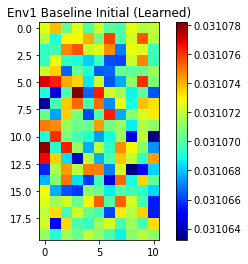

In [129]:
import matplotlib.pyplot as plt
plt.imshow(img_init, cmap='jet')
plt.title("Env1 Baseline Initial (Learned)")
plt.colorbar()
plt.show()

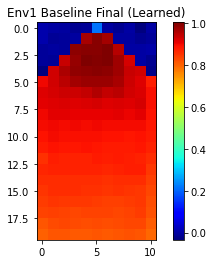

In [128]:
img_final = Network_Qtable(model,env)
plt.imshow(img_final, cmap='jet')
plt.title("Env1 Baseline Final (Learned)")
plt.colorbar()
plt.show()